## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_power"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["label"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "power"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.00000,3.4744,2.965,0.0,-0.25,0.090,0.213783
1,5.00000,3.4752,2.963,0.0,-0.25,0.092,0.219060
2,5.00000,3.4780,2.956,0.0,-0.25,0.098,0.236789
3,5.00000,3.4789,2.954,0.0,-0.25,0.100,0.242293
4,5.00000,3.4819,2.950,0.0,-0.25,0.106,0.257918
...,...,...,...,...,...,...,...
681298,10.25002,3.4812,0.032,7.0,0.50,0.801,2.156549
681299,10.25002,3.4776,-0.004,7.0,0.50,0.801,2.175802
681300,10.25002,3.4742,-0.038,7.0,0.50,0.800,2.194514
681301,10.25002,3.4701,-0.077,7.0,0.50,0.800,2.215902


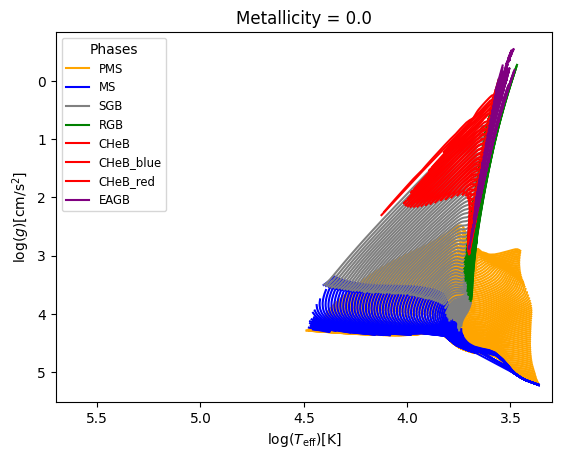

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.60000,4.4269,4.356,1.0,-0.25,9.714,0.535041
1,5.65000,4.4266,4.355,1.0,-0.25,9.714,0.535800
2,5.70000,4.4263,4.353,1.0,-0.25,9.714,0.536558
3,5.75000,4.4061,4.358,1.0,-0.25,8.856,0.514282
4,5.75000,4.4260,4.352,1.0,-0.25,9.714,0.537441
...,...,...,...,...,...,...,...
321691,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
321692,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
321693,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
321694,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


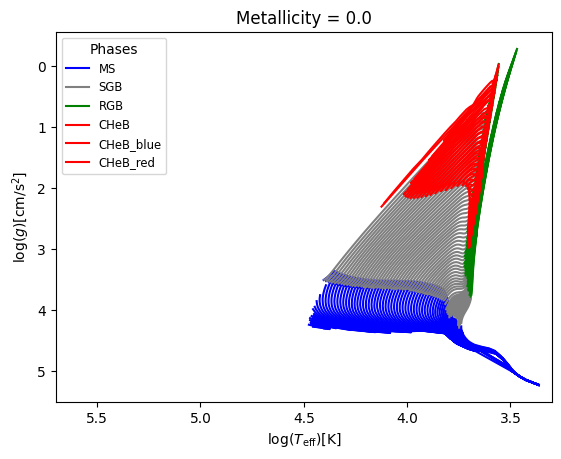

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

logAge  : Range : 5.3 - 10.25, Mean : 9.0428, Median : 9.3

logTe  : Range : 3.36 - 4.5177, Mean : 3.7779, Median : 3.721

logg  : Range : -0.38 - 5.345, Mean : 2.7607, Median : 2.486

Values in label column : 1.0, 2.0, 3.0, 4.0, 5.0, 6.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.25, -2.5, -2.75, 0.0, 0.25, 0.5 

Mass  : Range : 0.09 - 13.952, Mean : 2.6725, Median : 1.428

Rpol  : Range : -0.98 - 2.8373, Mean : 0.9648, Median : 1.0158



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.5177
Median value in train data for the logTe parameter: 3.721
Mean value in train data for the logTe parameter: 3.777965141417156

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.486
Mean value in train data for the logg parameter: 2.761182341921151

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.8372727025023003
Median value in train data for the Rpol parameter: 1.015778756389041
Mean value in train data for the Rpol parameter: 0.9646120024510401

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.5177
Median value in test data for the logTe parameter: 3.721
Mean value in test data for the logTe parameter: 3.777738115487914

Range in test data for the logg parameter : -0.347 - 5.345
Median value in test data for the logg parameter: 2.486
Mean value in test data for the logg parameter: 2.75

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.599548254874145
  RMSE :  0.23181537260913754
  MAE :  0.18814754837145176
  MedAE :  0.13051788809483766
  CORR :  0.9280608576001408
  MAX_ER :  0.5543813282375183
  Percentiles : 
    75th percentile :  0.2704479760390761
    90th percentile :  0.42064263888491693
    95th percentile :  0.4669565388829976
    99th percentile :  0.5177666806681518

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.2470514899917956
  RMSE :  0.15642663672904406
  MAE :  0.12315148958296926
  MedAE :  0.09899531002180195
  CORR :  0.4973243661100871
  MAX_ER :  0.5015493611362576
  Percentiles : 
    75th percentile :  0.17597112409609938
    90th percentile :  0.26306344525935077
    95th percentile :  0.3174224261870851
    99th perc

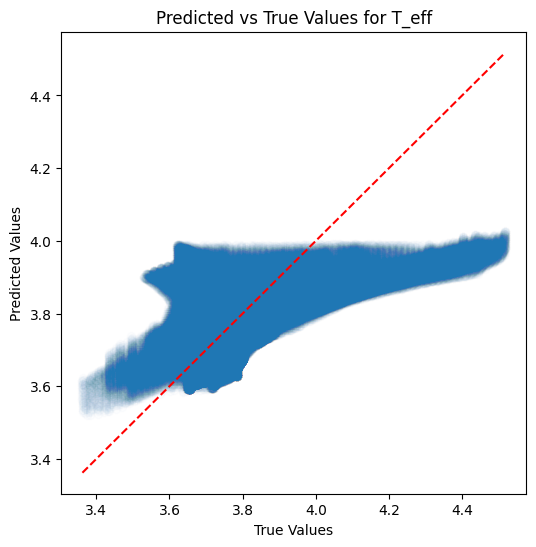

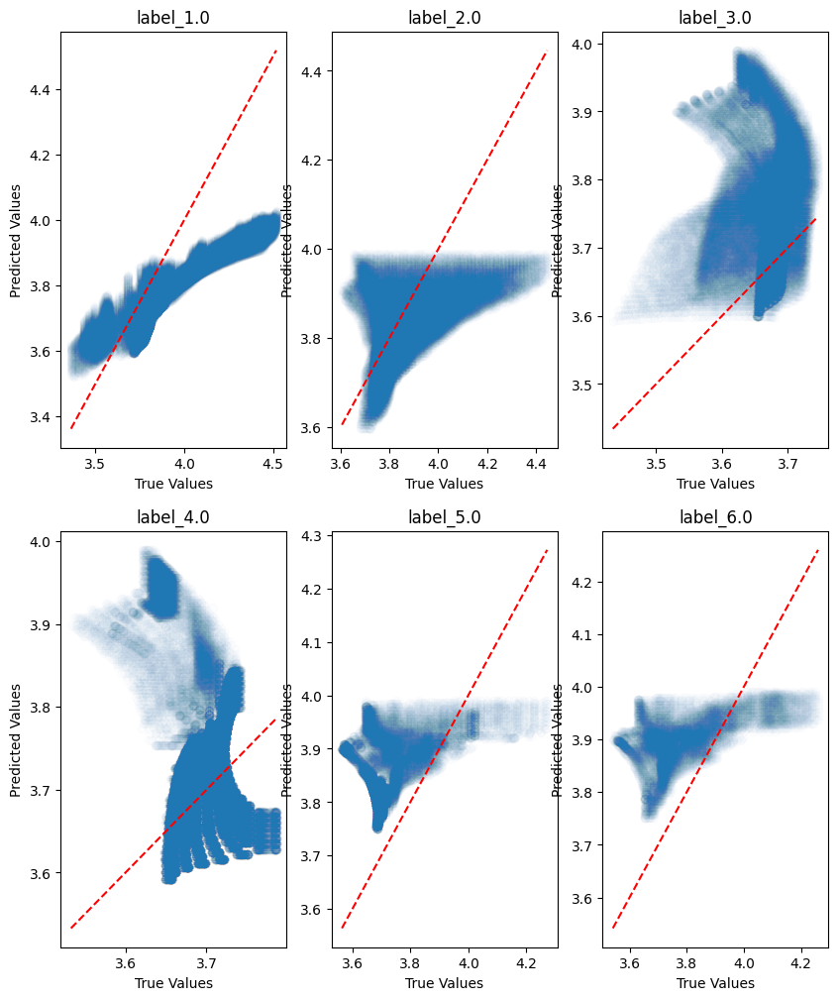

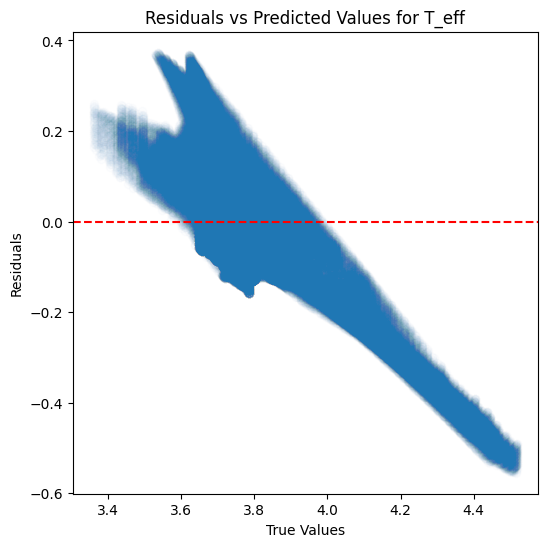

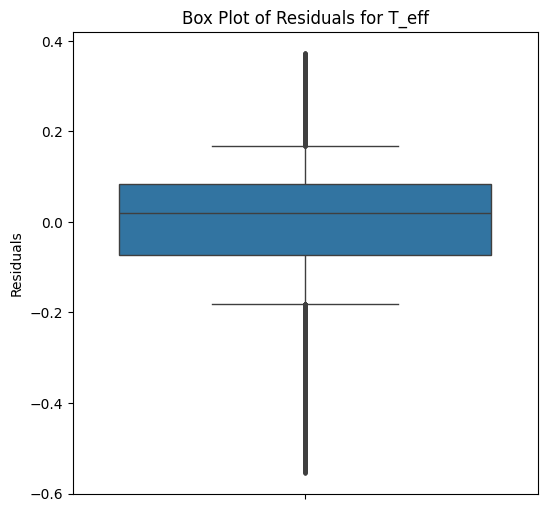

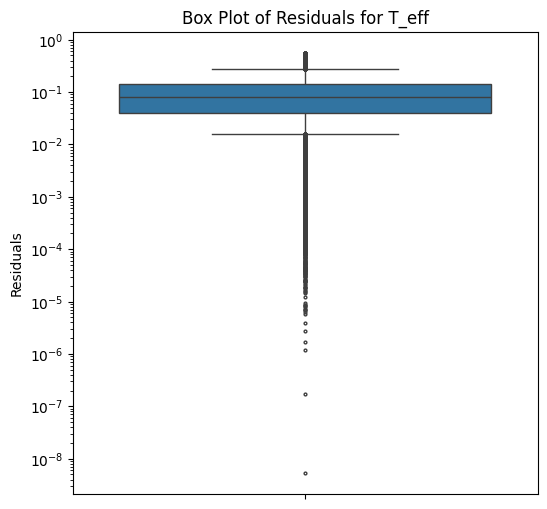

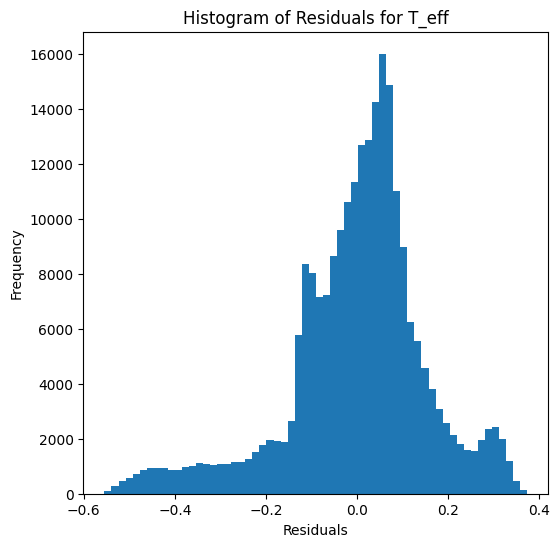

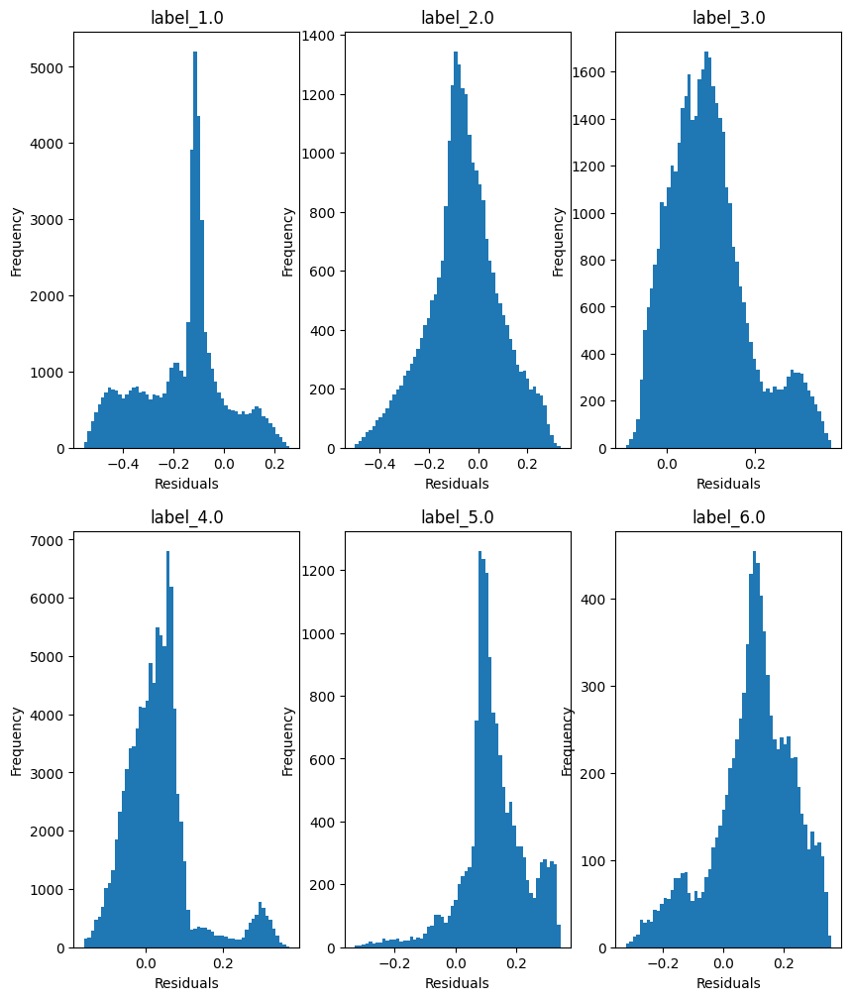

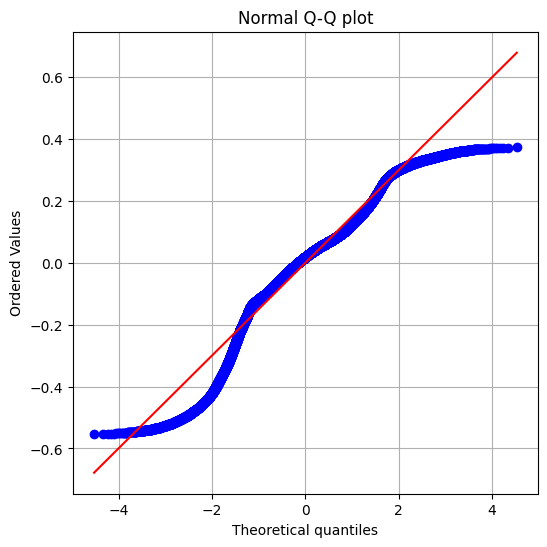

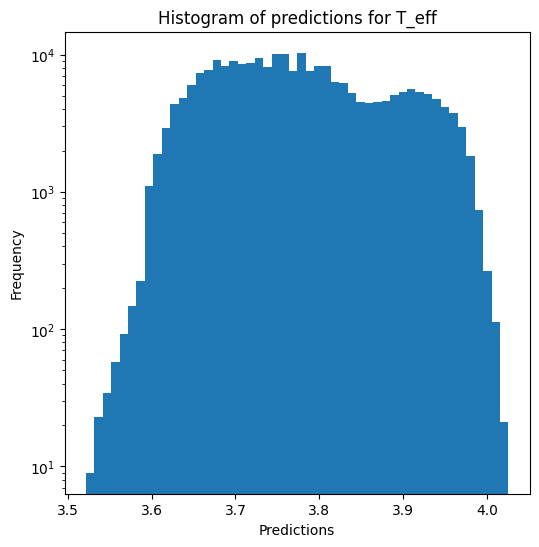

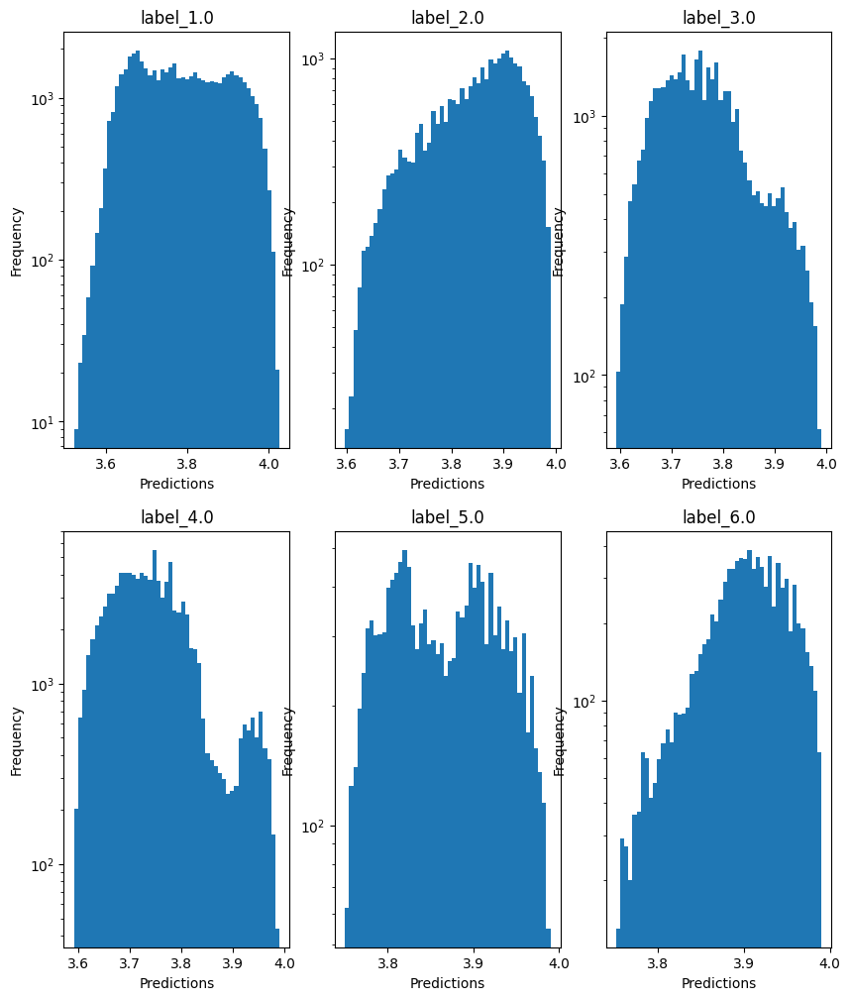

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -4.175206049409114
  RMSE :  1.3124188804314483
  MAE :  1.218884998566309
  MedAE :  1.266635611124097
  CORR :  0.7966359242548076
  MAX_ER :  2.3140565042510426
  Percentiles : 
    75th percentile :  1.596104310366281
    90th percentile :  1.8082652719150345
    95th percentile :  1.8939470330994788
    99th percentile :  2.013938662199832

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.2814406255147278
  RMSE :  0.8516828691573941
  MAE :  0.7395721335002722
  MedAE :  0.7368095685091434
  CORR :  0.6149835450492734
  MAX_ER :  2.03844537457708
  Percentiles : 
    75th percentile :  1.0554715600366666
    90th percentile :  1.2964130490130752
    95th percentile :  1.4494660993301705
    99th percentile :  1.6734173925367675

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823

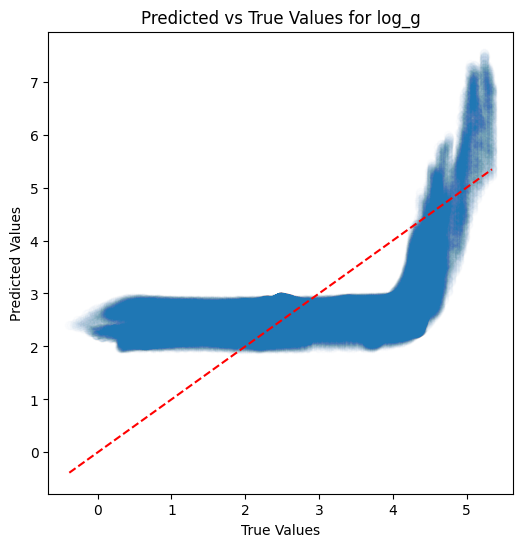

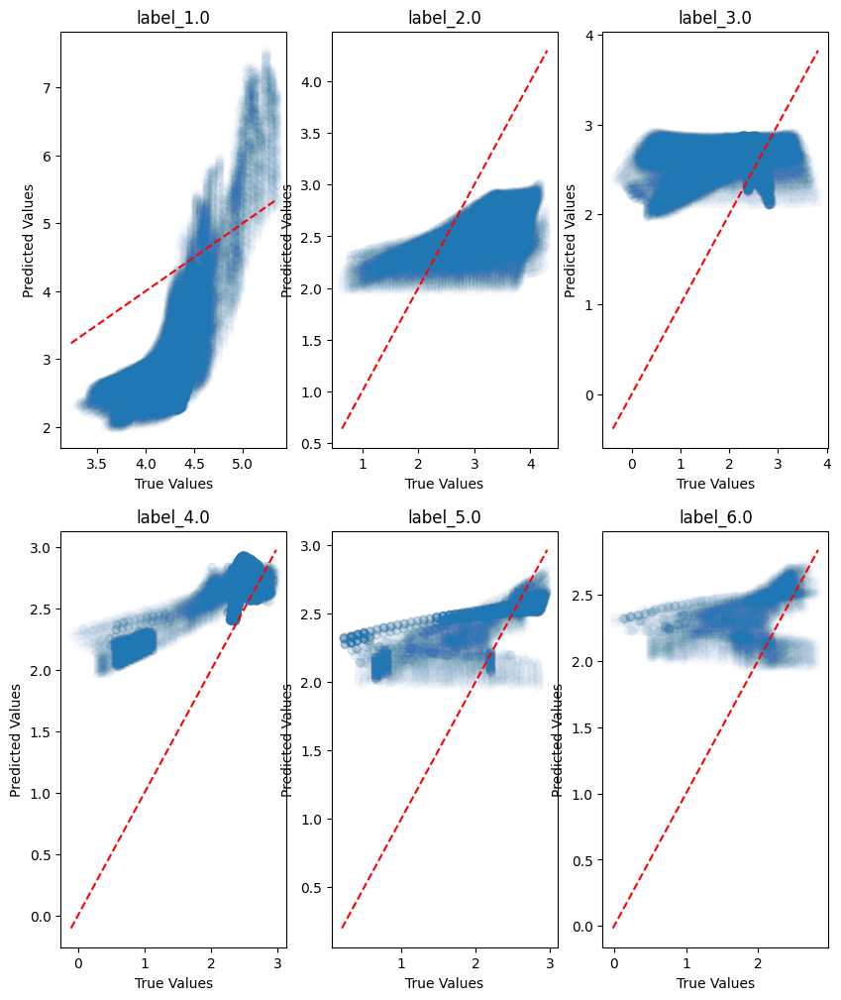

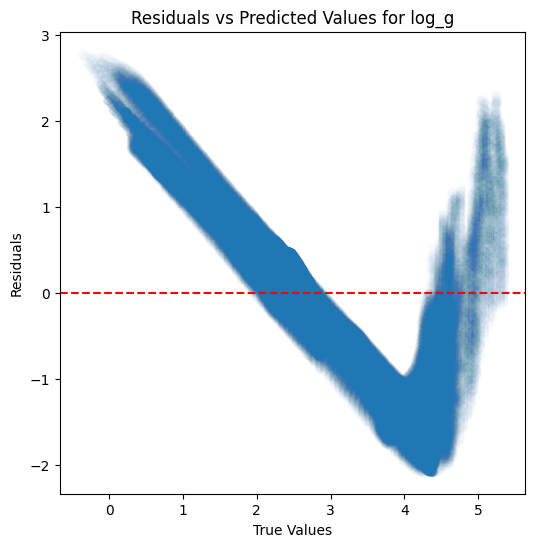

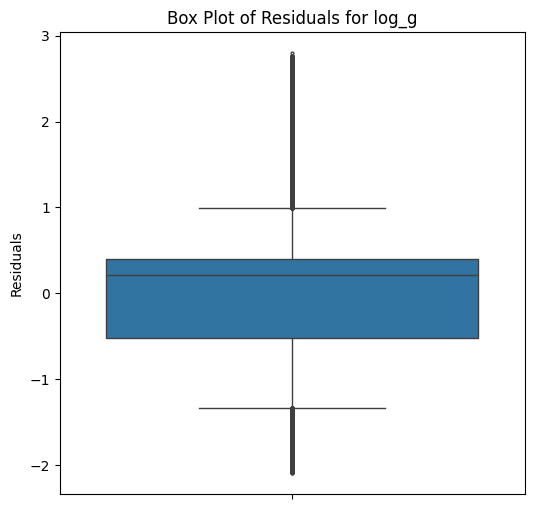

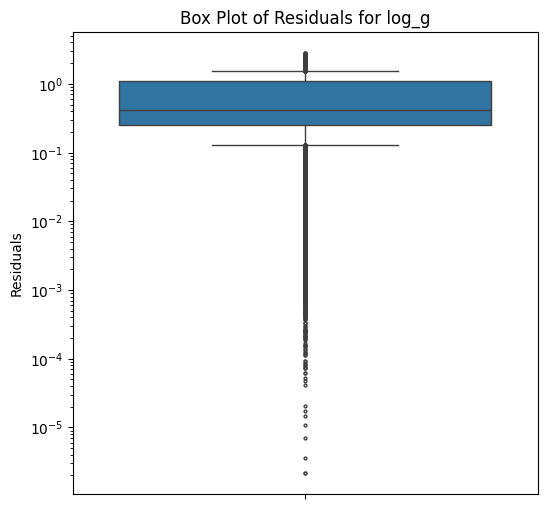

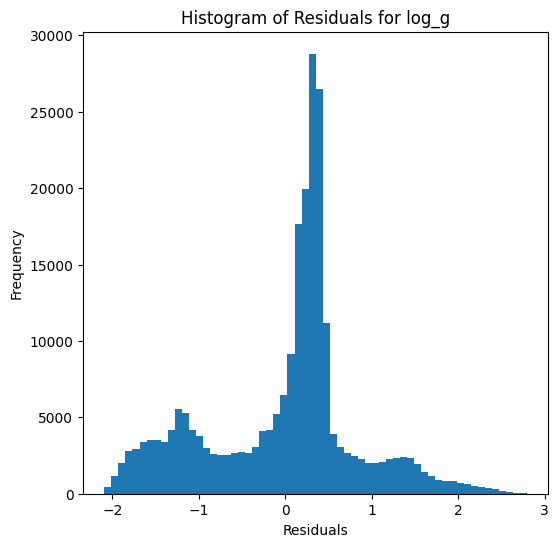

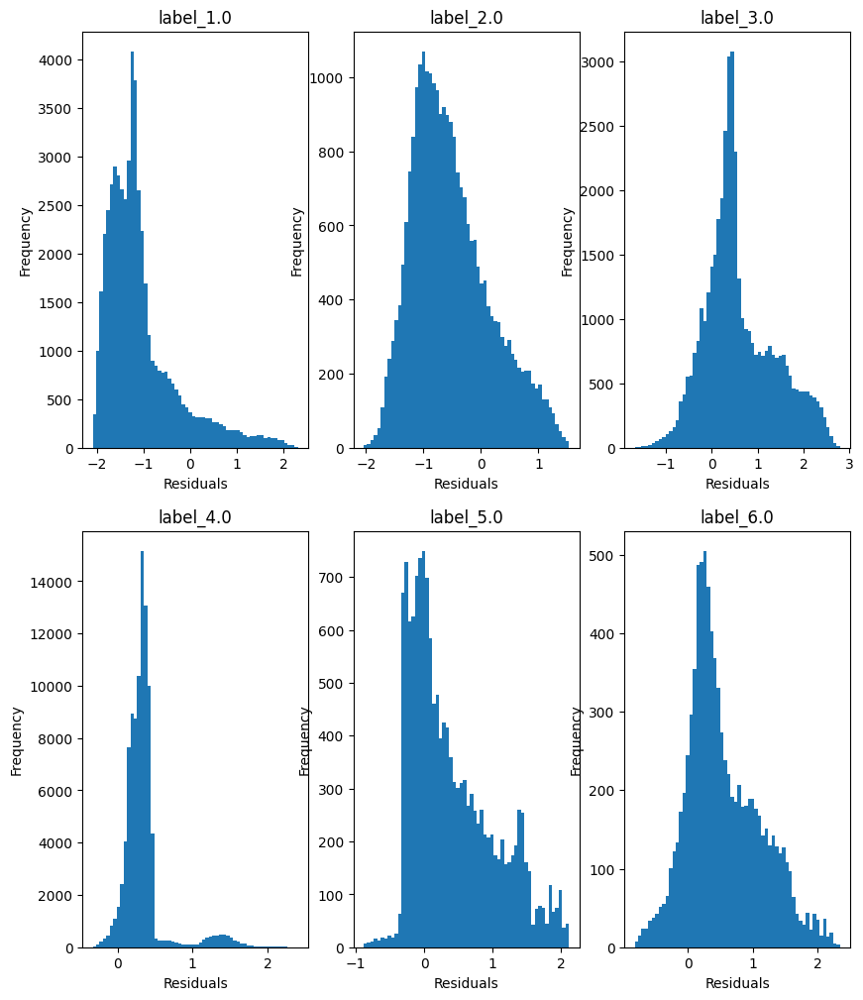

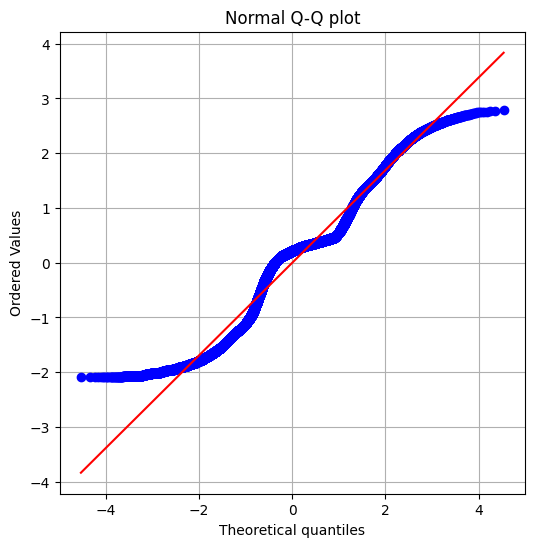

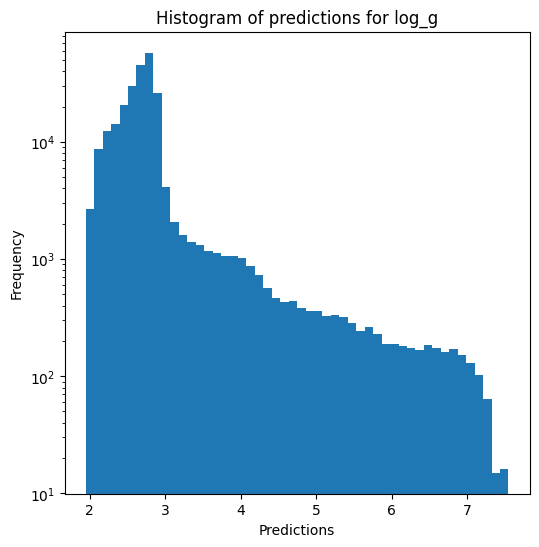

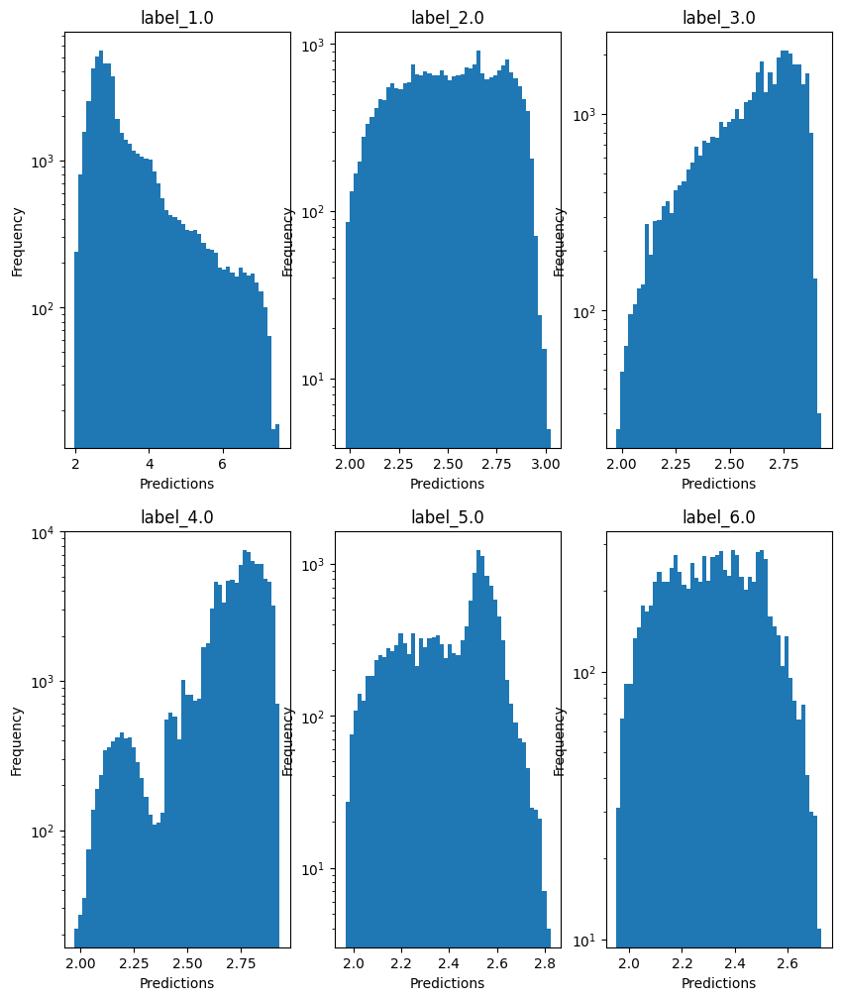


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  -0.14206133784661334
  RMSE :  0.6541435631168838
  MAE :  0.6095894564900852
  MedAE :  0.6426146121072526
  CORR :  0.9059249394544188
  MAX_ER :  1.1815919524381173
  Percentiles : 
    75th percentile :  0.7899324881654766
    90th percentile :  0.885075253855137
    95th percentile :  0.9237249284227446
    99th percentile :  0.9920355318673333

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5862983211742124
  RMSE :  0.43601611719925987
  MAE :  0.3817300110885468
  MedAE :  0.3842117434098861
  CORR :  0.8431423823546312
  MAX_ER :  1.0071688807171926
  Percentiles : 
    75th percentile :  0.5425186818766383
    90th percentile :  0.6604215055943435
    95th percentile :  0.7296365881389527
    99th percentile :  0.8249820116792811

radius results for the label category with a 

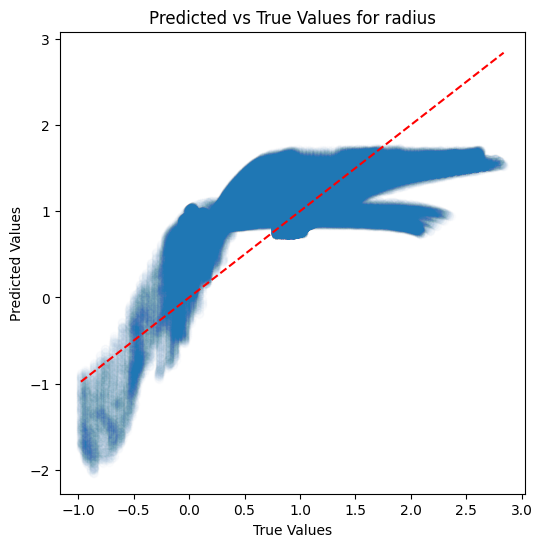

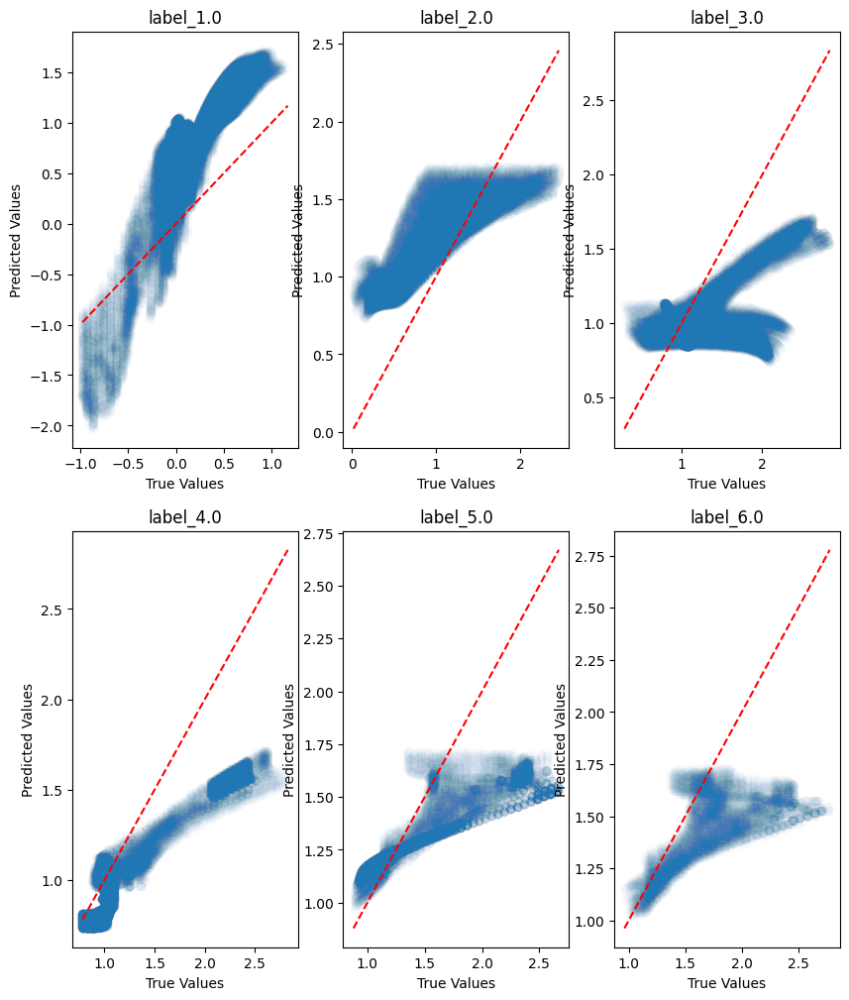

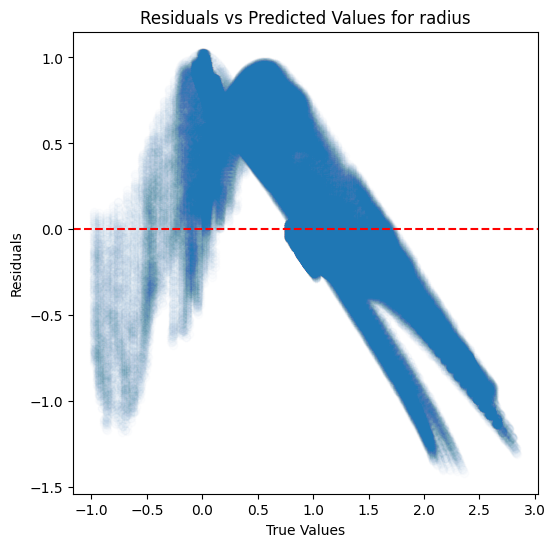

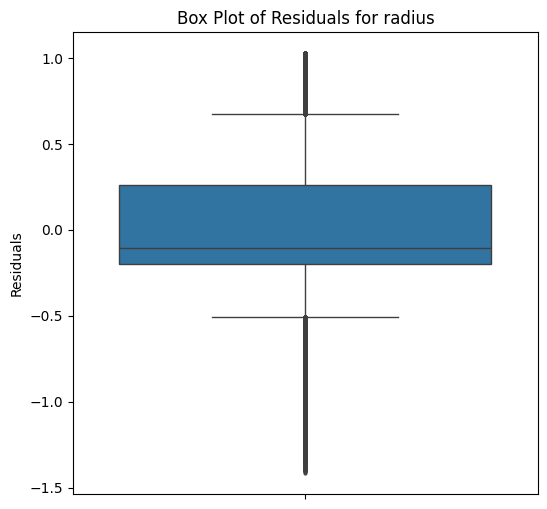

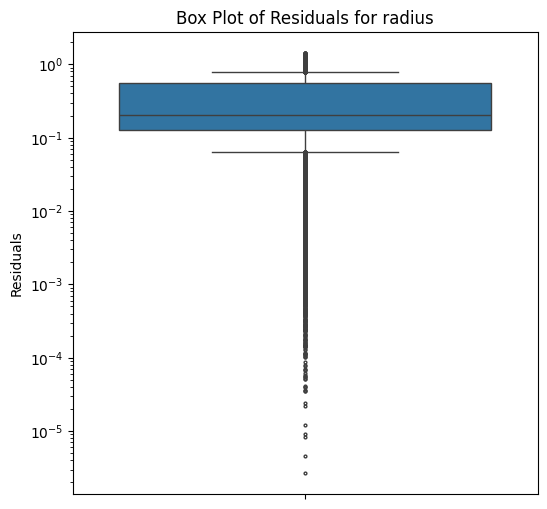

...

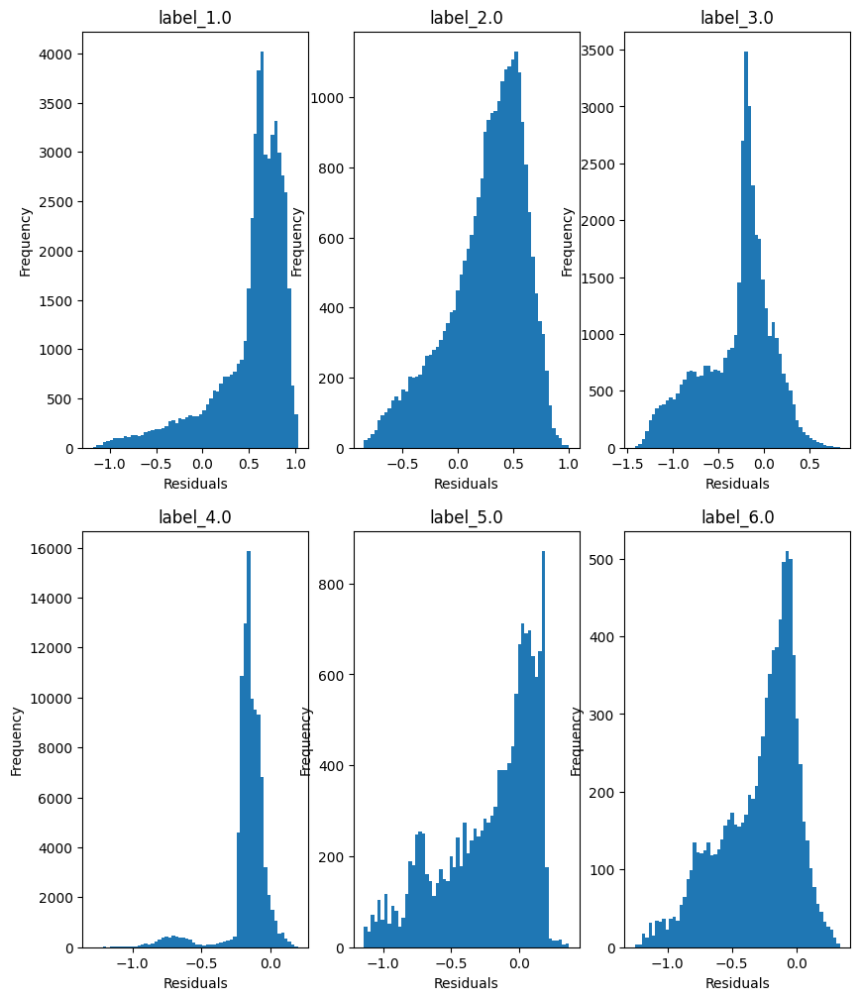

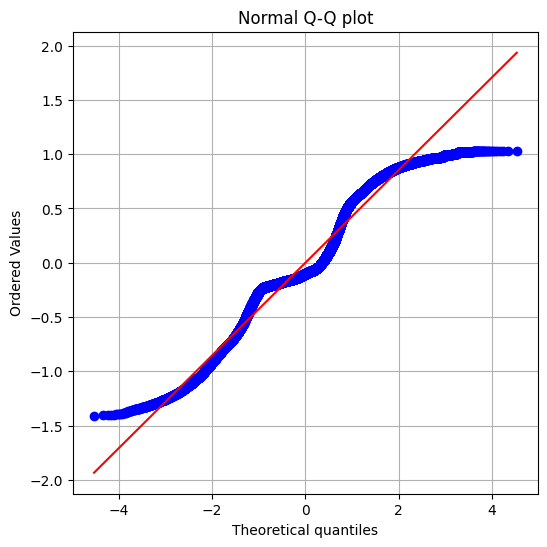

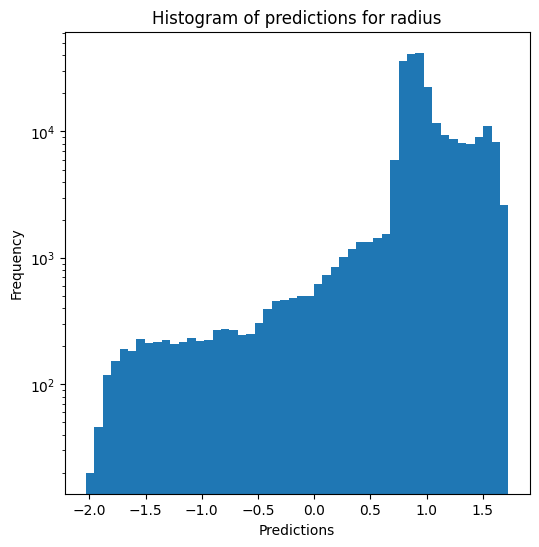

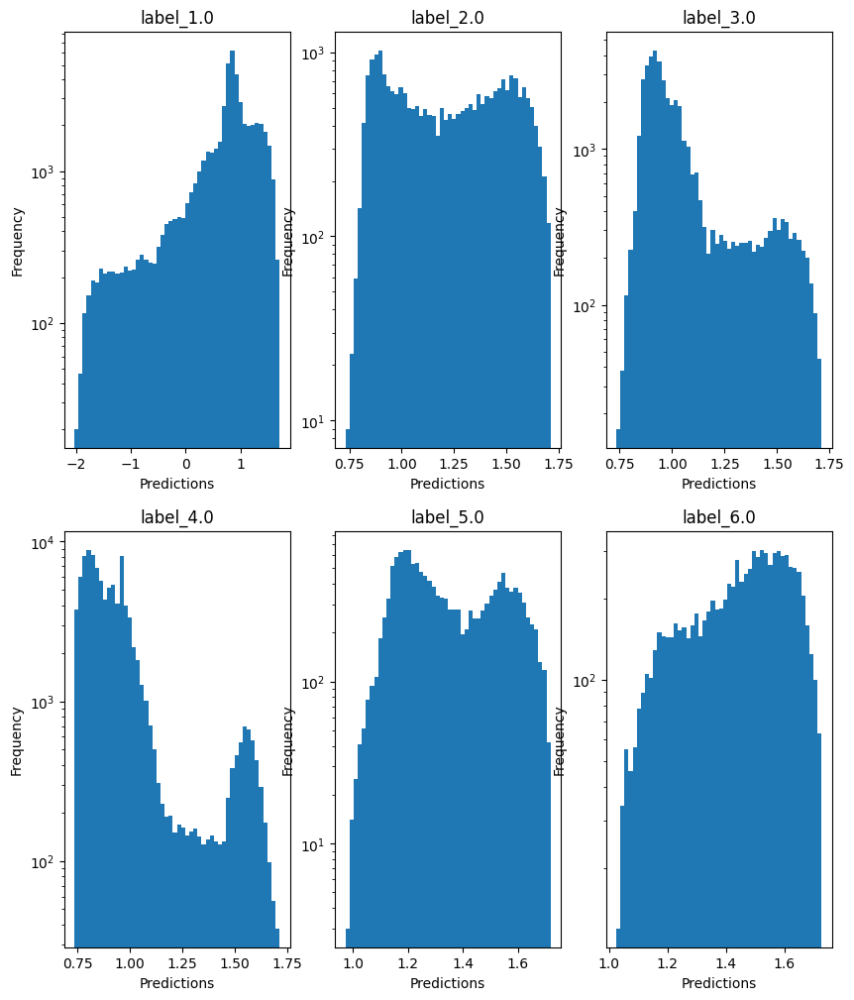

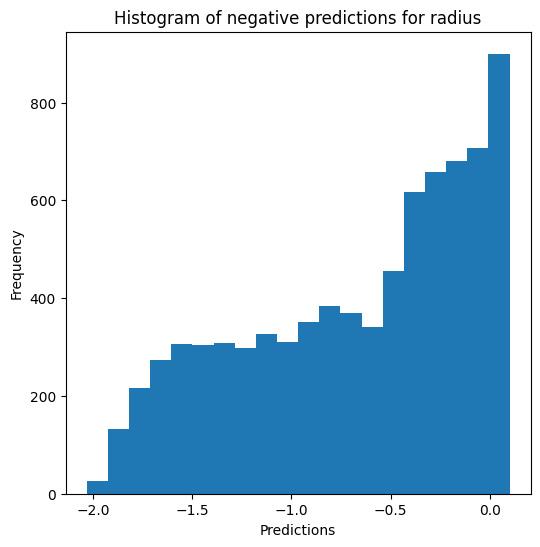

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...


c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9753031698008416
  RMSE :  0.04197936426549016
  MAE :  0.007407100692190342
  MedAE :  4.999999999988347e-05
  CORR :  0.9878284091690117
  MAX_ER :  0.8311642857142854
  Percentiles : 
    75th percentile :  0.001100000000000101
    90th percentile :  0.009800000000000253
    95th percentile :  0.024700000000000166
    99th percentile :  0.1410224999999996

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8744415256893818
  RMSE :  0.062129597377047284
  MAE :  0.03367641467681891
  MedAE :  0.015225000000000266
  CORR :  0.9449869914976895
  MAX_ER :  0.8240999999999996
  Percentiles : 
    75th percentile :  0.037200000000000344
    90th percentile :  0.08589449999999994
    95th percentile :  0.14090000000000025
    99th percentile :  0.23909859999999972

T_eff results for the label category with a value of 3.0


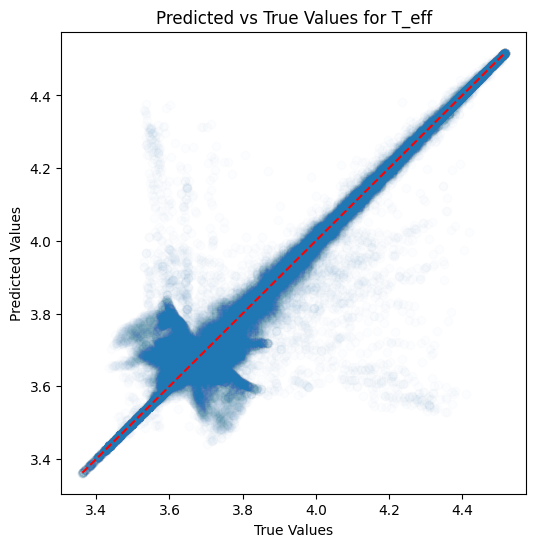

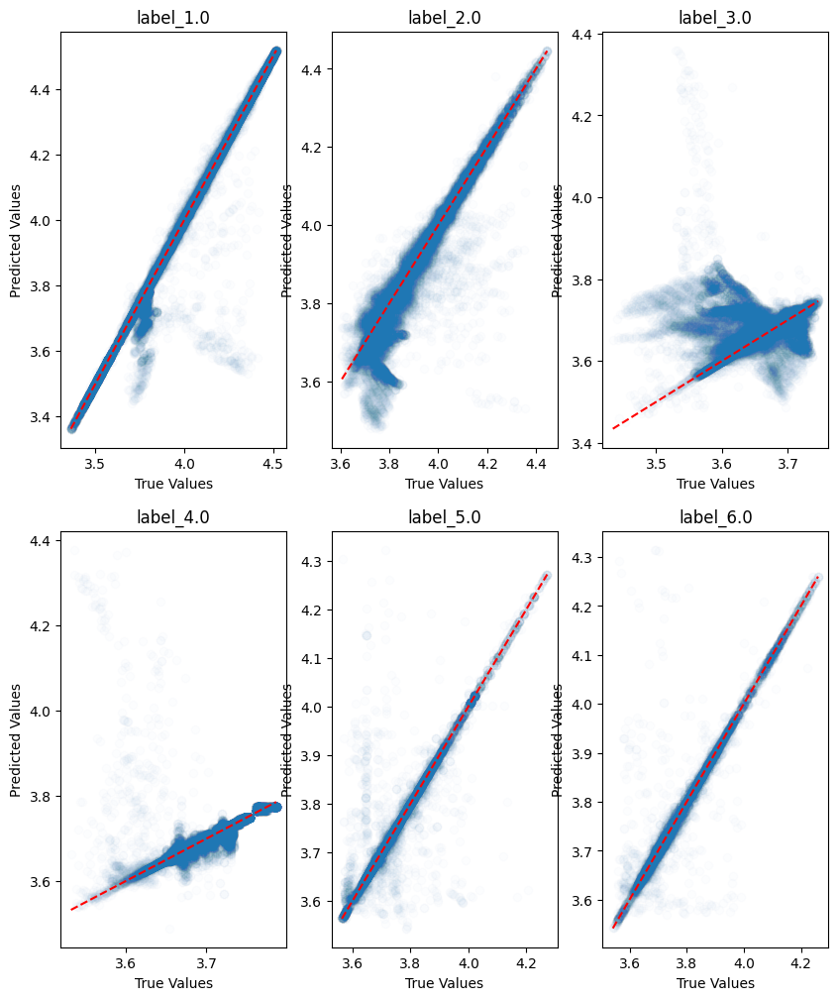

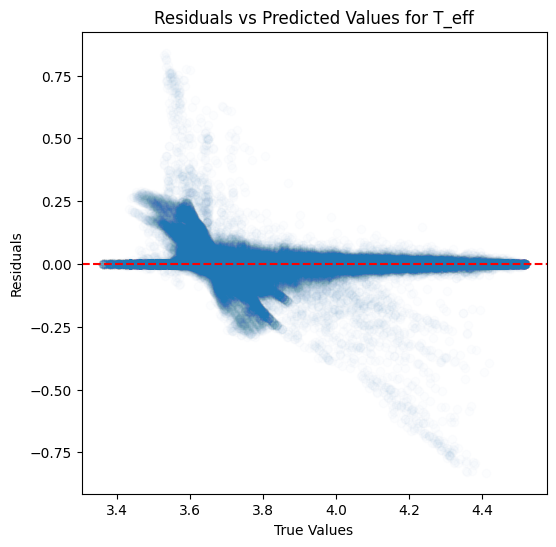

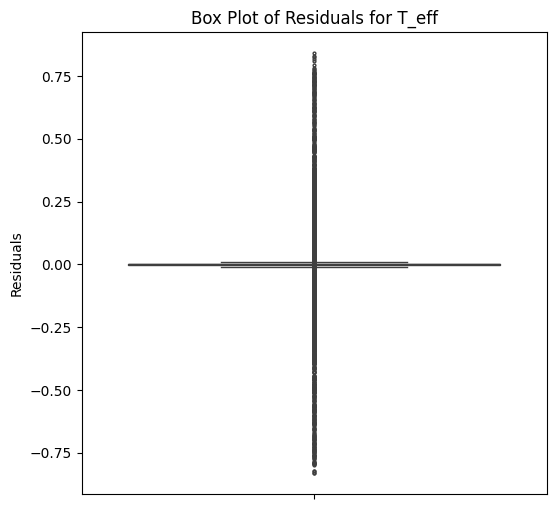

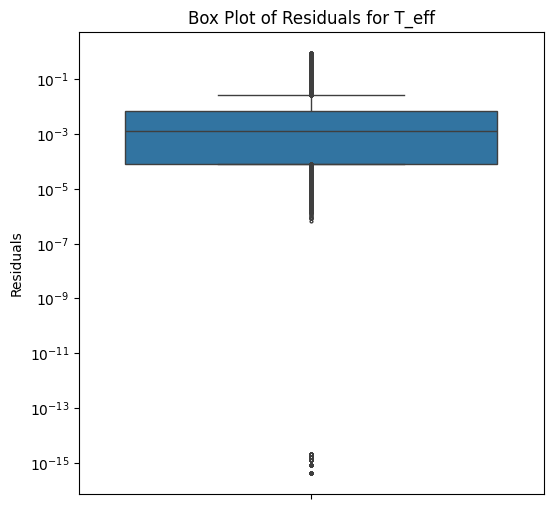

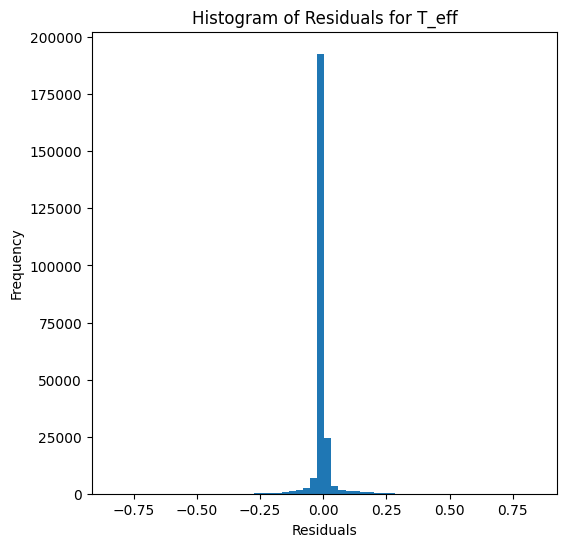

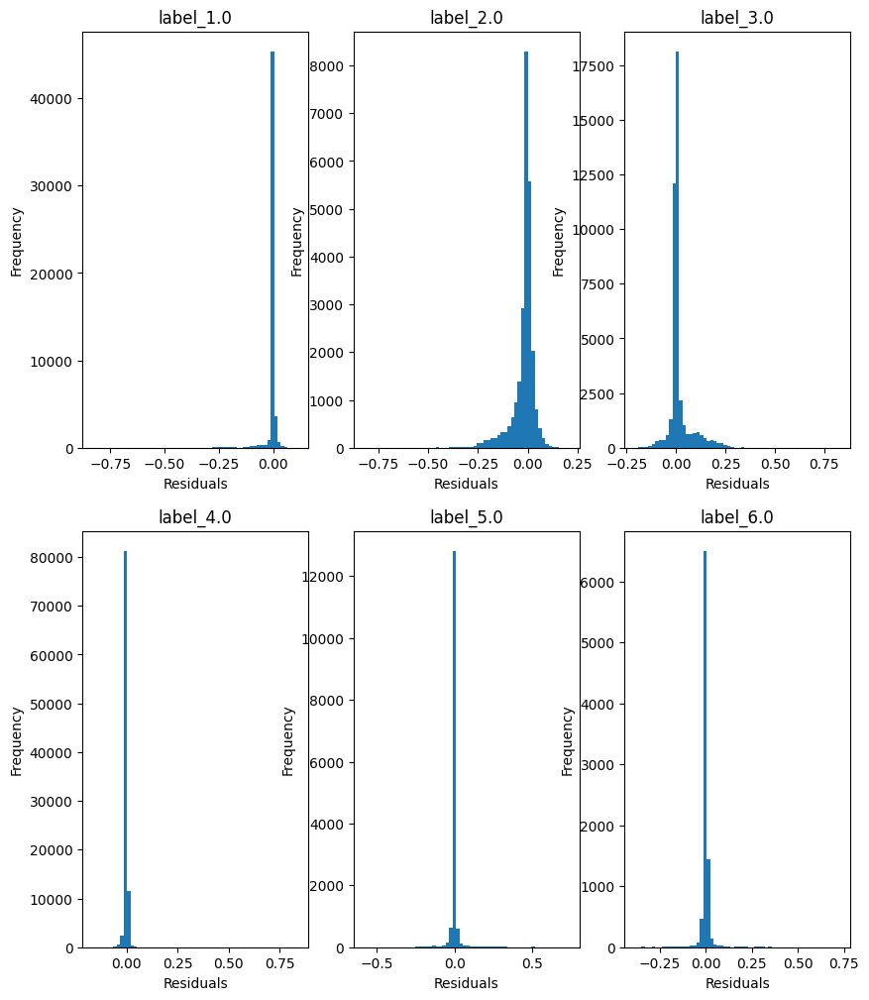

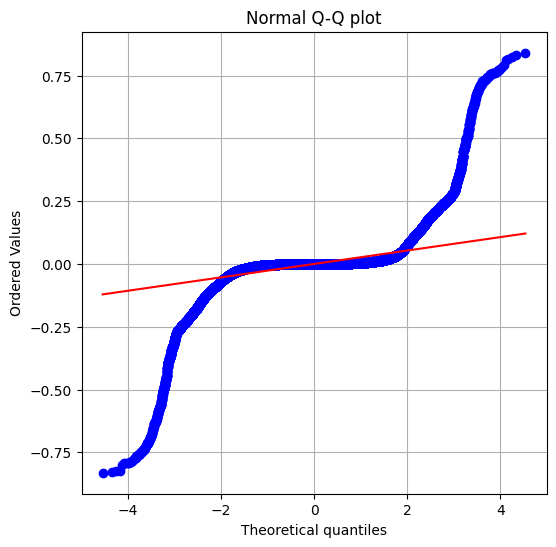

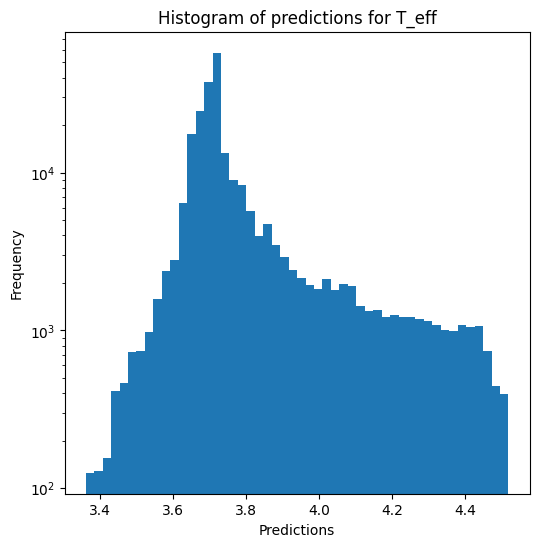

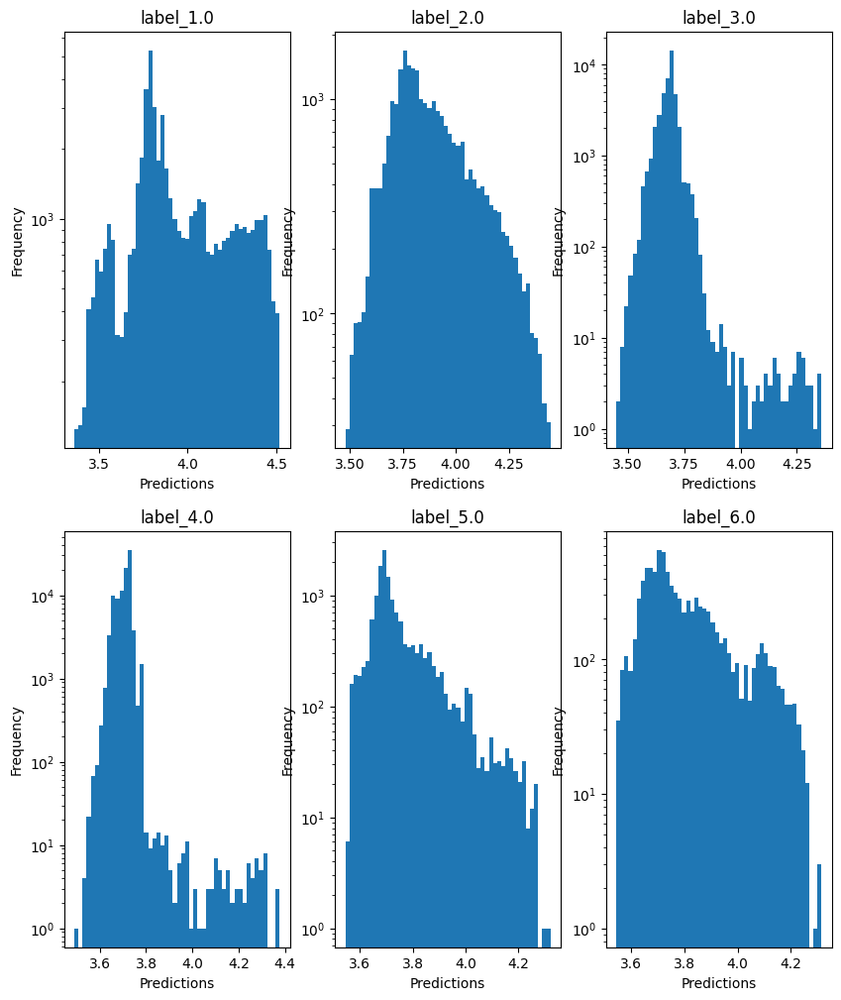

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.20556160478270935
  RMSE :  0.3776511067416562
  MAE :  0.0670786550167147
  MedAE :  0.0007500000000000284
  CORR :  0.7077035551914663
  MAX_ER :  4.779999999999999
  Percentiles : 
    75th percentile :  0.005999999999999339
    90th percentile :  0.0259999999999998
    95th percentile :  0.06499999999999995
    99th percentile :  1.9671749999999992

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.21063946678256884
  RMSE :  0.7518633680143114
  MAE :  0.3015038989479195
  MedAE :  0.06000000000000005
  CORR :  0.6574083253353311
  MAX_ER :  4.171
  Percentiles : 
    75th percentile :  0.15599999999999997
    90th percentile :  1.010575757575757
    95th percentile :  1.7682999999999955
    99th percentile :  3.3697200000000014

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.4313

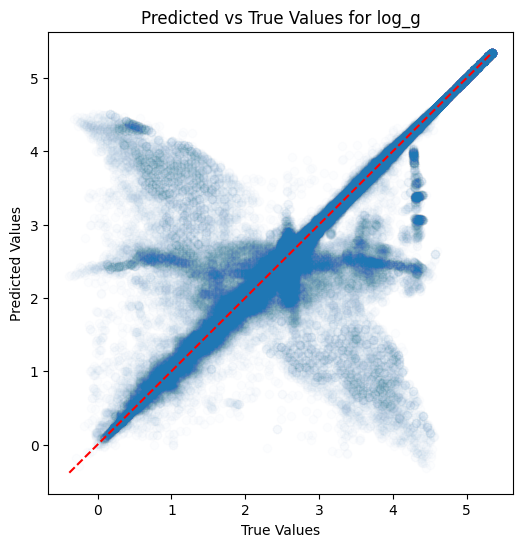

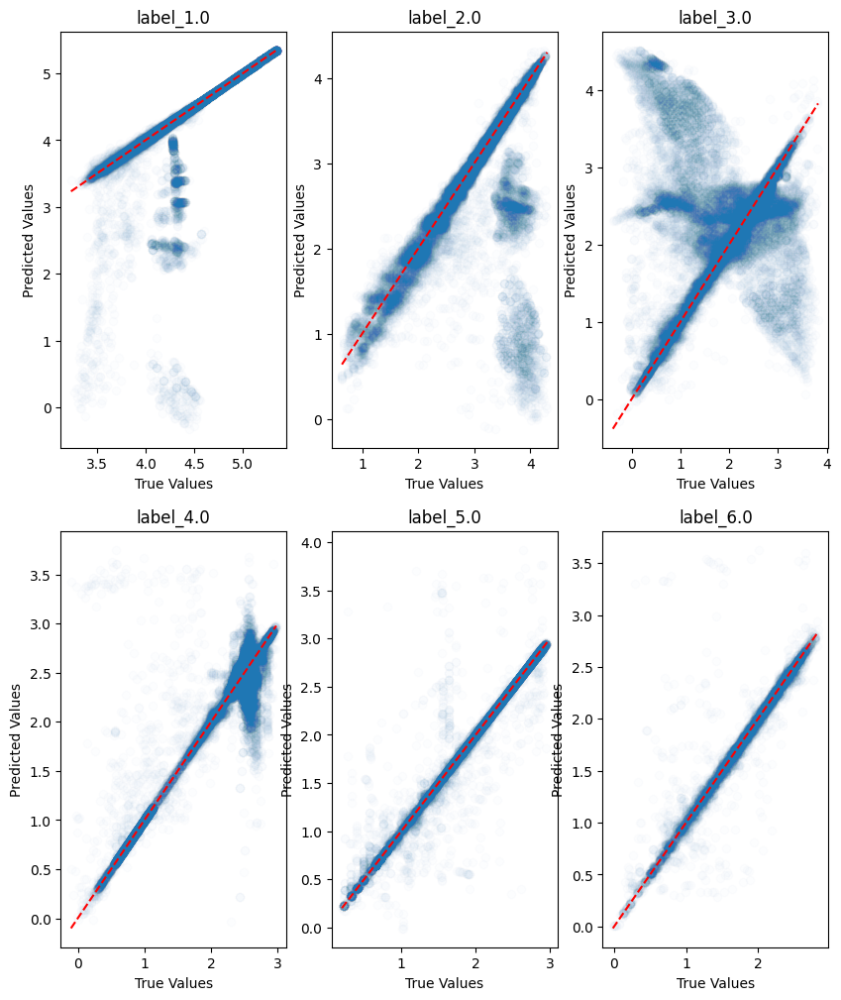

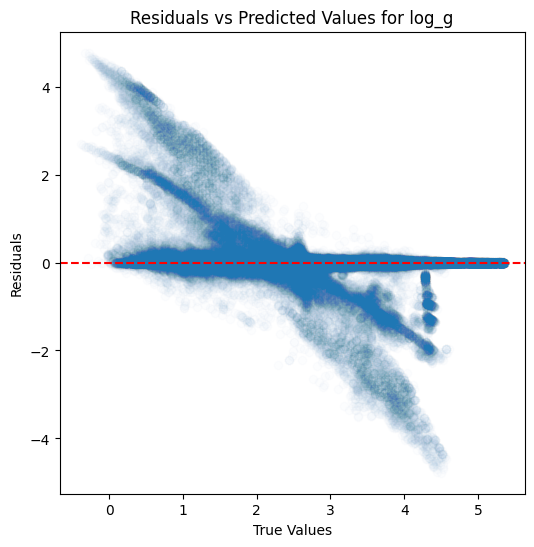

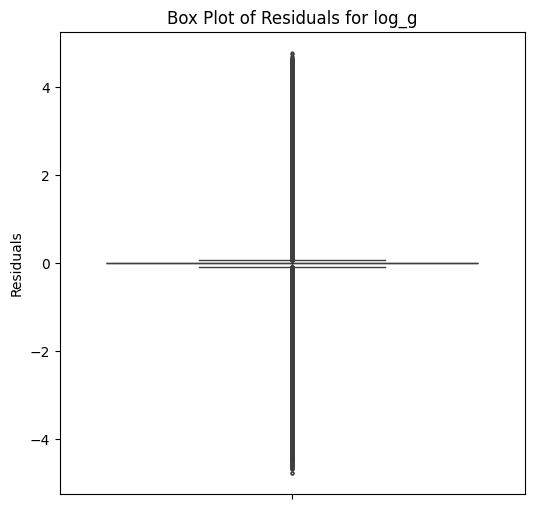

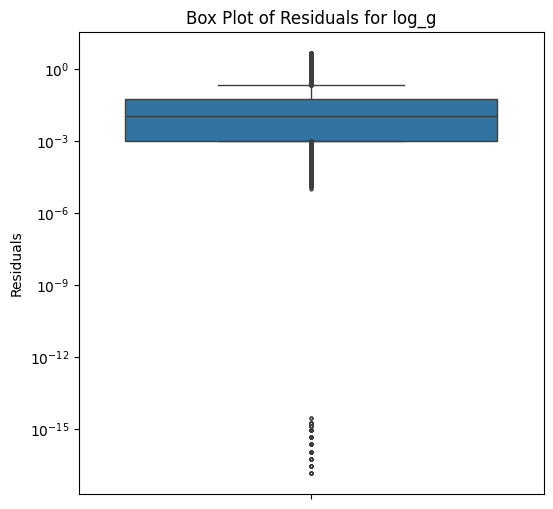

...

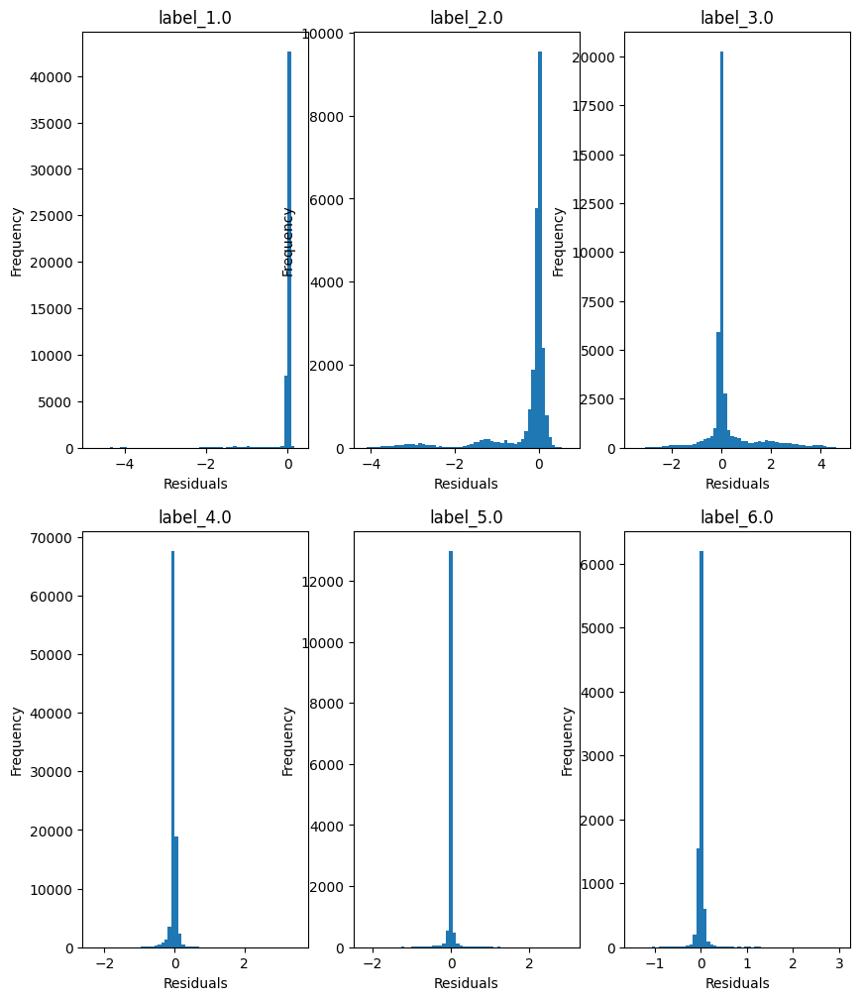

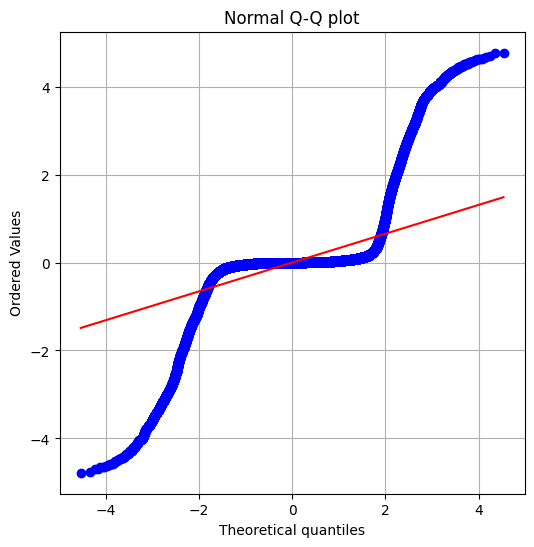

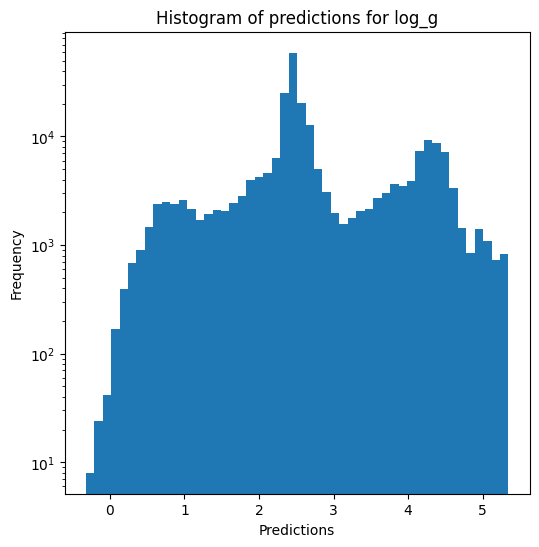

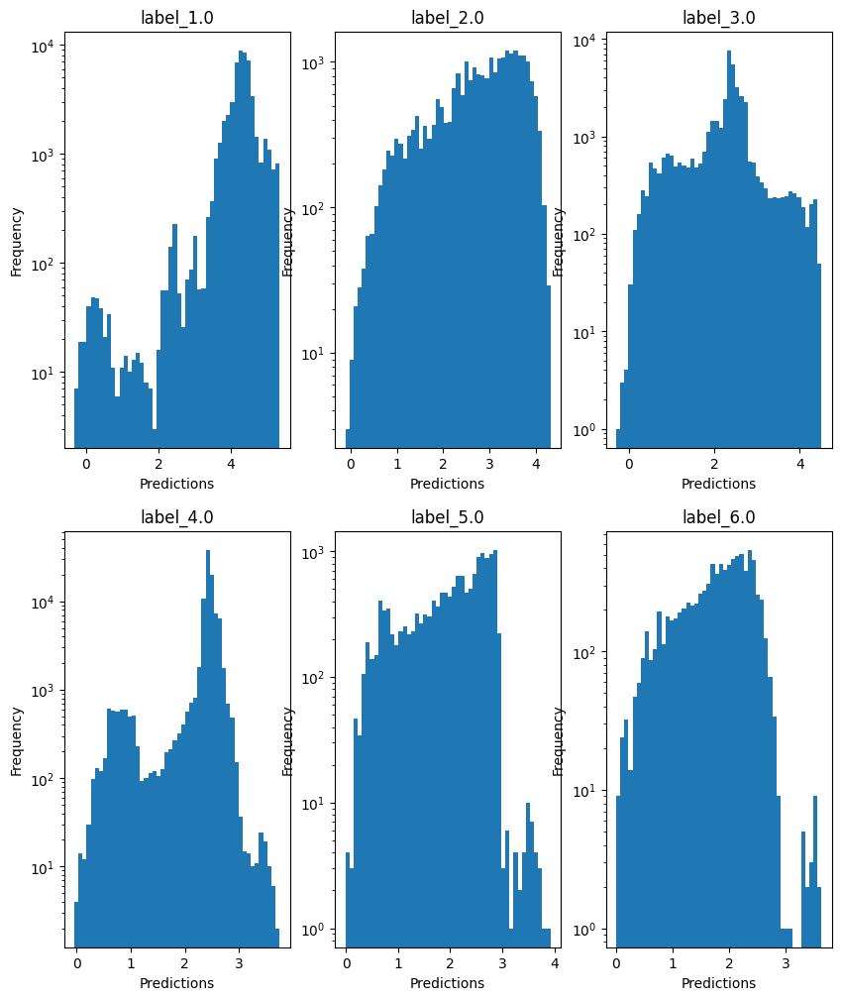

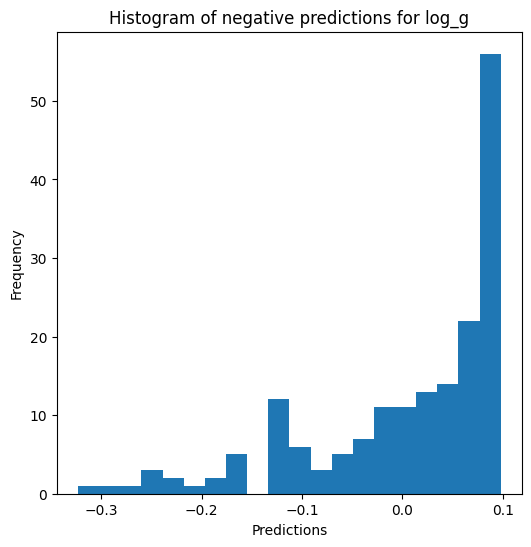

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.7401345884210887
  RMSE :  0.18906073147752028
  MAE :  0.03389098152317894
  MedAE :  0.00039910653829717396
  CORR :  0.8923579243420225
  MAX_ER :  2.390815363619212
  Percentiles : 
    75th percentile :  0.0033423263199200935
    90th percentile :  0.014573842149435828
    95th percentile :  0.03426700194518342
    99th percentile :  0.9838915178375456

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5697500422865627
  RMSE :  0.37595149519305493
  MAE :  0.15081849746664502
  MedAE :  0.030145950454656456
  CORR :  0.7825133738100766
  MAX_ER :  2.0861071059413177
  Percentiles : 
    75th percentile :  0.07803202097413175
    90th percentile :  0.5051124747636347
    95th percentile :  0.8842563844552089
    99th percentile :  1.6848710827913527

radius results for the label ca

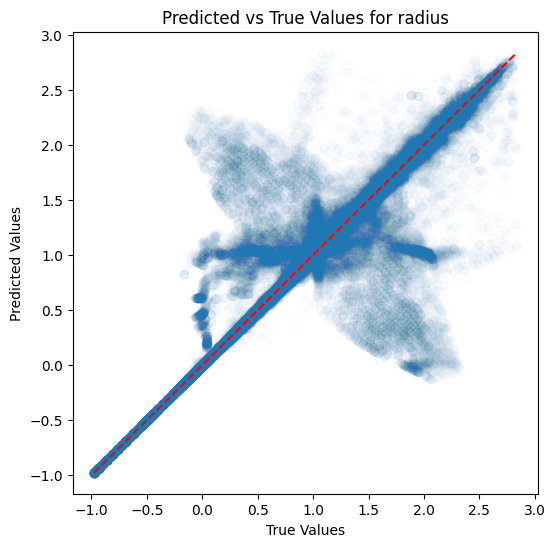

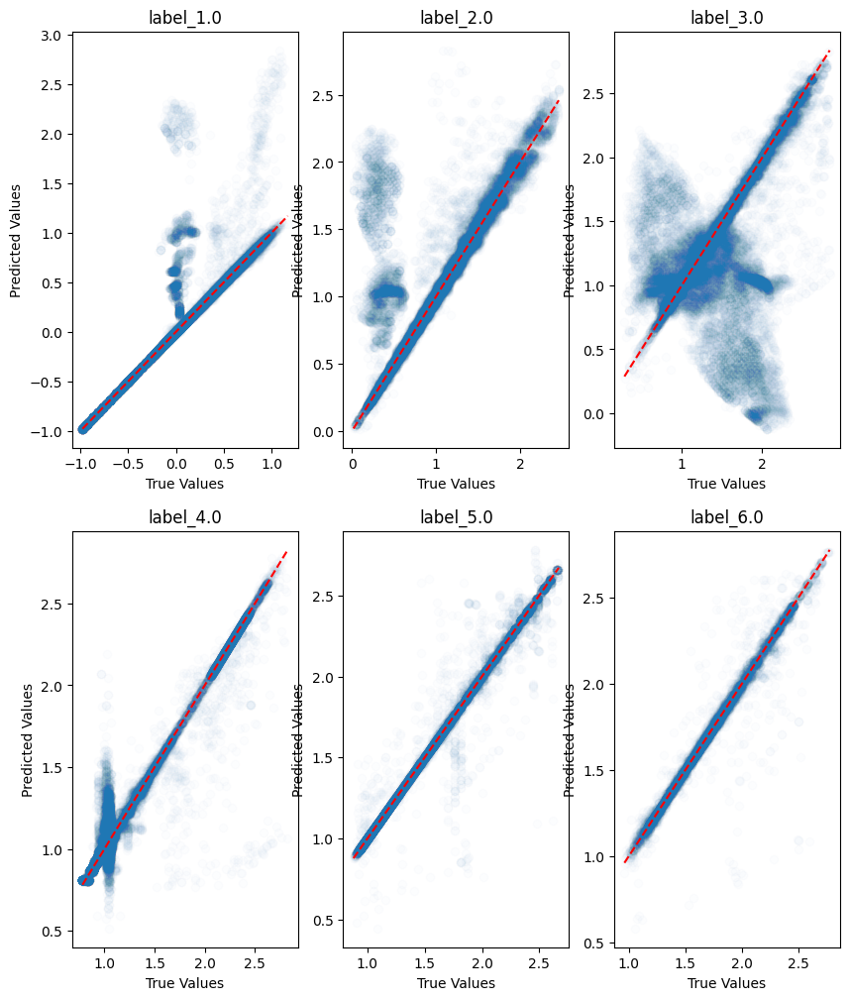

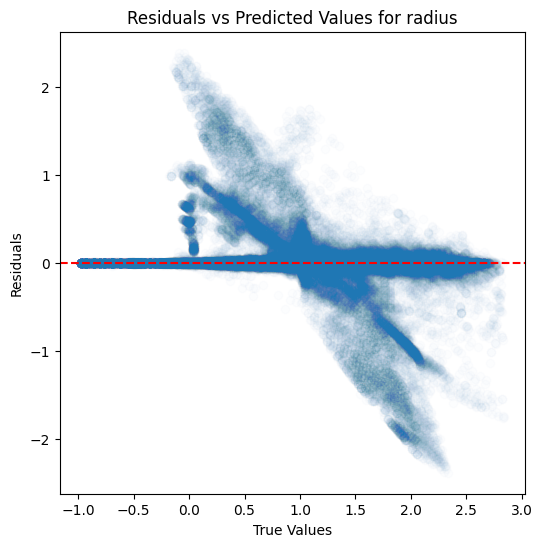

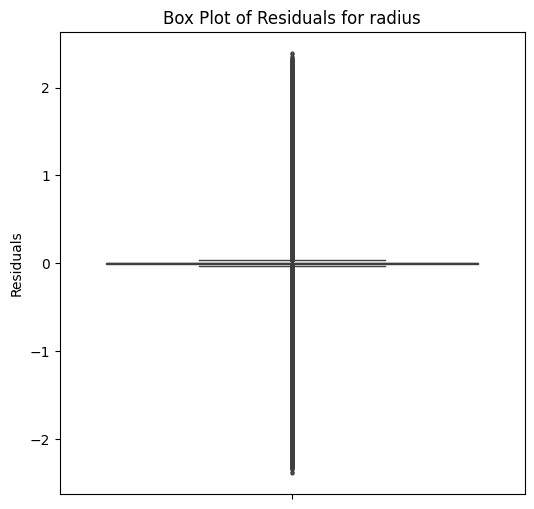

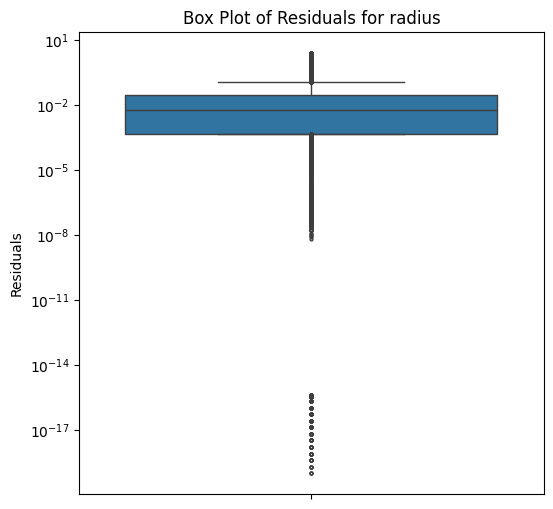

...

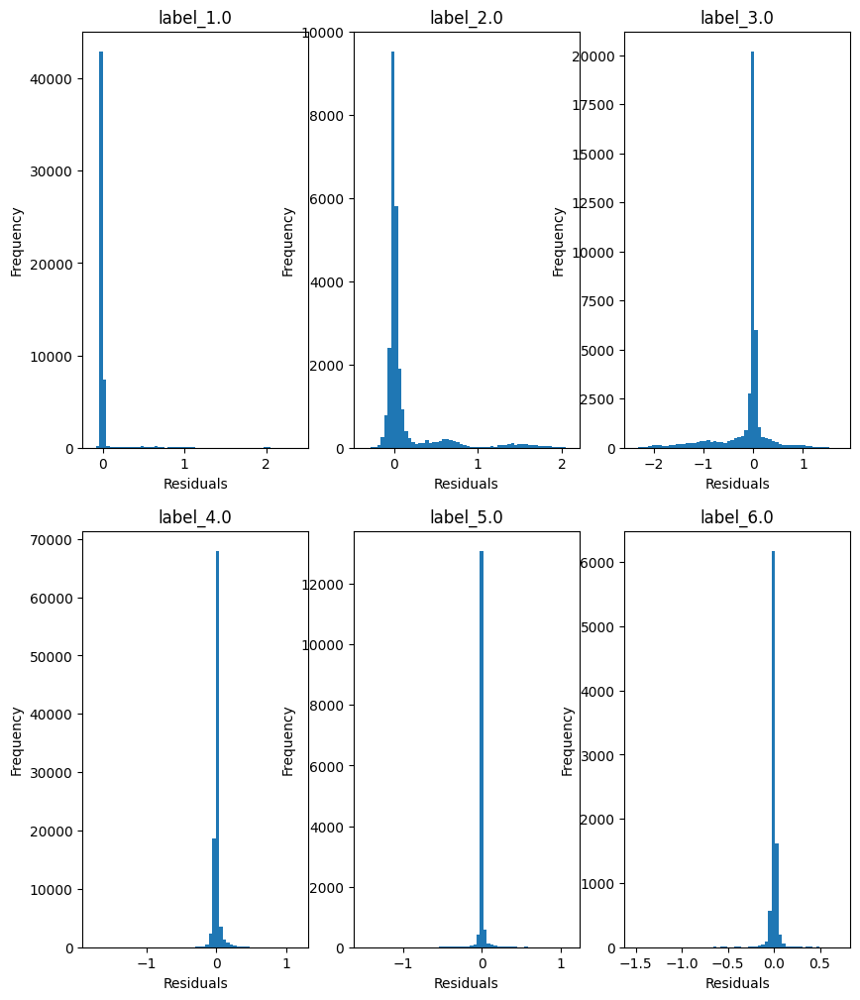

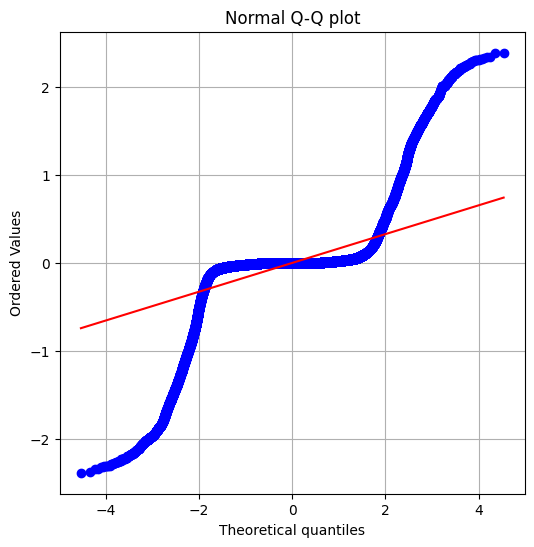

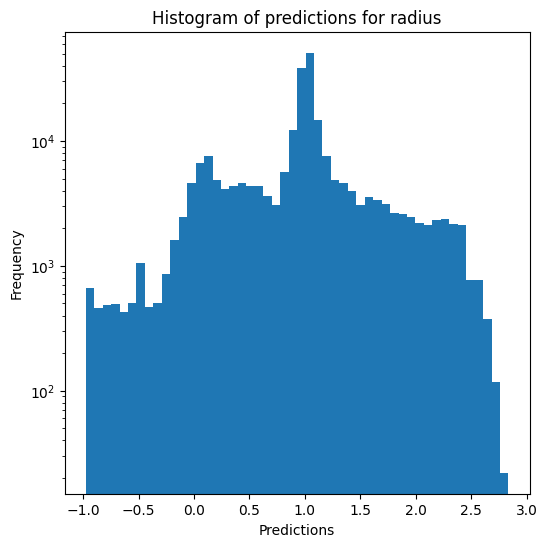

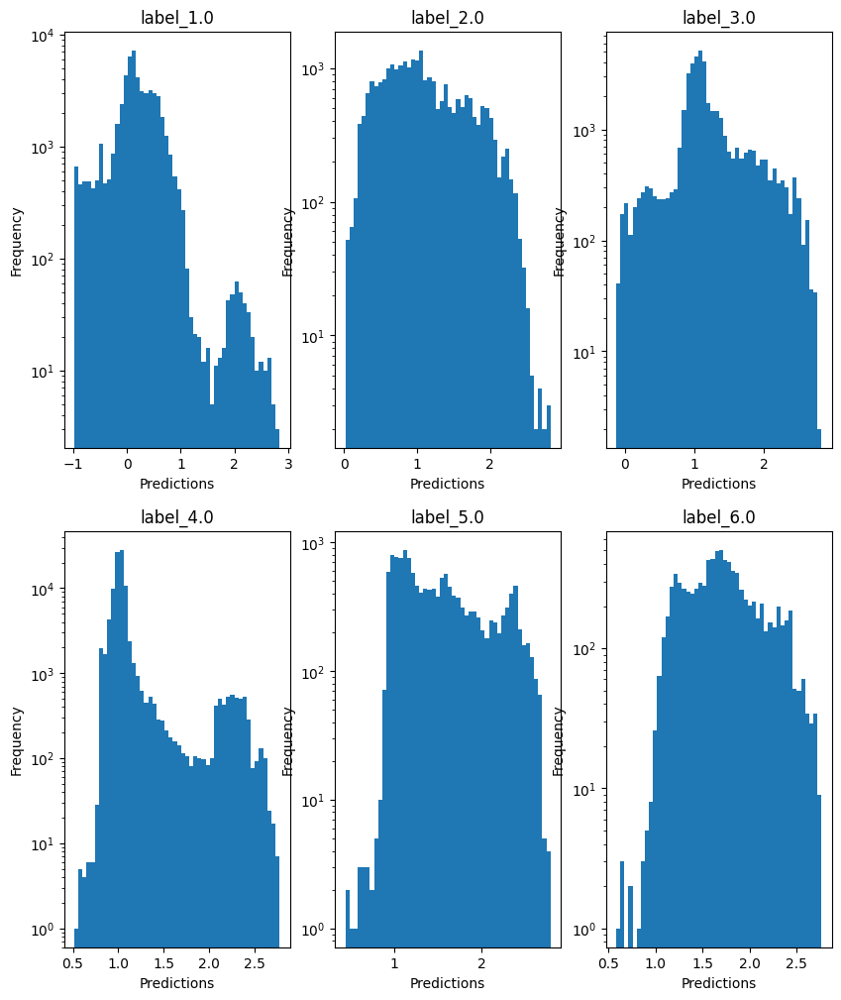

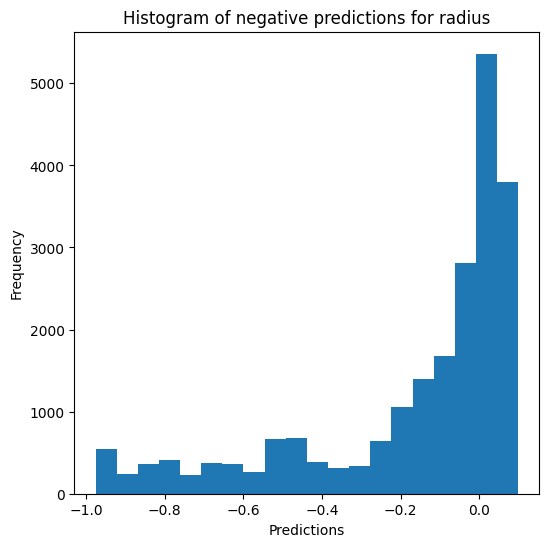

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9821080295591219
  RMSE :  0.03584169968280059
  MAE :  0.009211451313345718
  MedAE :  0.0019599999999995177
  CORR :  0.9911440527978378
  MAX_ER :  0.7777799999999999
  Percentiles : 
    75th percentile :  0.005419999999999536
    90th percentile :  0.019220000000000237
    95th percentile :  0.0389200000000004
    99th percentile :  0.12432099999999961

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9082891600424591
  RMSE :  0.05772883093690898
  MAE :  0.0378650829200248
  MedAE :  0.024220000000000352
  CORR :  0.9558394593038567
  MAX_ER :  0.6360600000000005
  Percentiles : 
    75th percentile :  0.05032000000000014
    90th percentile :  0.08834000000000053
    95th percentile :  0.11884599999999988
    

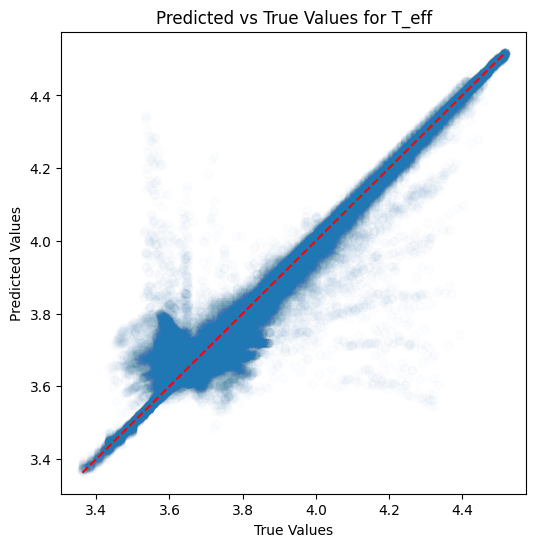

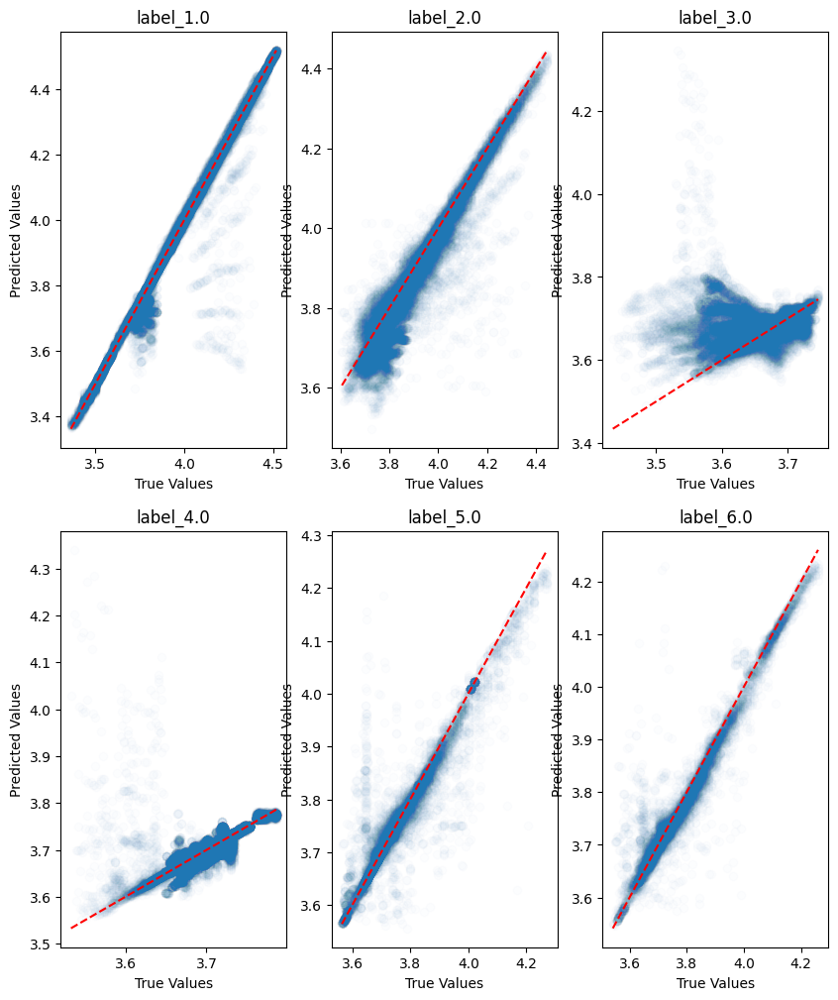

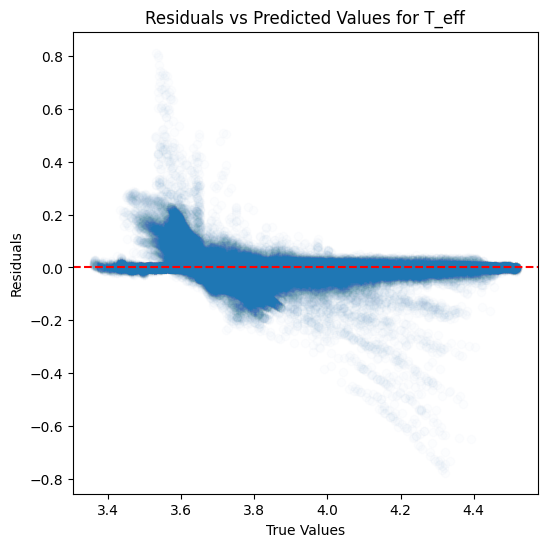

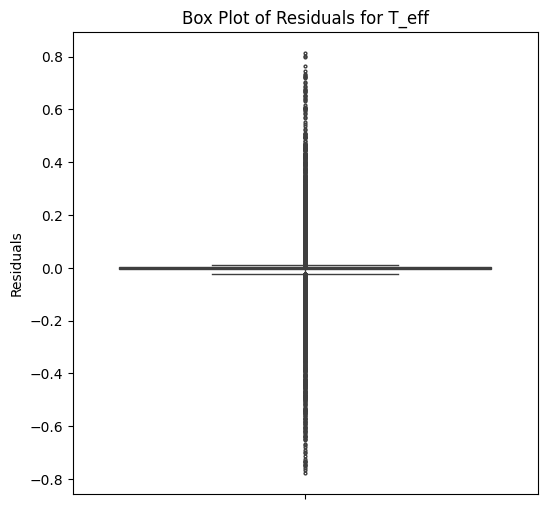

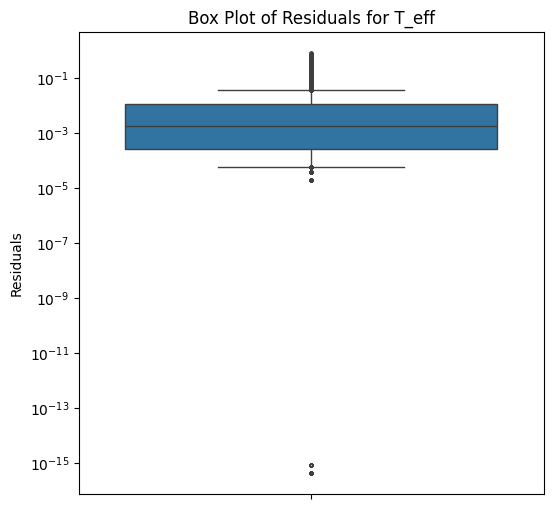

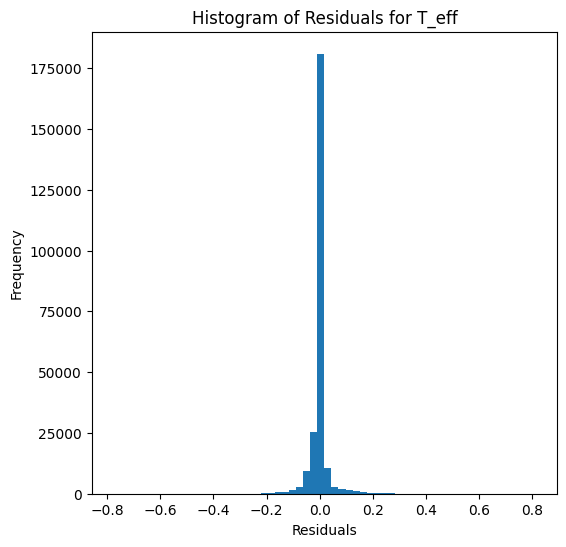

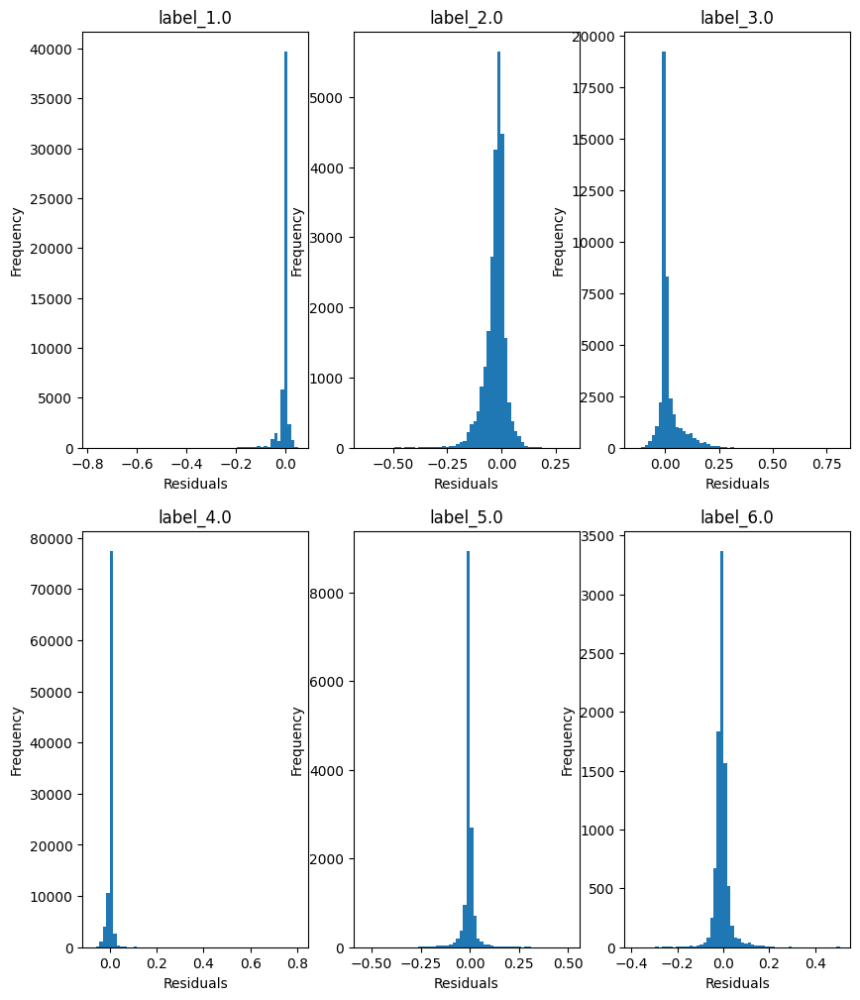

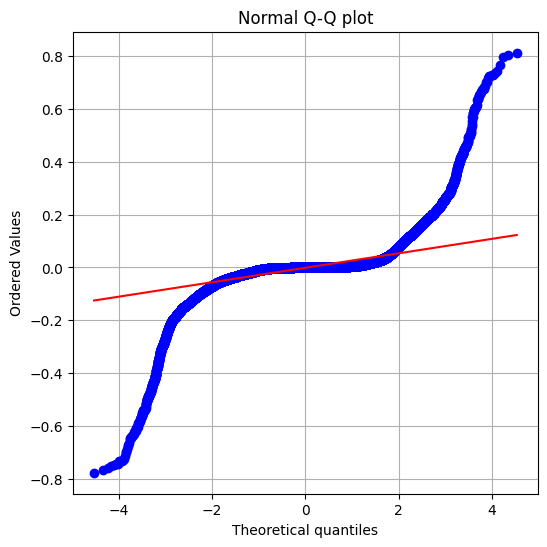

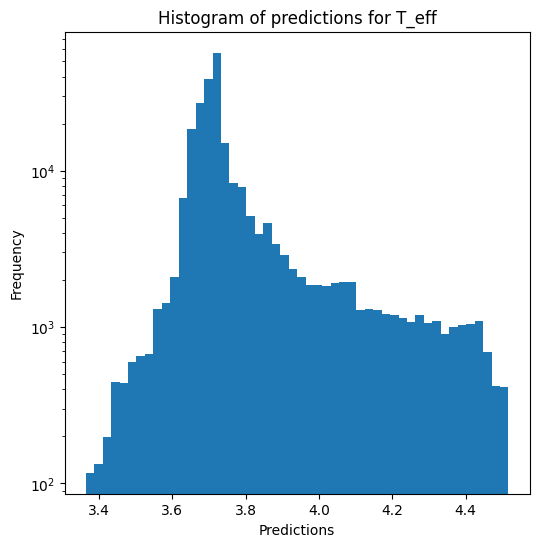

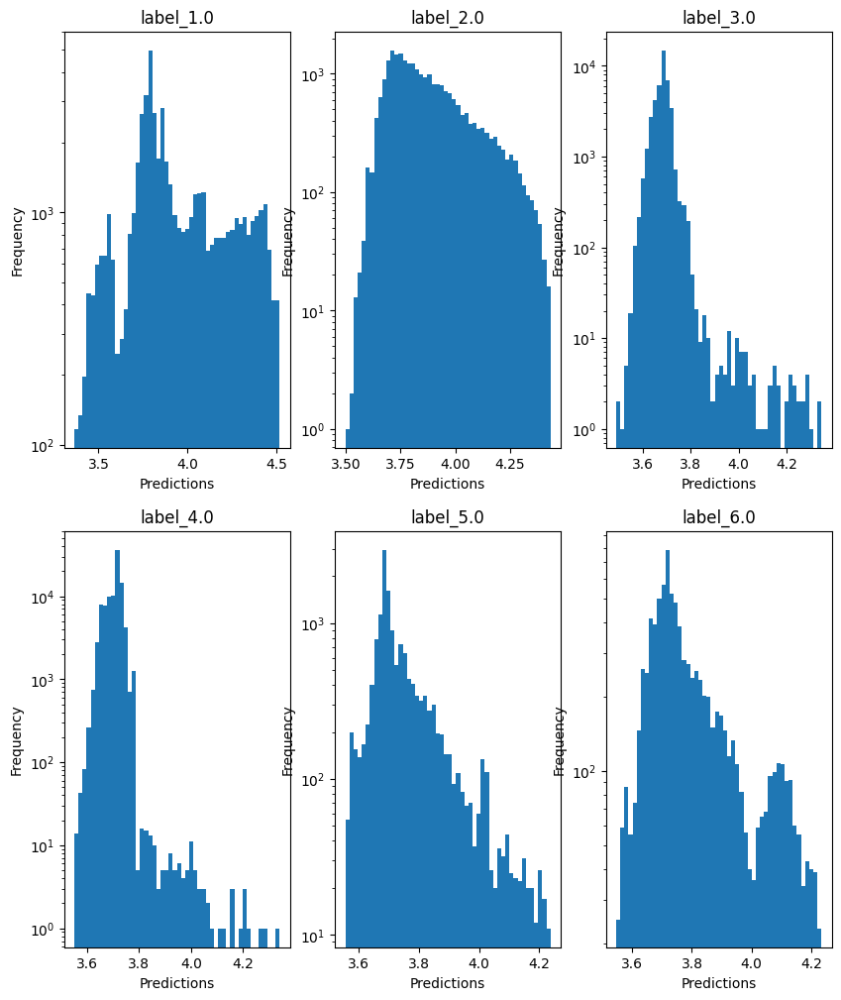


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.07188941852646846
  RMSE :  0.3362128336630928
  MAE :  0.08591020354015845
  MedAE :  0.0052000000000003155
  CORR :  0.7531650493996055
  MAX_ER :  4.513
  Percentiles : 
    75th percentile :  0.017400000000000304
    90th percentile :  0.0609999999999995
    95th percentile :  0.7646000000000002
    99th percentile :  1.8404699999999994

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.565558984894846
  RMSE :  0.5953541842734174
  MAE :  0.31344603998760073
  MedAE :  0.09960000000000013
  CORR :  0.7758256932291288
  MAX_ER :  3.9669999999999996
  Percentiles : 
    75th percentile :  0.27539999999999987
    90th percentile :  1.0865199999999997
    95th percentile :  1.4049299999999996
    99th percentile :  2.3140540000000027

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.0960

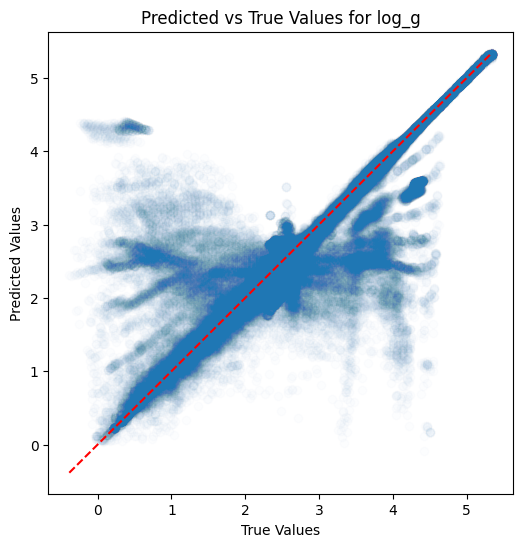

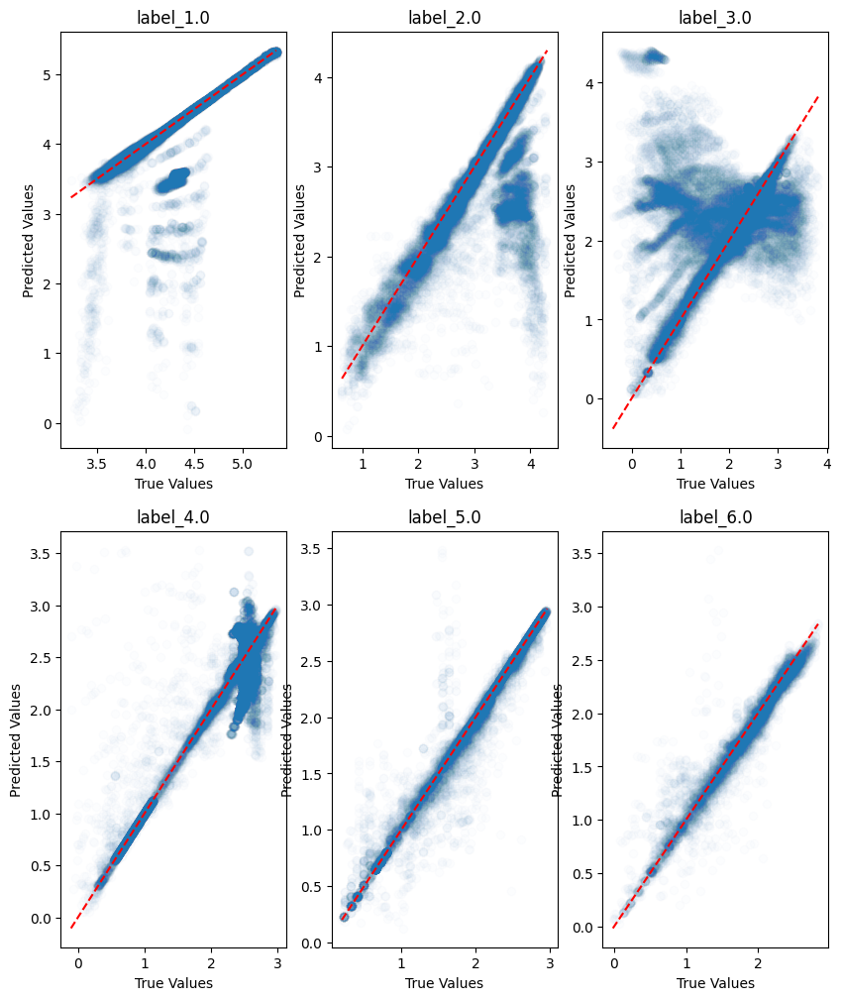

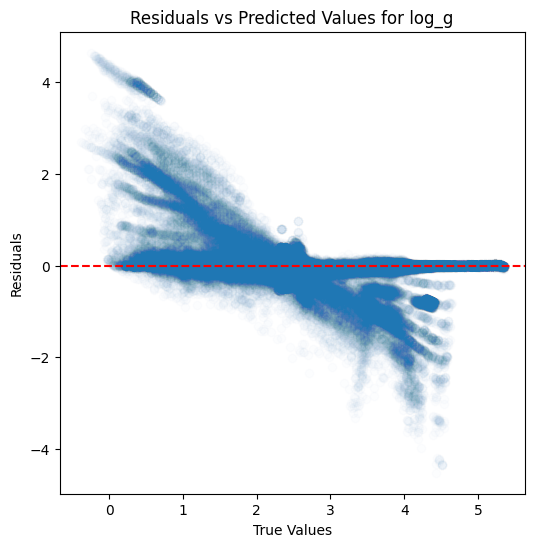

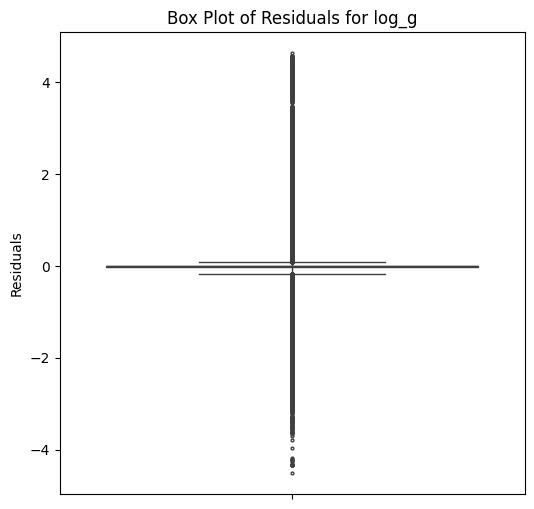

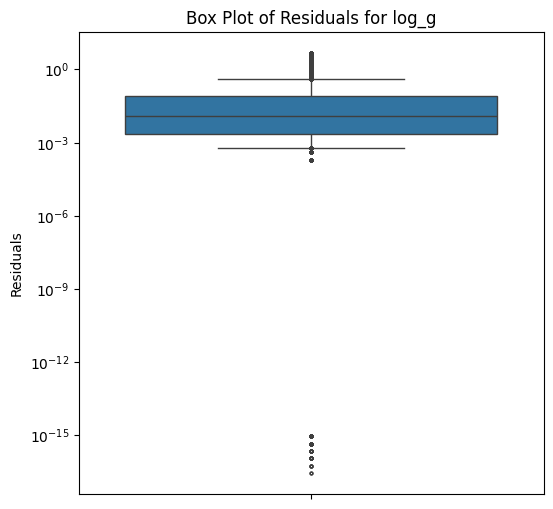

...

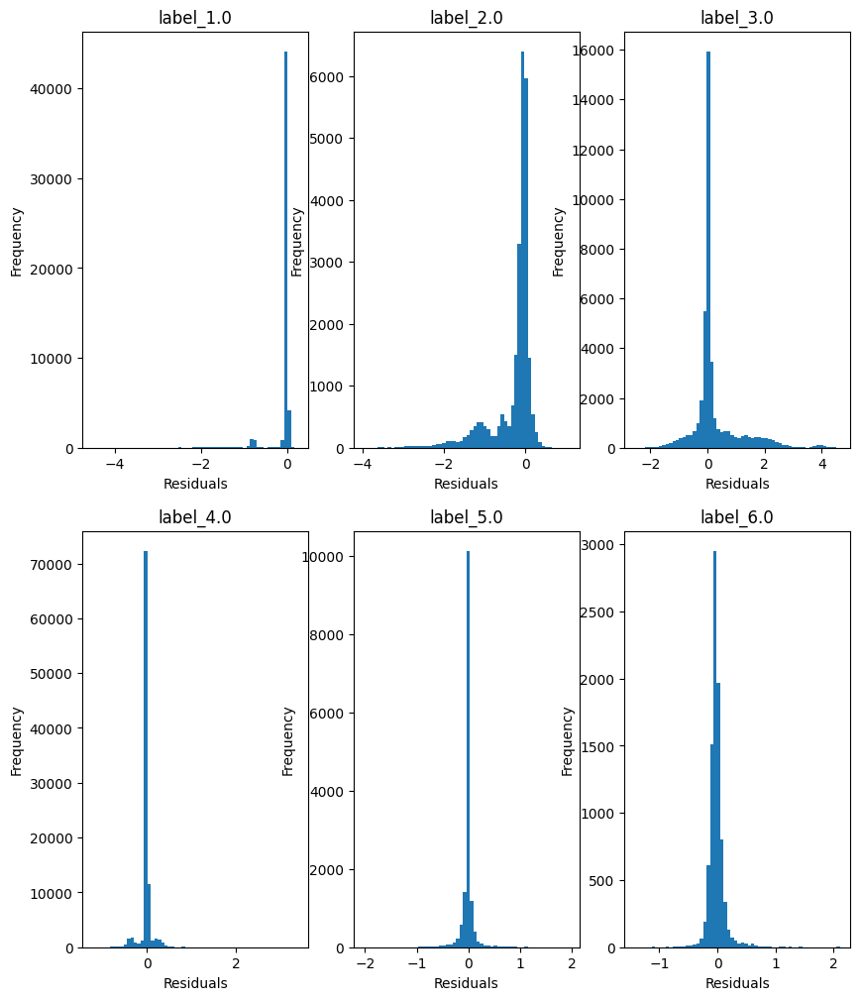

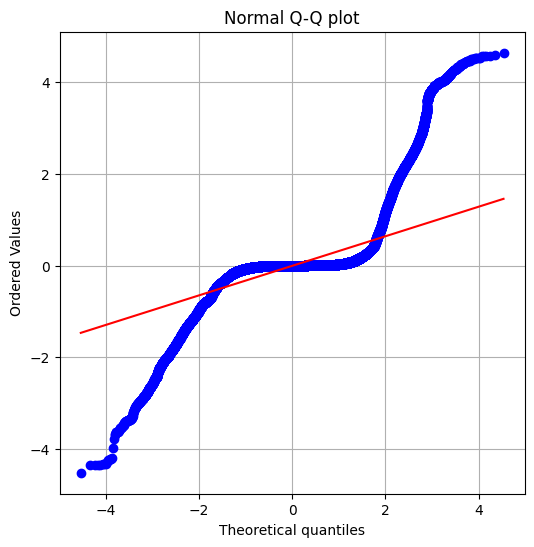

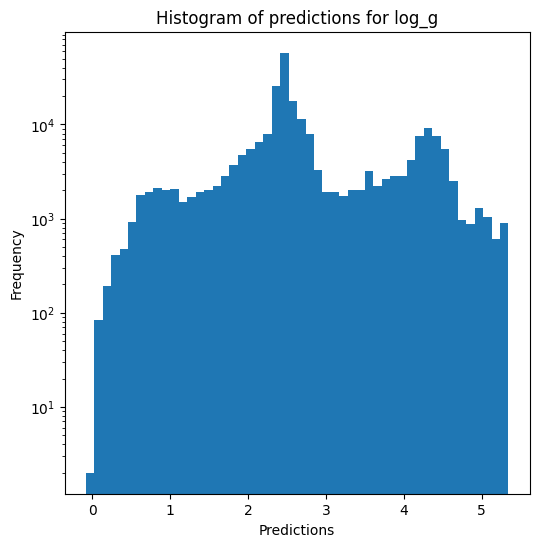

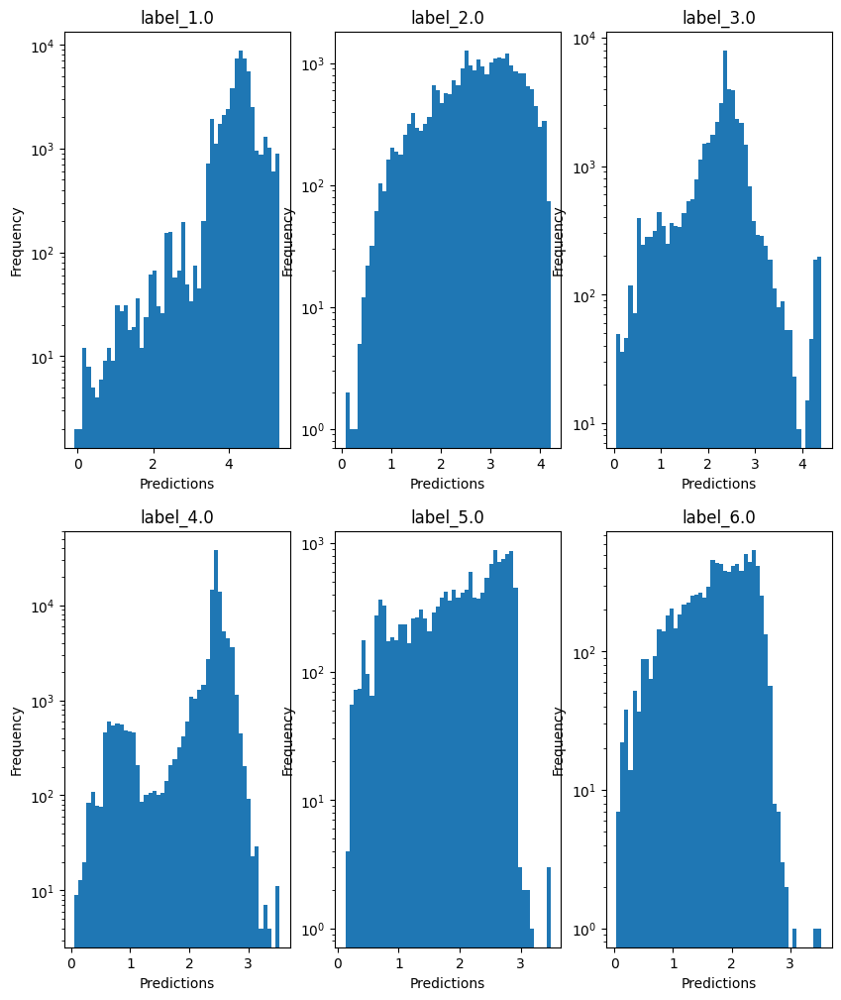

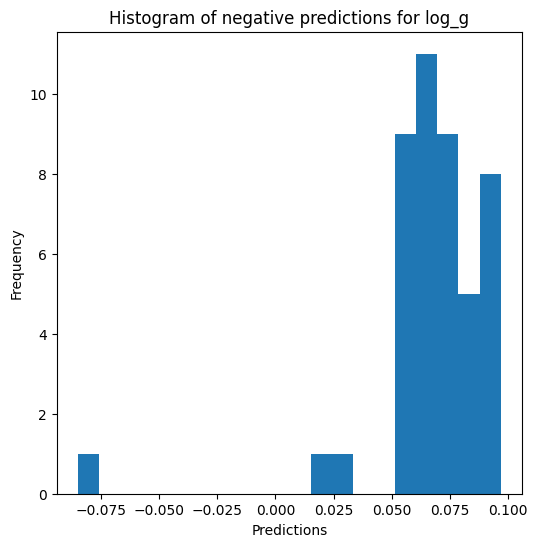


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.7998821386337984
  RMSE :  0.16843780732706684
  MAE :  0.04464331126069868
  MedAE :  0.004497075487050806
  CORR :  0.9132646003322126
  MAX_ER :  2.2561552794953266
  Percentiles : 
    75th percentile :  0.012604615212645331
    90th percentile :  0.03225914104444205
    95th percentile :  0.38252050540904325
    99th percentile :  0.920305749622072

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7631697789826564
  RMSE :  0.2977317551598808
  MAE :  0.15681885867778853
  MedAE :  0.049996847494741314
  CORR :  0.873986274124419
  MAX_ER :  1.9831724722172852
  Percentiles : 
    75th percentile :  0.13777049102628236
    90th percentile :  0.5431898526528609
    95th percentile :  0.7023855208576854
    99th percentile :  1.1570774872641436

radius results for the label category

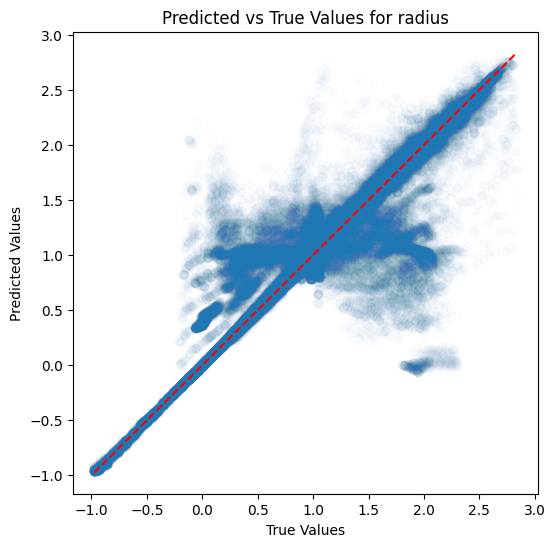

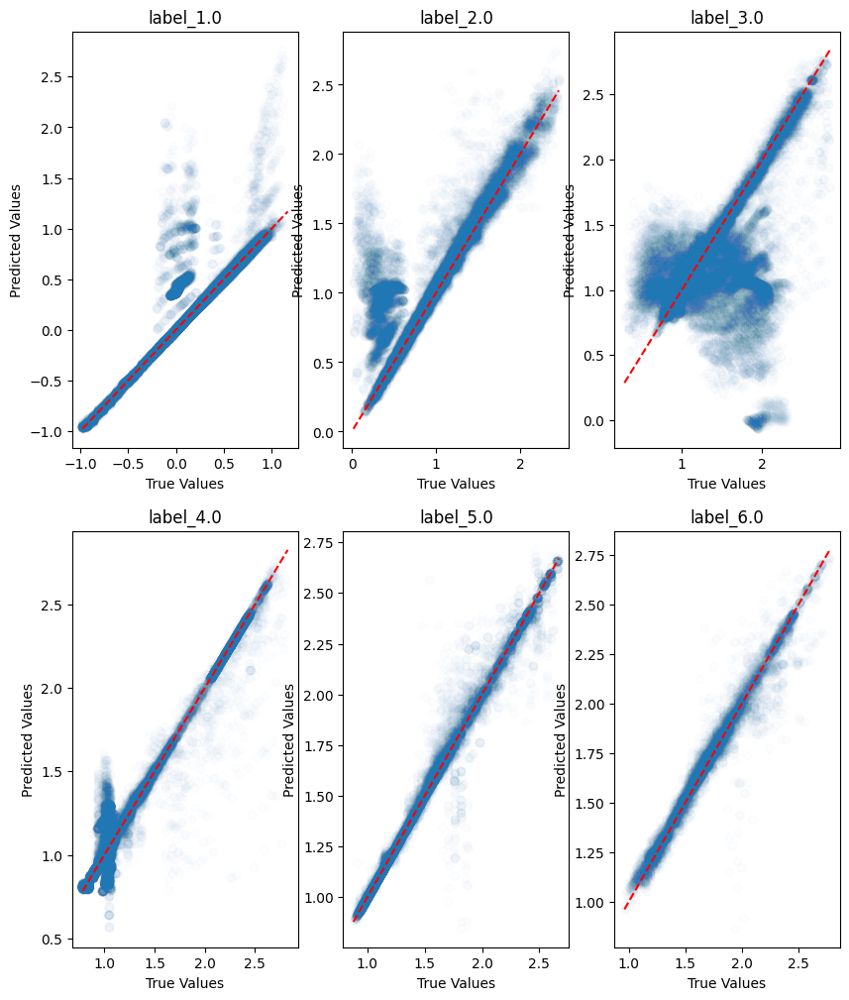

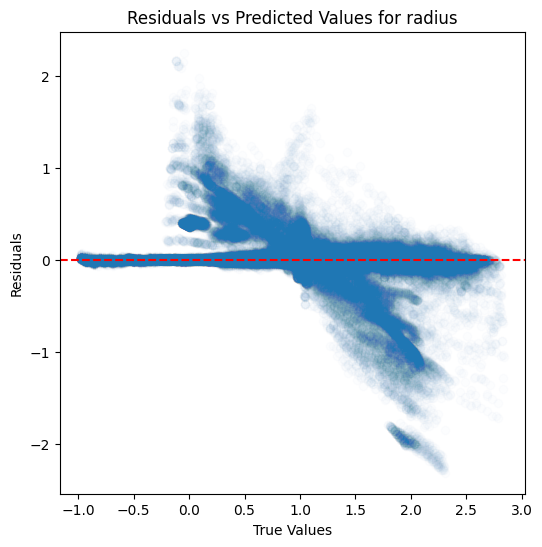

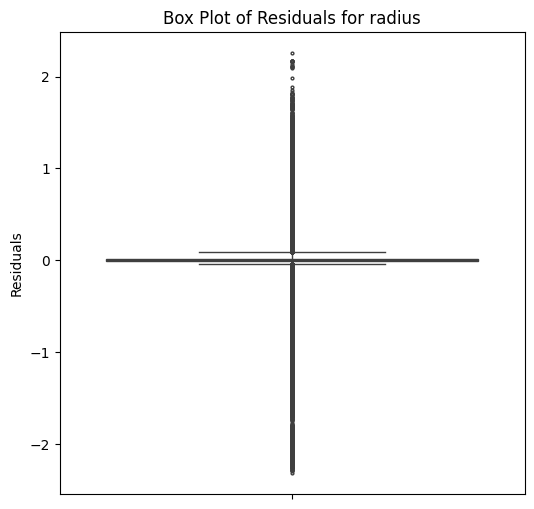

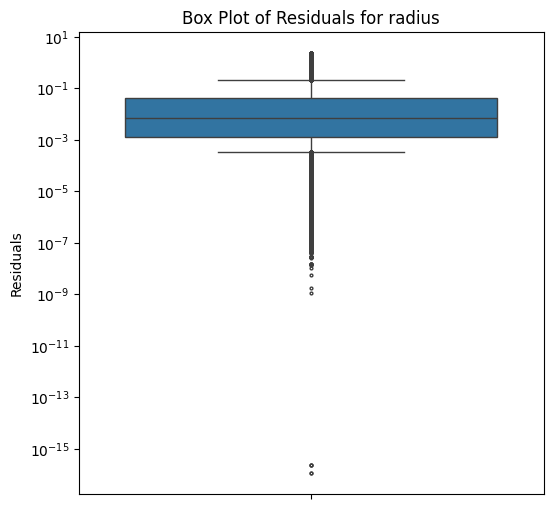

...

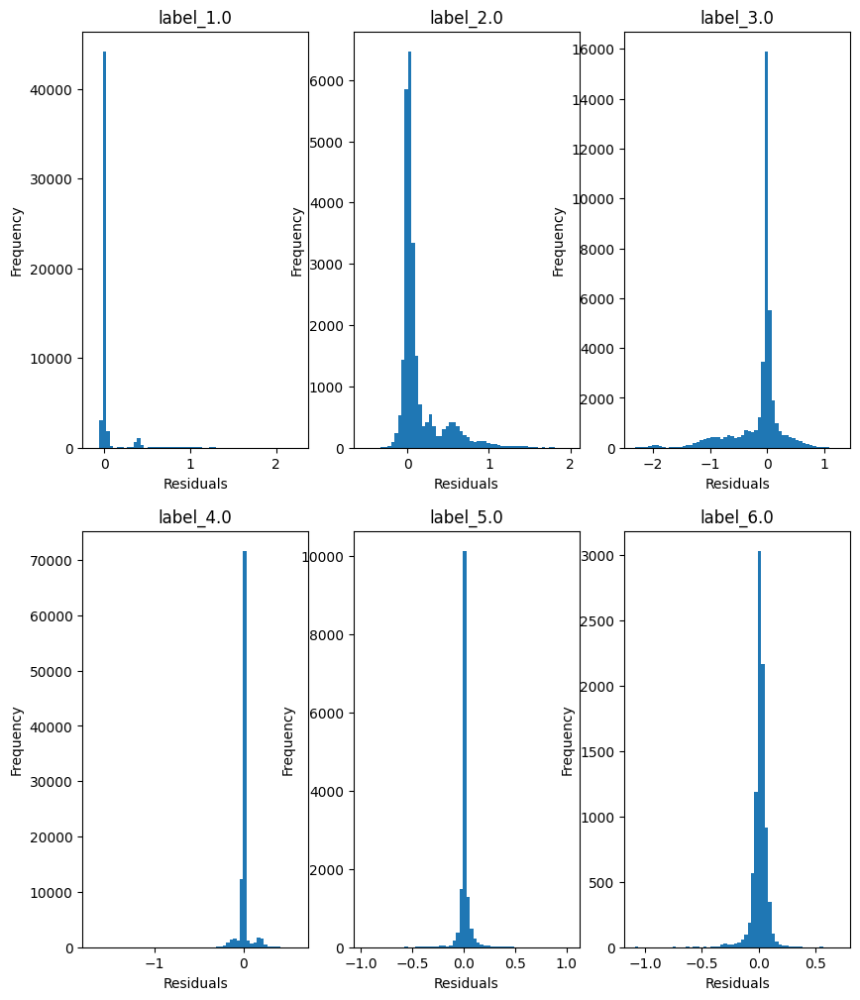

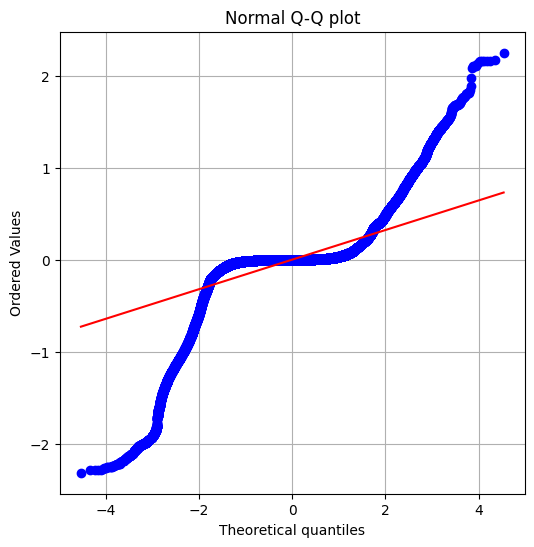

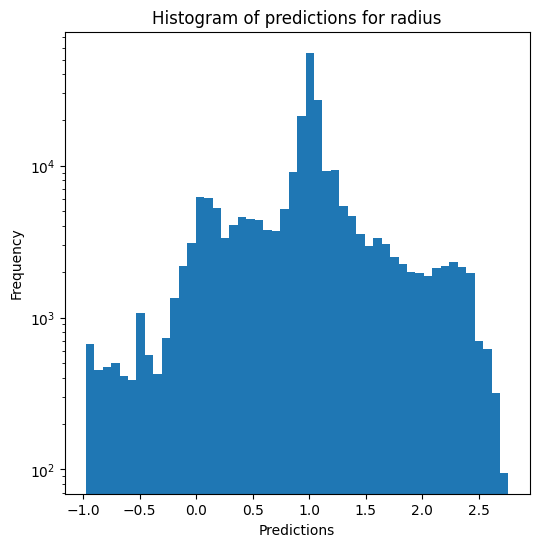

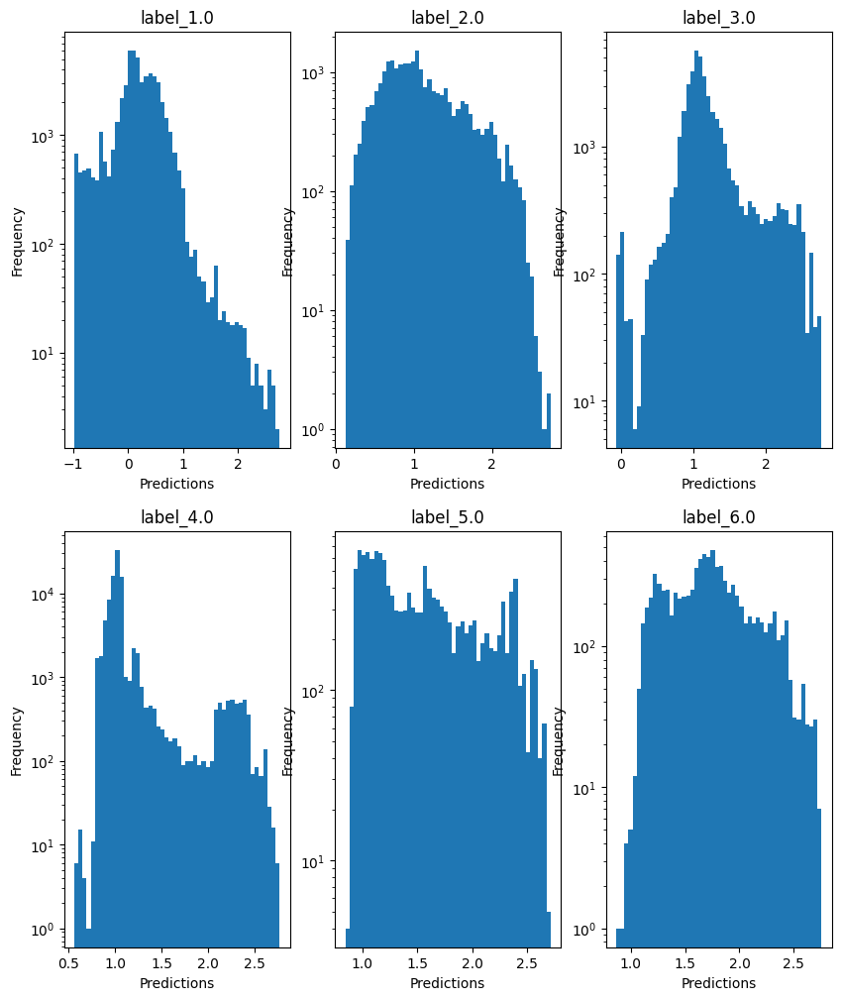

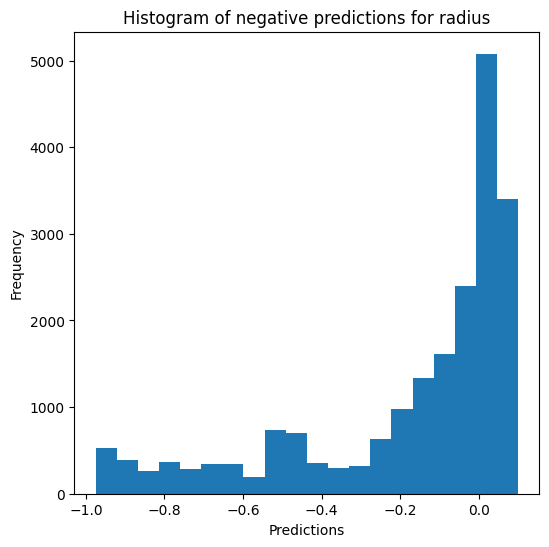

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.982793955233488
  RMSE :  0.035208700181025565
  MAE :  0.007330006945114728
  MedAE :  0.0001919999999930866
  CORR :  0.9914669463729288
  MAX_ER :  0.7624920000000004
  Percentiles : 
    75th percentile :  0.0023737499999969547
    90th percentile :  0.01085893198051835
    95th percentile :  0.03070736785714334
    99th percentile :  0.13049503189987394

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.901494565941335
  RMSE :  0.055674748809048435
  MAE :  0.03246171880588189
  MedAE :  0.01635340097205429
  CORR :  0.9556779744879559
  MAX_ER :  0.7809553321428586
  Percentiles : 
    75th percentile :  0.039402961309526474
    90th percentile :  0.08377192371572963
    95th percentile :  0.12155007993845489
  

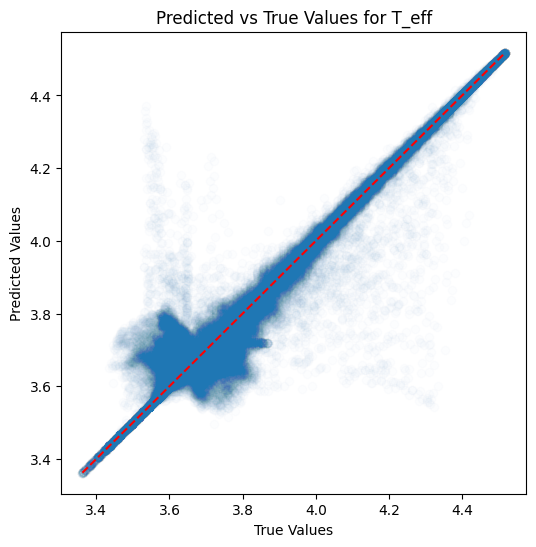

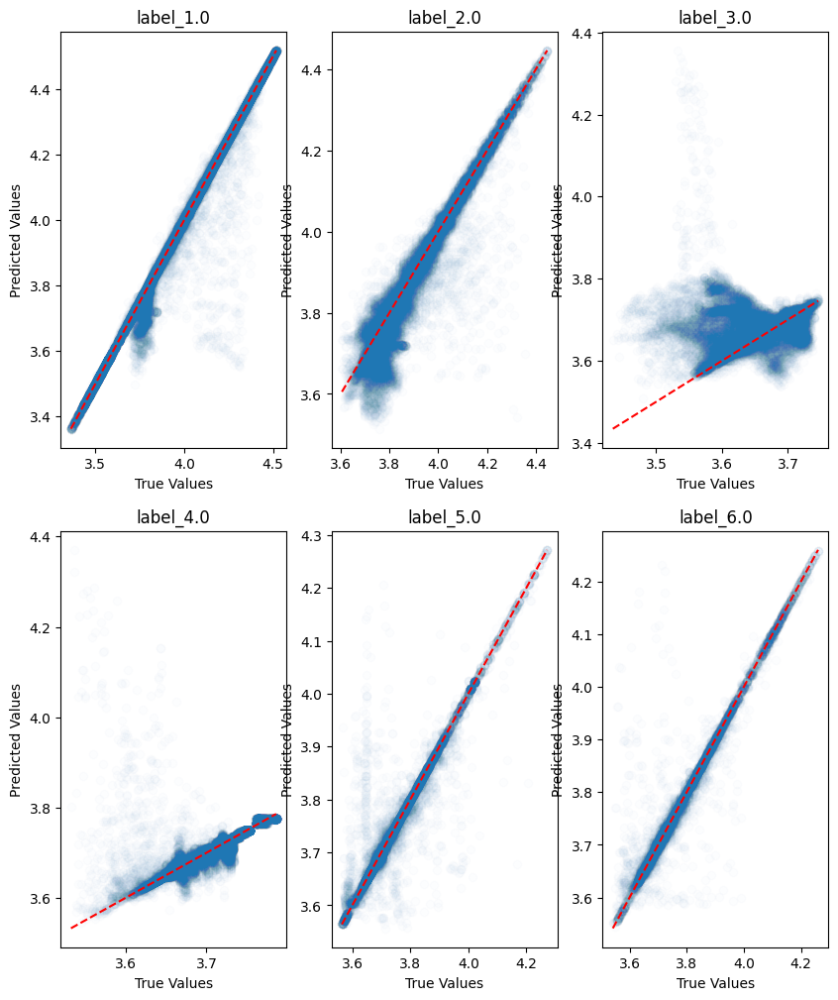

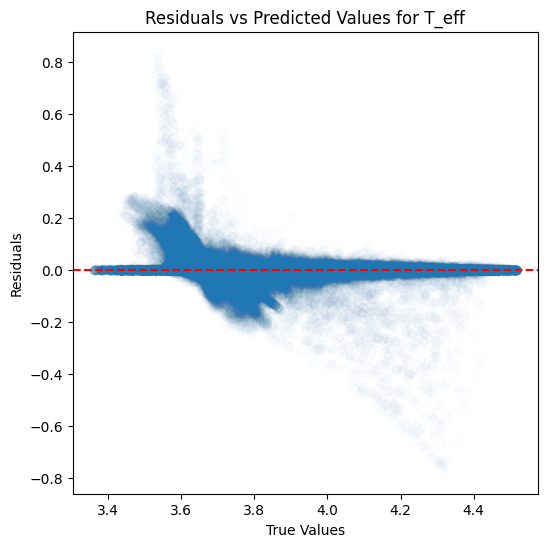

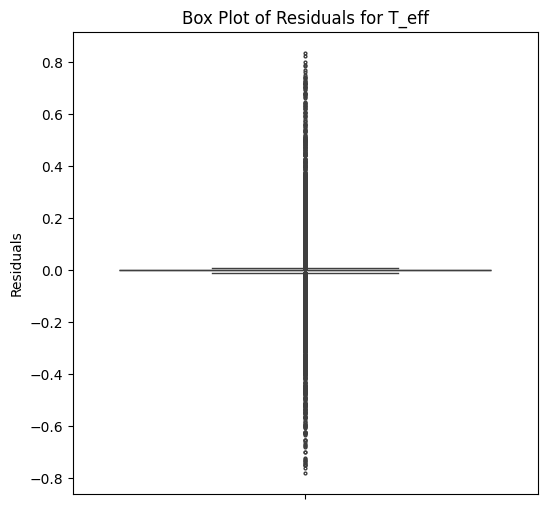

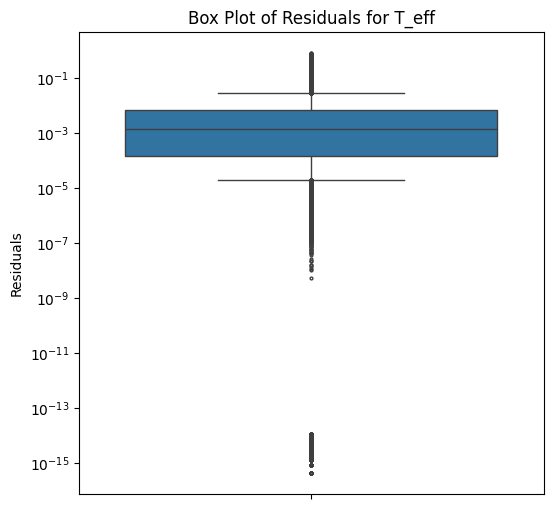

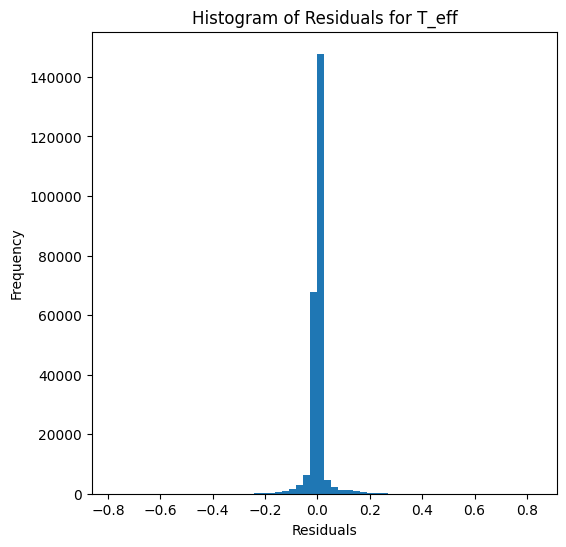

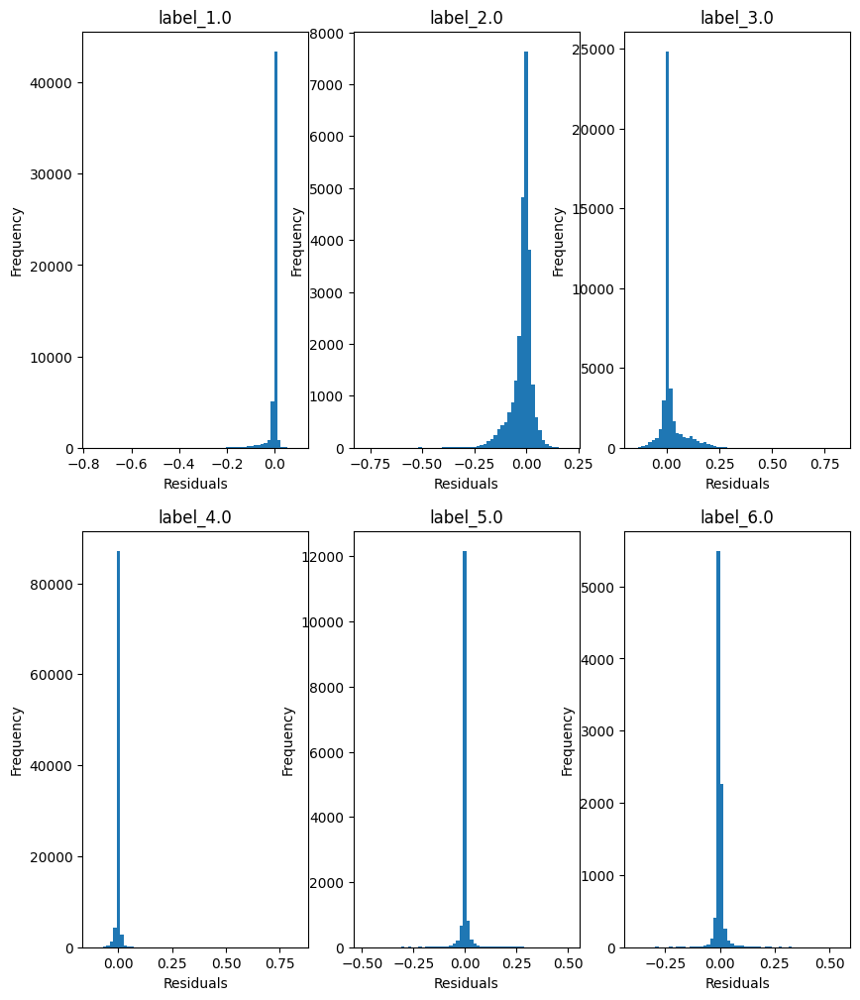

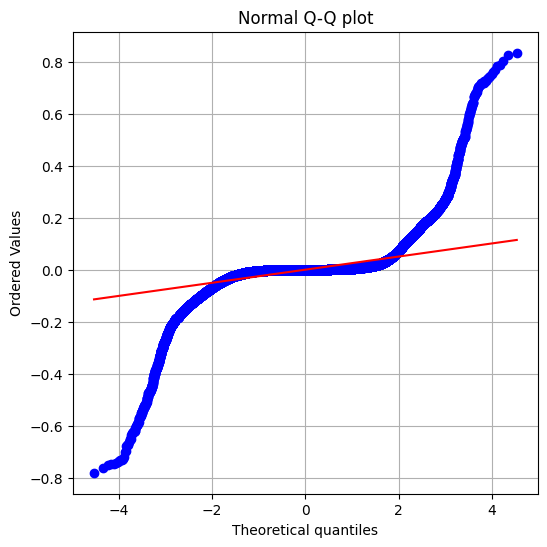

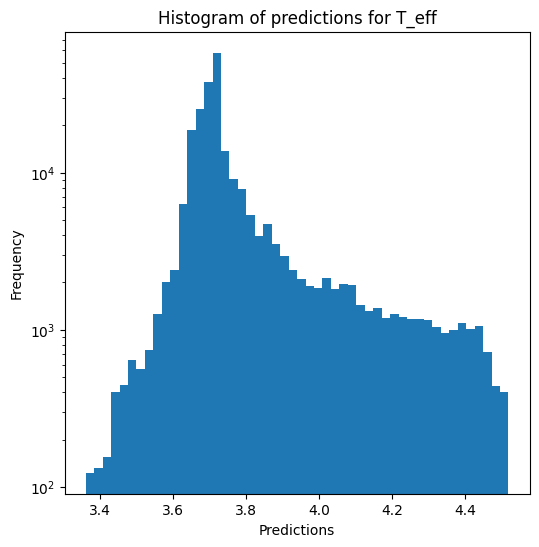

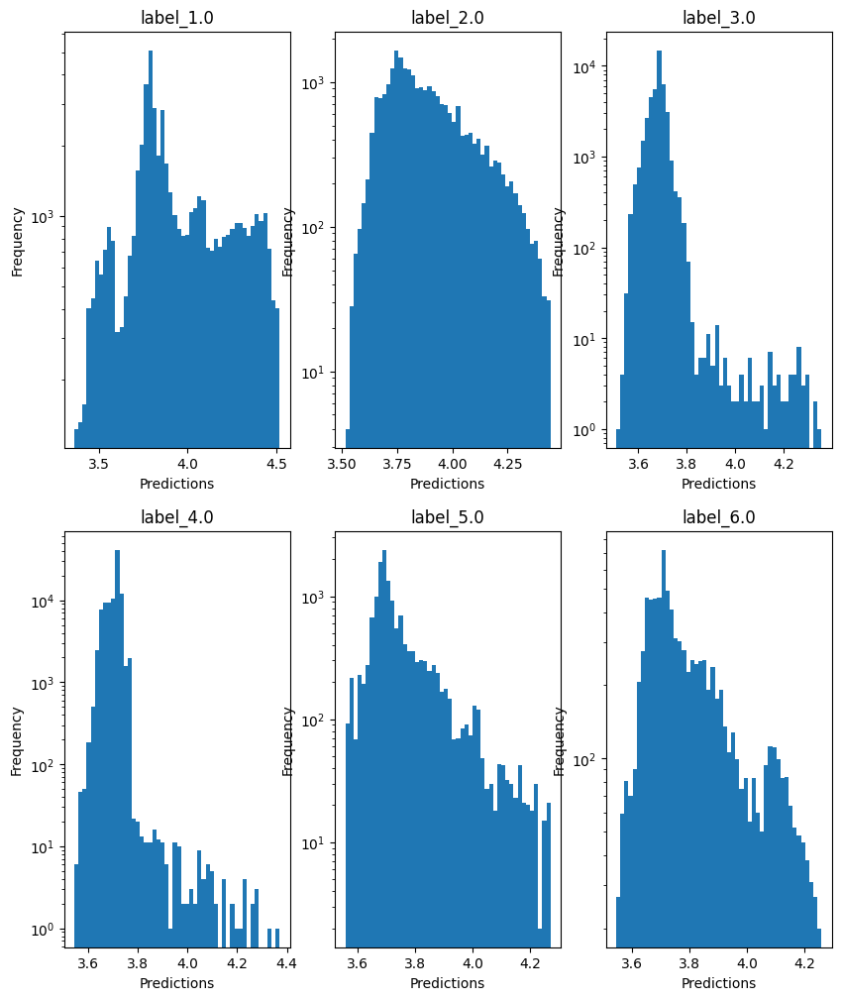


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.17137724293009893
  RMSE :  0.3161031303313124
  MAE :  0.0702592437478244
  MedAE :  0.0009799999999913211
  CORR :  0.7755834972688167
  MAX_ER :  4.3435554830554155
  Percentiles : 
    75th percentile :  0.006838901064213365
    90th percentile :  0.050477499999997066
    95th percentile :  0.33004736439510374
    99th percentile :  1.7719448277847833

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.46949483029736805
  RMSE :  0.6293230760600457
  MAE :  0.28837183102392255
  MedAE :  0.06809724404761641
  CORR :  0.7399763330504997
  MAX_ER :  3.607428025641025
  Percentiles : 
    75th percentile :  0.1959237541565866
    90th percentile :  1.0232249999999983
    95th percentile :  1.6593648110260146
    99th percentile :  2.6326228783333323

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
 

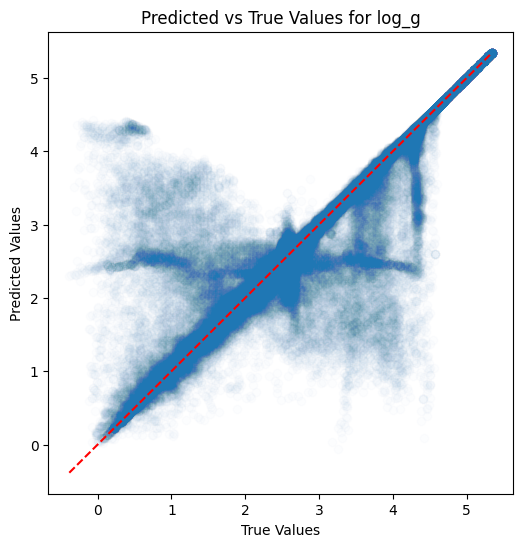

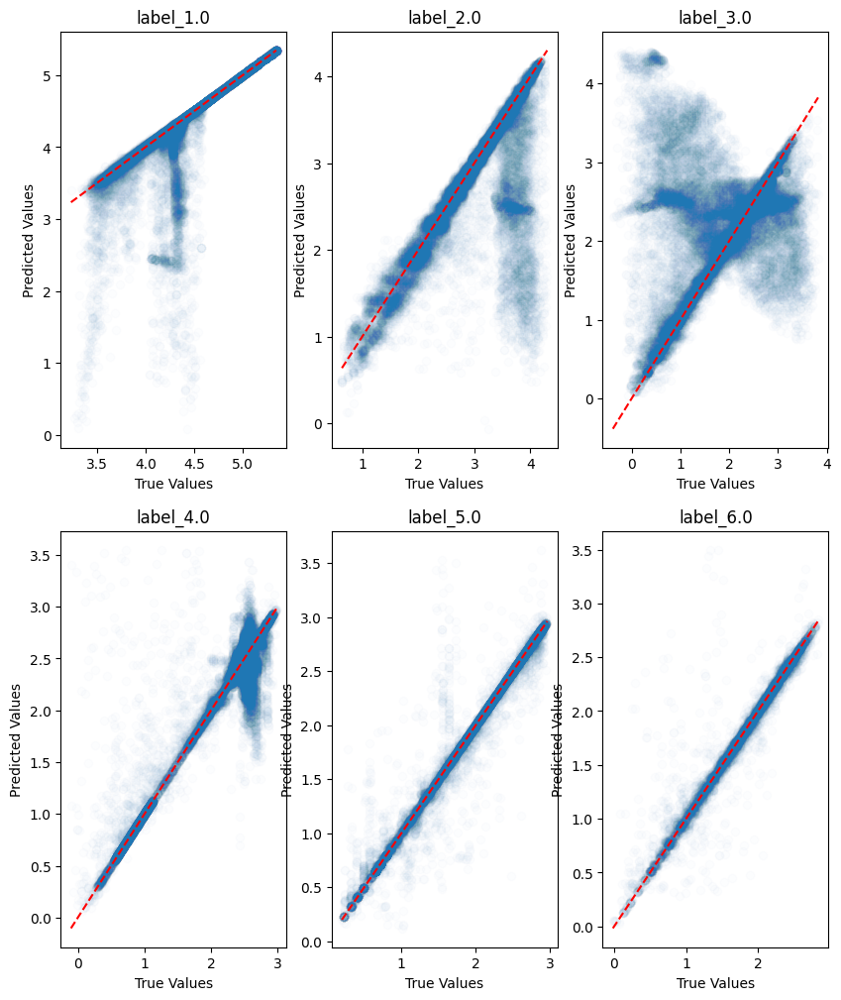

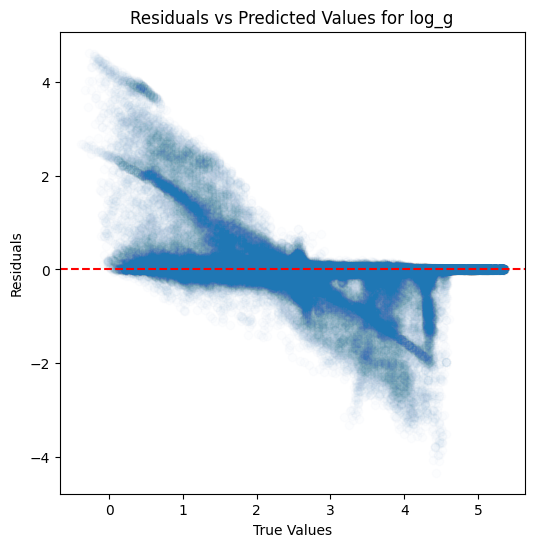

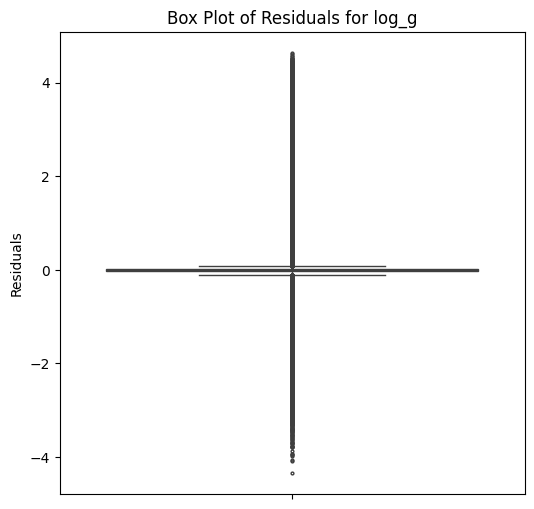

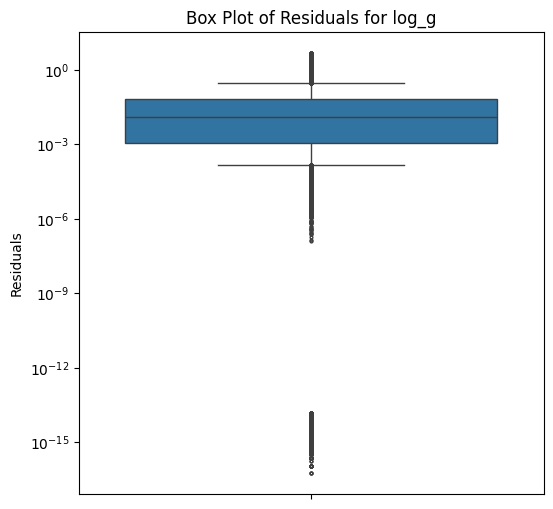

...

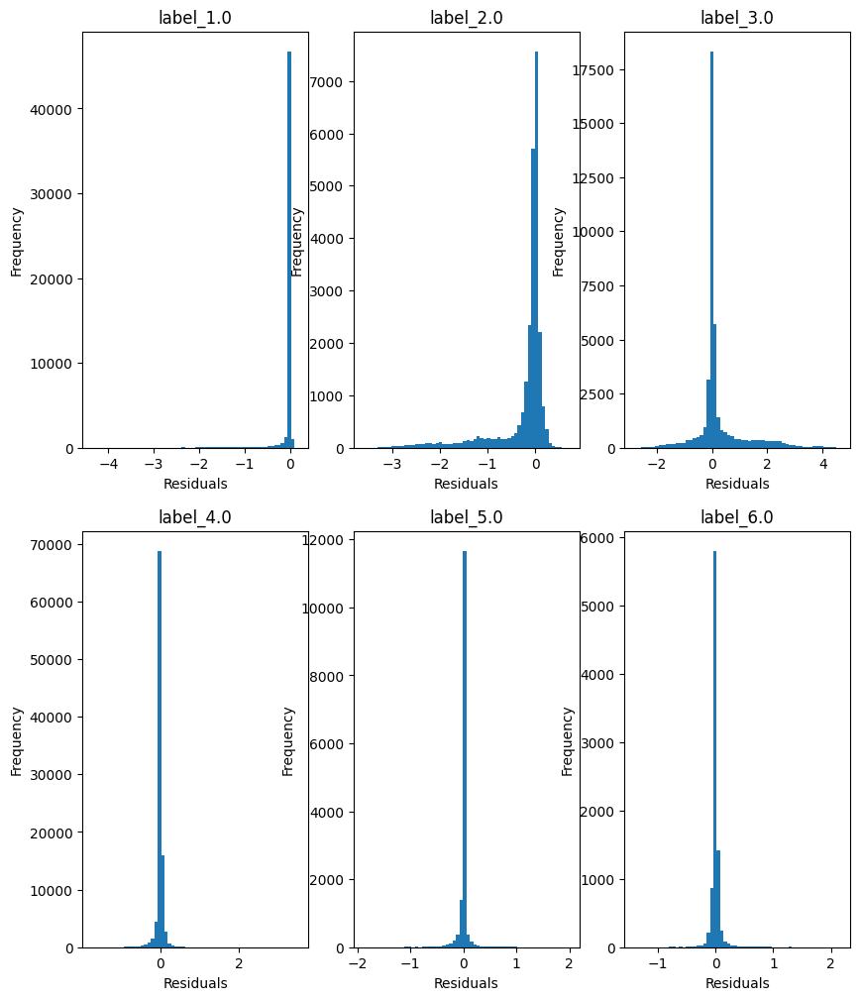

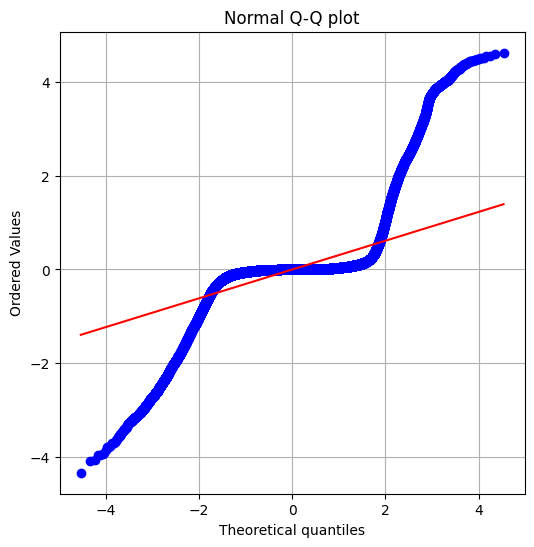

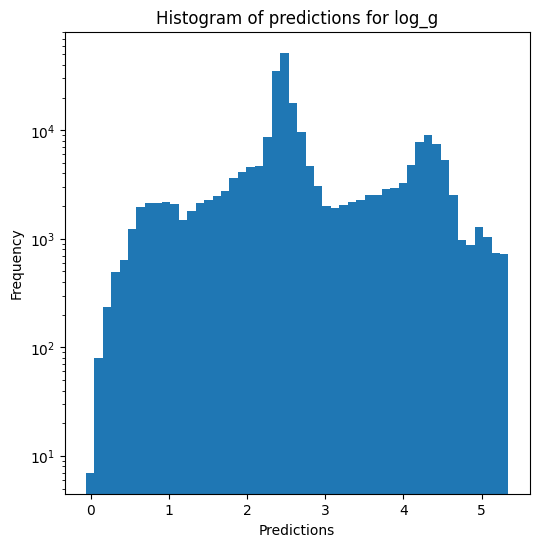

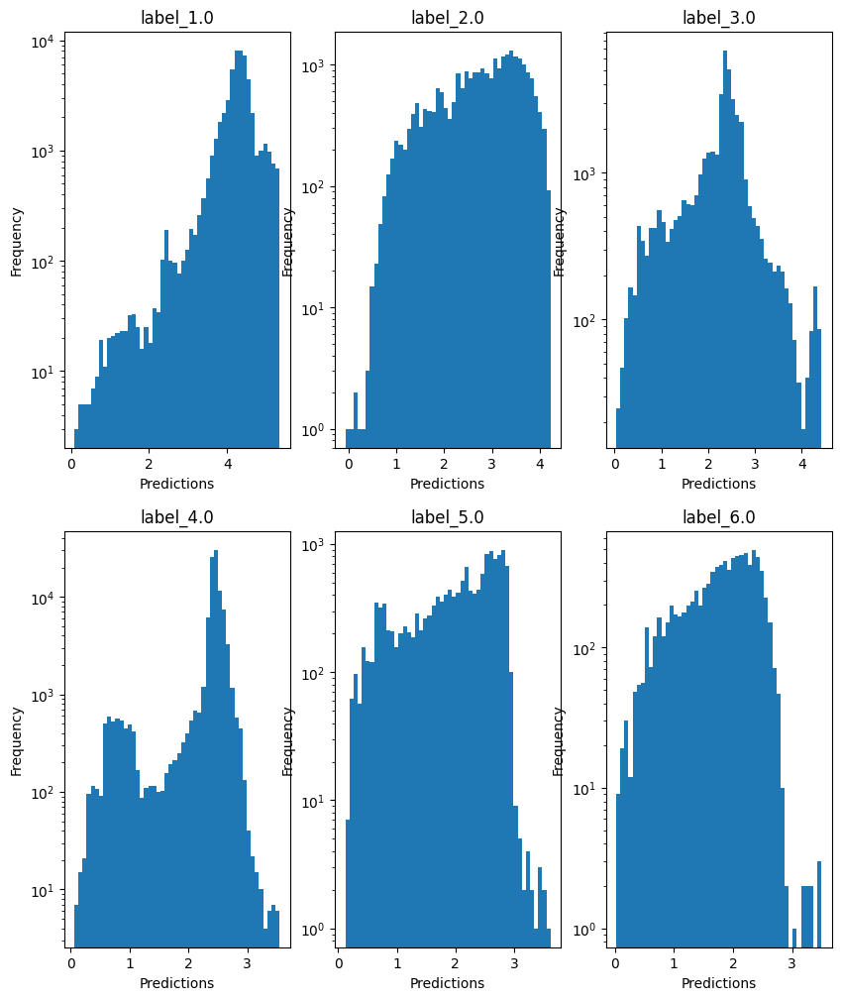

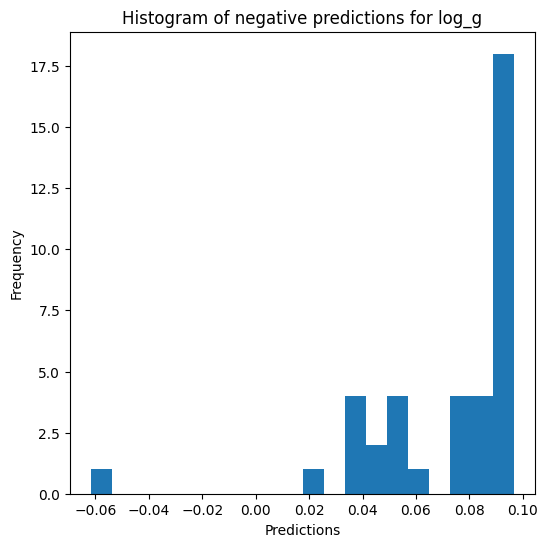


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8214644325384362
  RMSE :  0.15821874071025013
  MAE :  0.03533273158679179
  MedAE :  0.0005645976226226826
  CORR :  0.9226769514994266
  MAX_ER :  2.1717465301208048
  Percentiles : 
    75th percentile :  0.003990647920769745
    90th percentile :  0.025765979474214495
    95th percentile :  0.16564641483378492
    99th percentile :  0.8861036676592141

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.710842098161532
  RMSE :  0.31468108333756234
  MAE :  0.14424173732112996
  MedAE :  0.03409859634888879
  CORR :  0.8469441458845031
  MAX_ER :  1.8036013539639426
  Percentiles : 
    75th percentile :  0.09794530275379232
    90th percentile :  0.5111692366804002
    95th percentile :  0.82980017444163
    99th percentile :  1.3163890588165907

radius results for the label categor

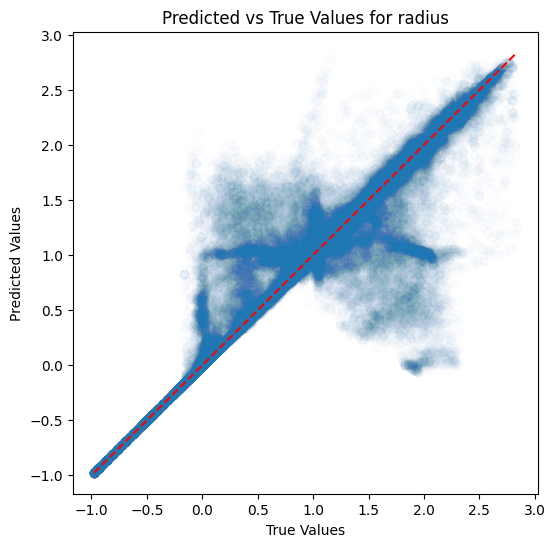

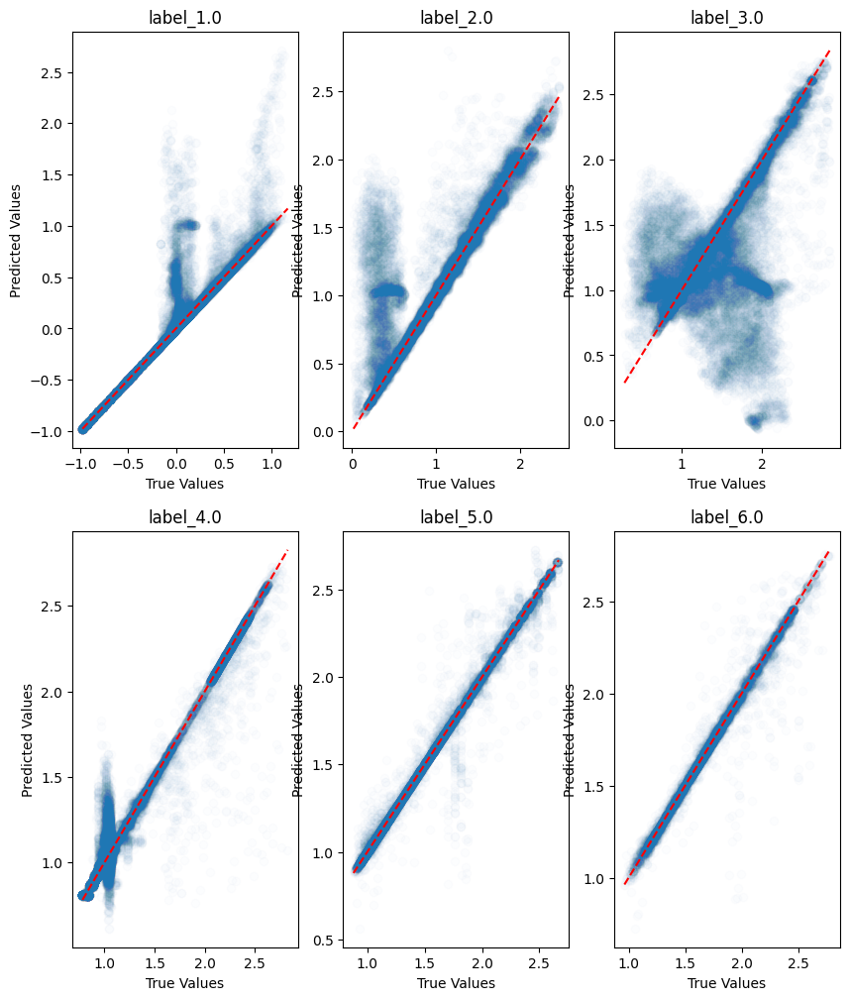

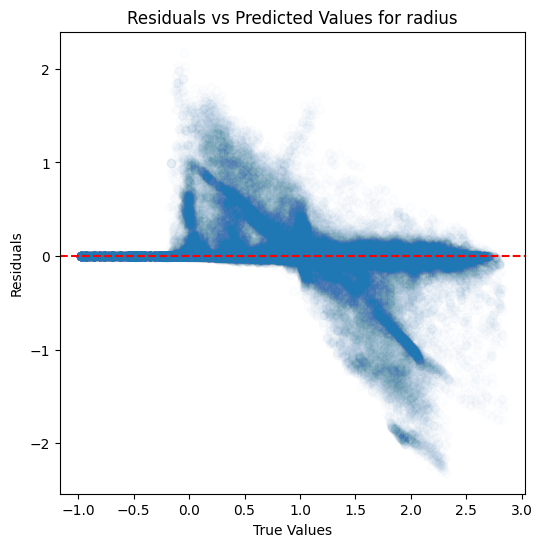

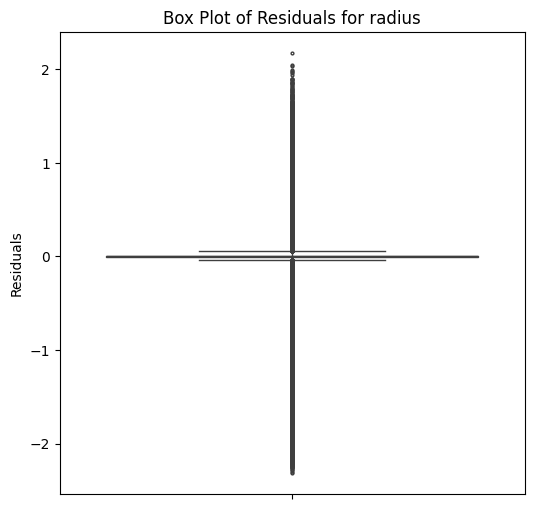

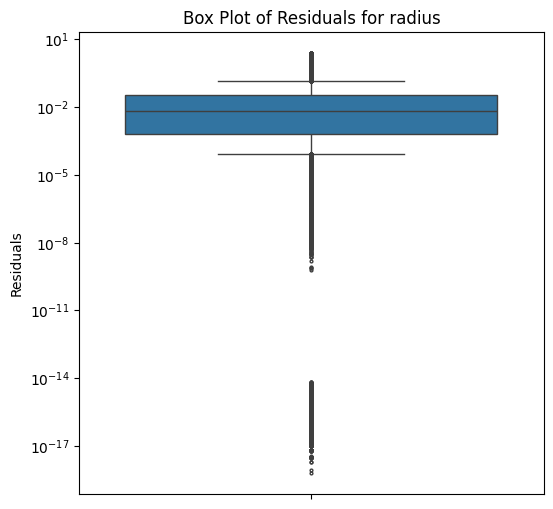

...

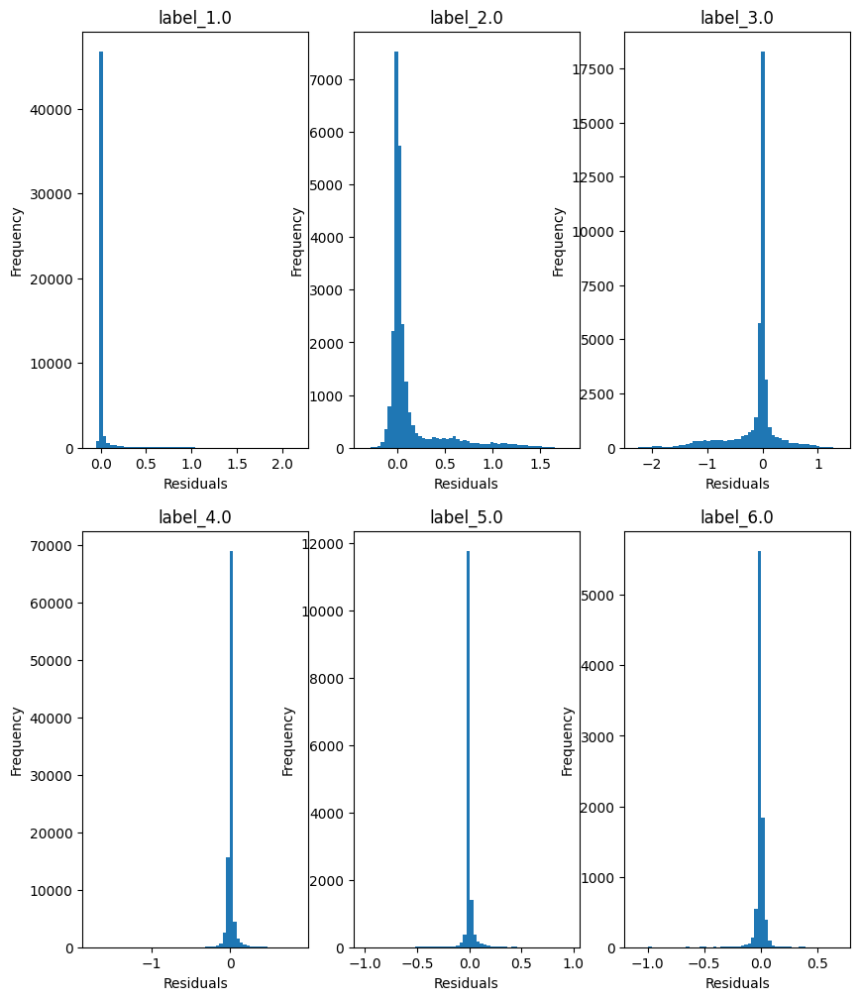

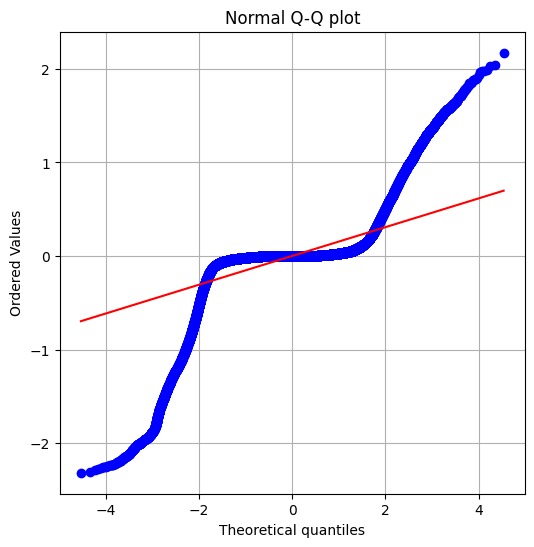

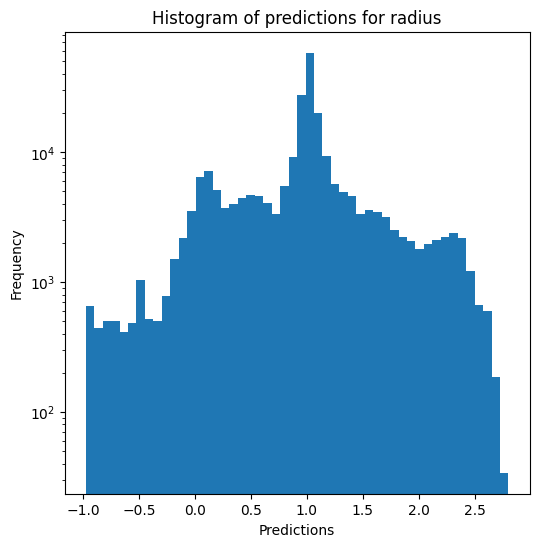

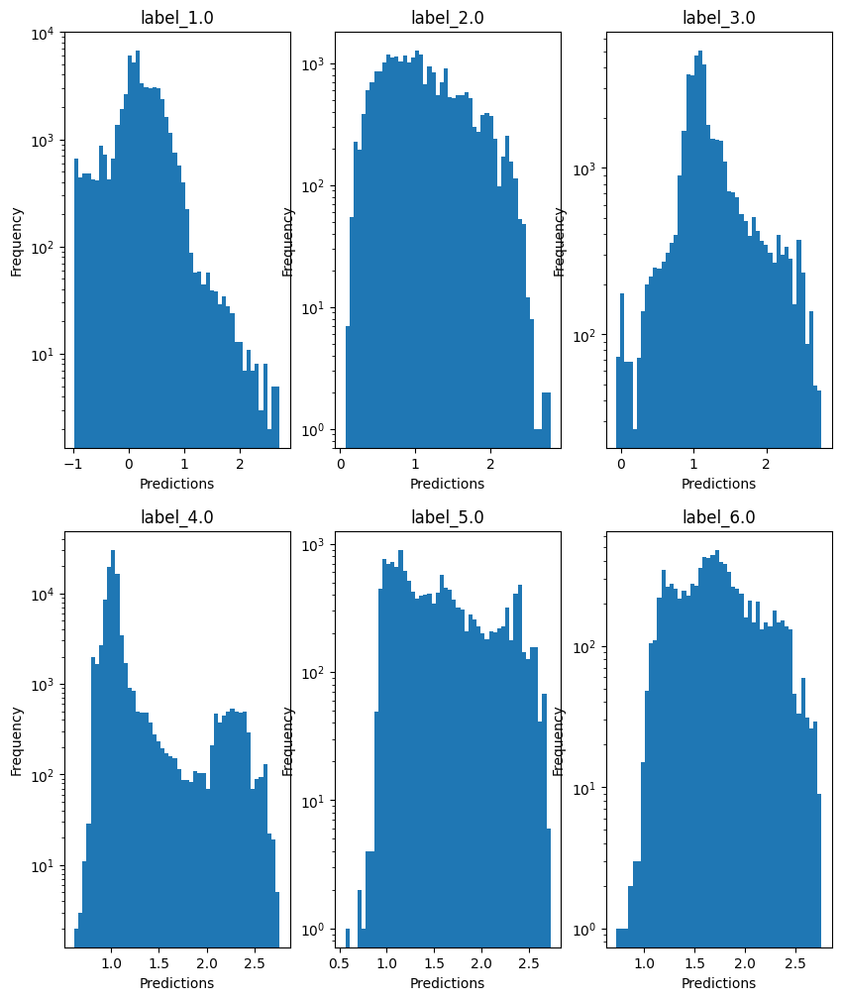

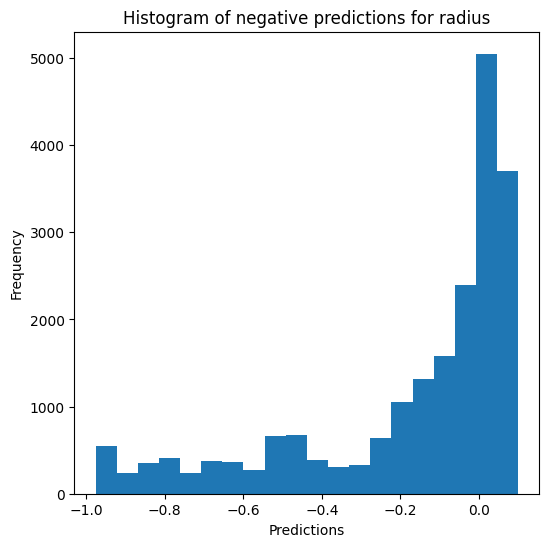

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9035438101538388
  RMSE :  0.08962926996366931
  MAE :  0.04370062094663365
  MedAE :  0.016440191650390457
  CORR :  0.9513542801799472
  MAX_ER :  0.6862123130798343
  Percentiles : 
    75th percentile :  0.045224884605407745
    90th percentile :  0.09852901439666728
    95th percentile :  0.19257690420150775
    99th percentile :  0.4450410458564756

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.2421346697916199
  RMSE :  0.16346869278380277
  MAE :  0.12303096453821297
  MedAE :  0.08958496551513662
  CORR :  0.5078146897498674
  MAX_ER :  0.6752104206085203
  Percentiles : 
    75th percentile :  0.1702466587066649
    90th percentile :  0.2765139361953734
    95th percentile :  0.352970765609741
    99th pe

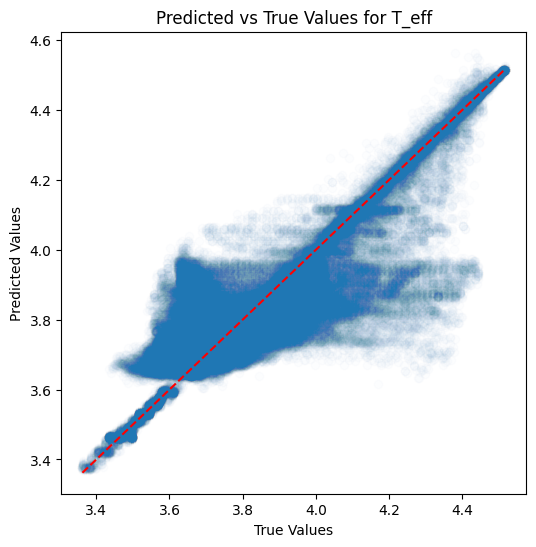

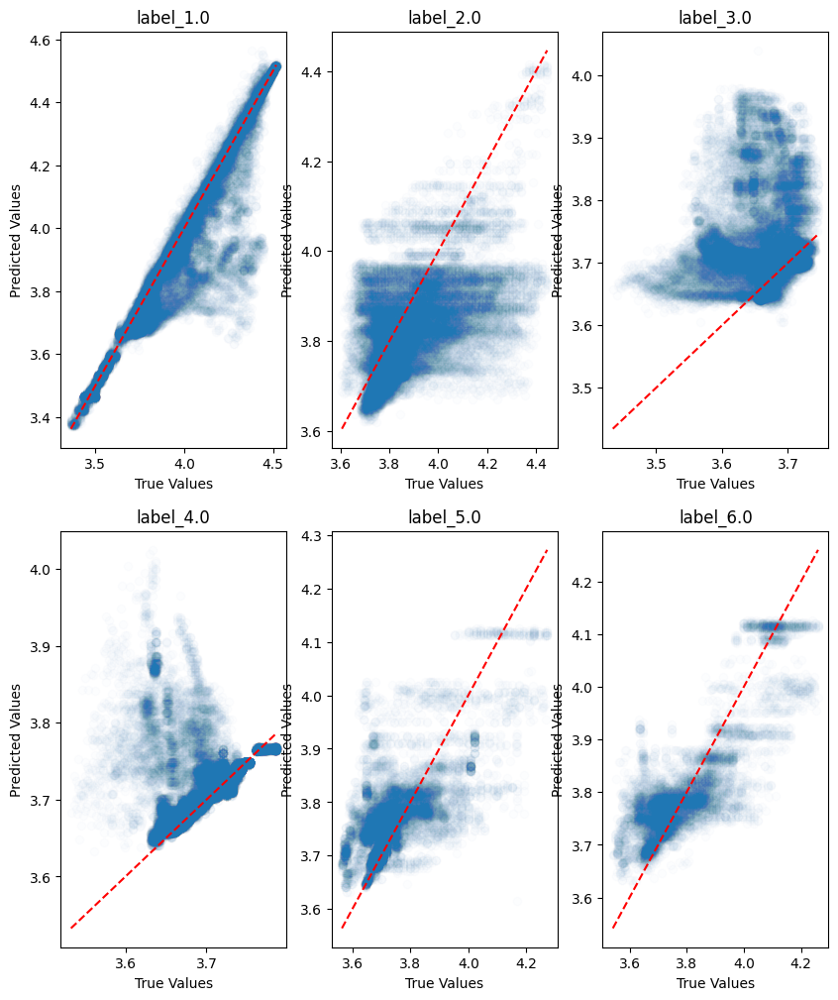

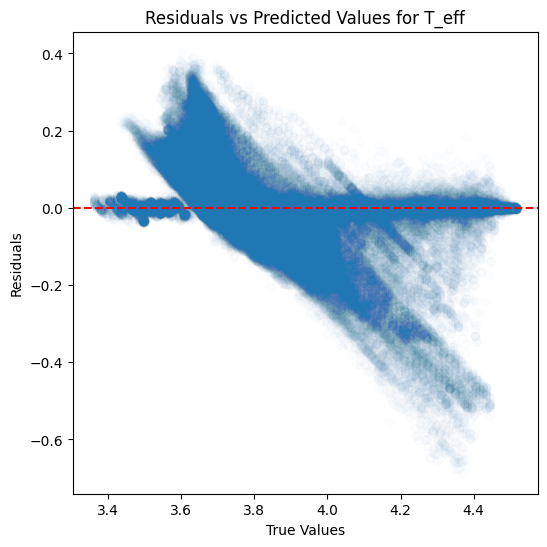

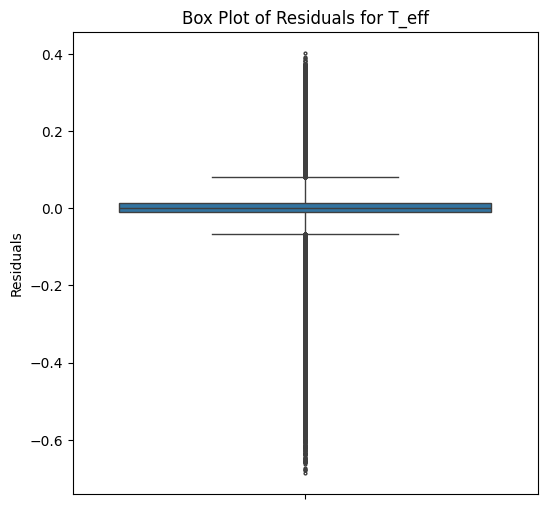

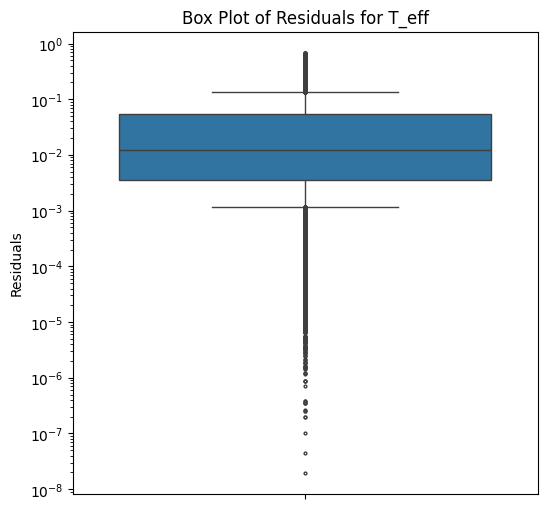

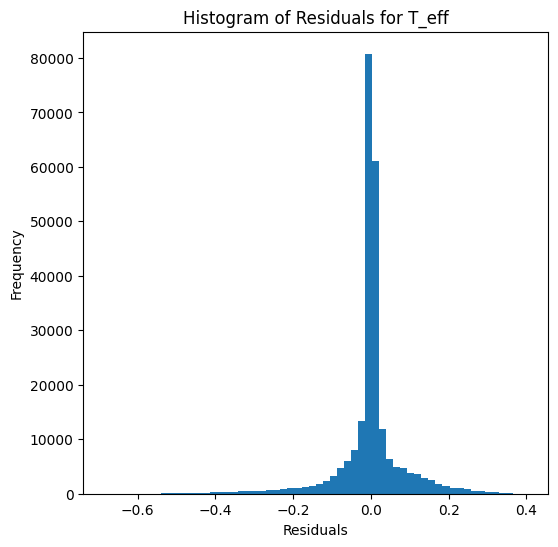

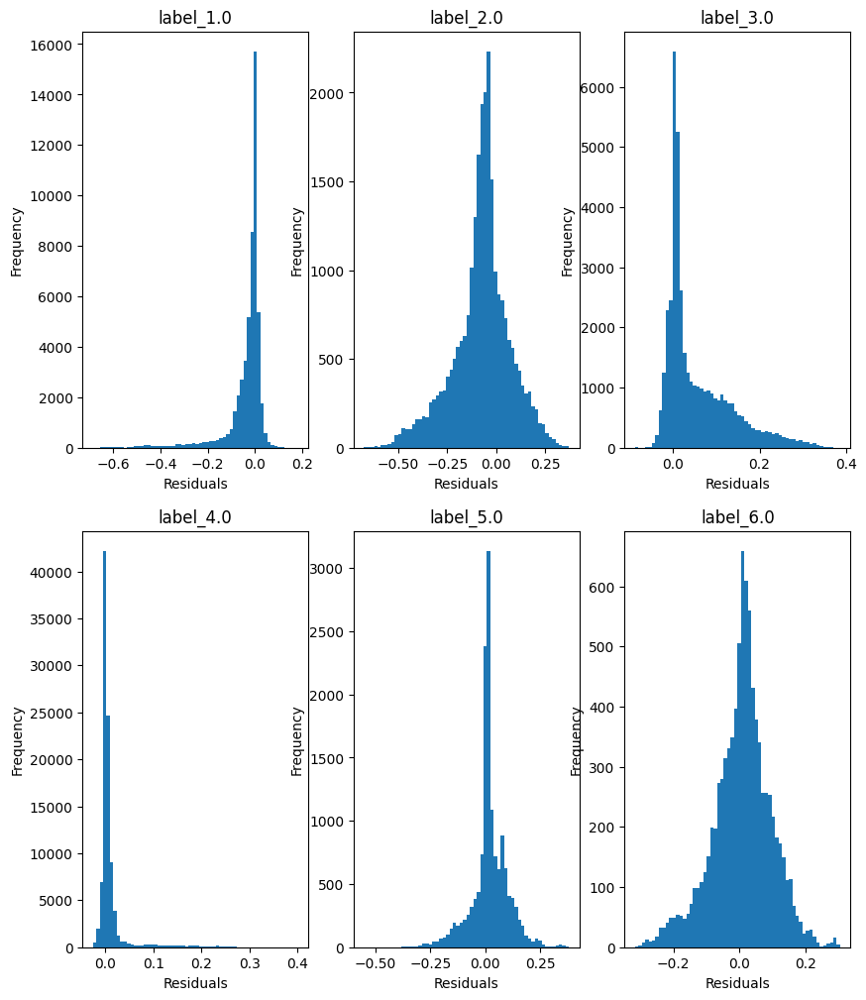

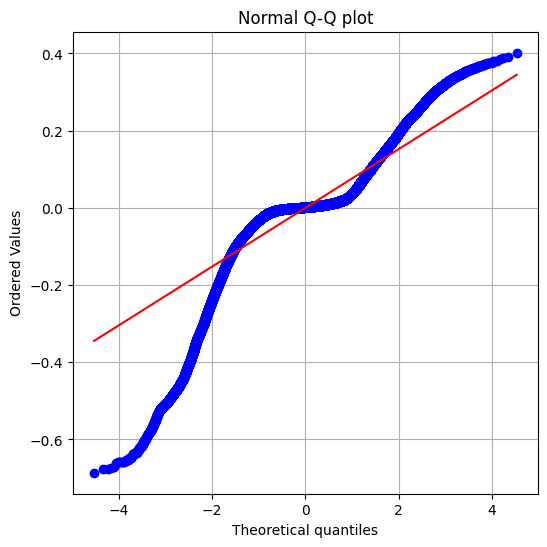

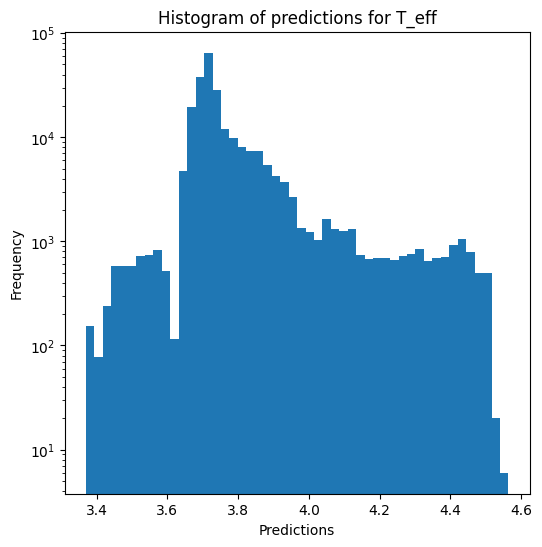

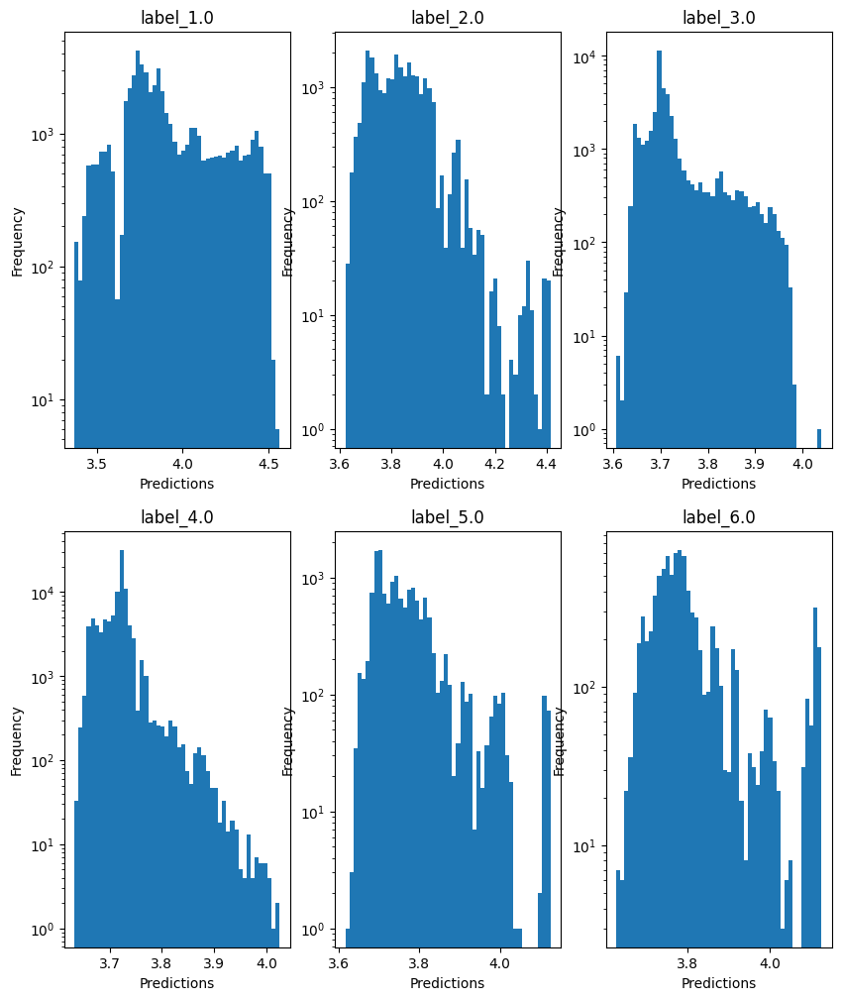

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.0124875678765508
  RMSE :  0.55356010503011
  MAE :  0.31917765404091575
  MedAE :  0.09096437835693338
  CORR :  0.8095818883794095
  MAX_ER :  3.585430902481079
  Percentiles : 
    75th percentile :  0.43346804285049434
    90th percentile :  1.0305067501068115
    95th percentile :  1.3427274727821352
    99th percentile :  1.9014077968597407

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.35000992847659496
  RMSE :  0.832163042077831
  MAE :  0.6713615037908816
  MedAE :  0.5849574146270751
  CORR :  0.6120898372154866
  MAX_ER :  2.695528434753418
  Percentiles : 
    75th percentile :  1.027788136482239
    90th percentile :  1.346304877948761
    95th percentile :  1.5365631968736644
    99th percentile :  1.9933264728260045

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3

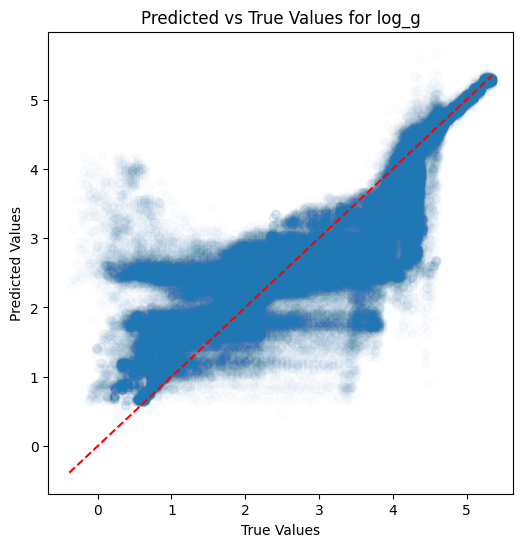

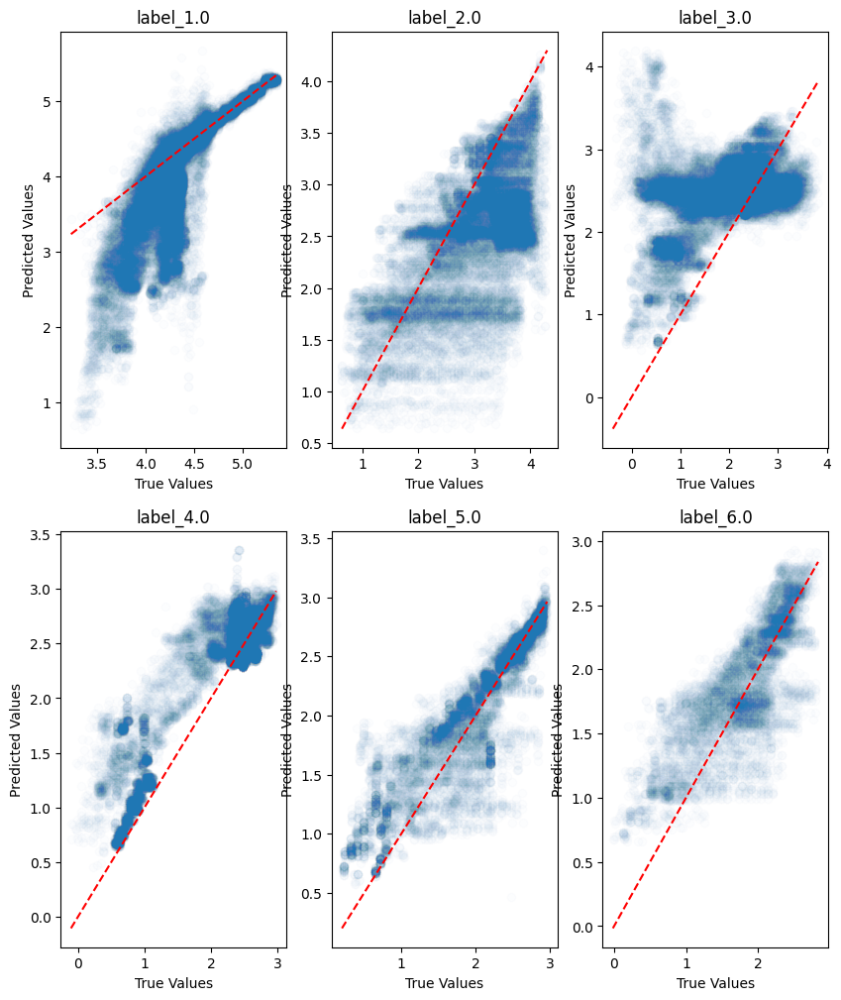

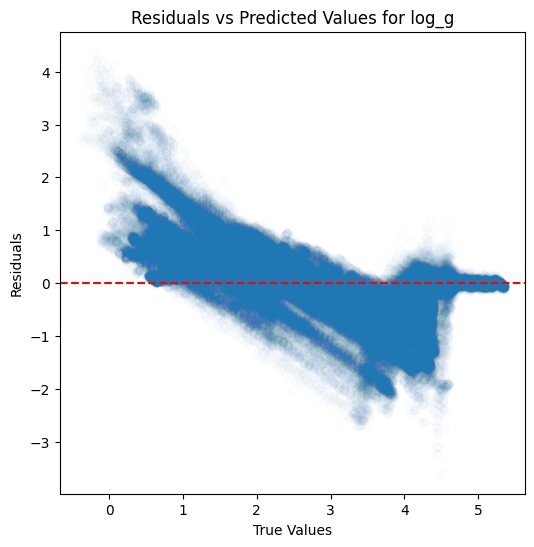

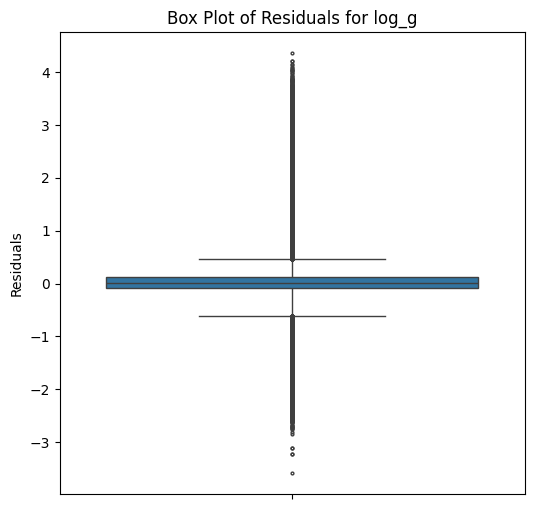

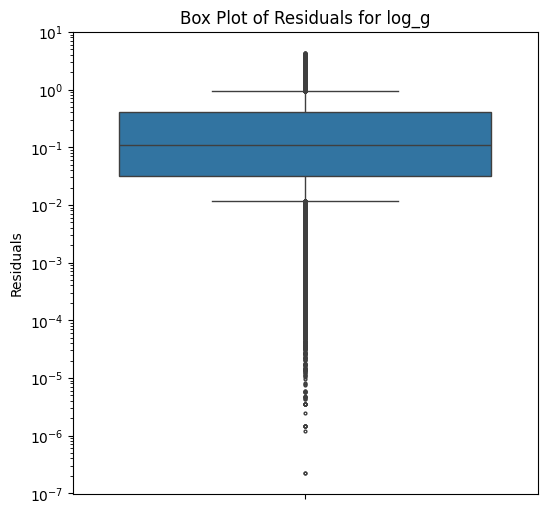

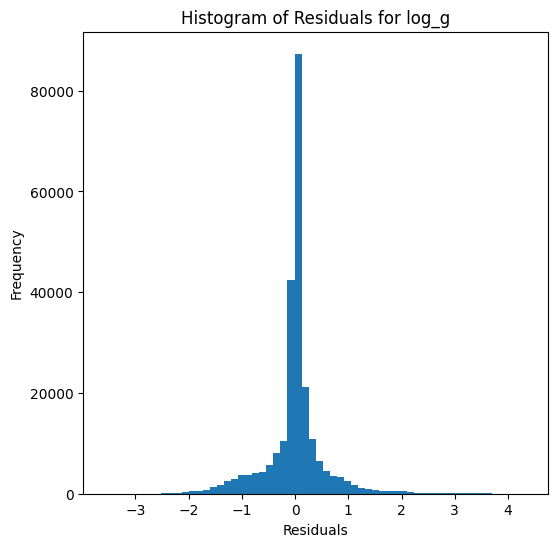

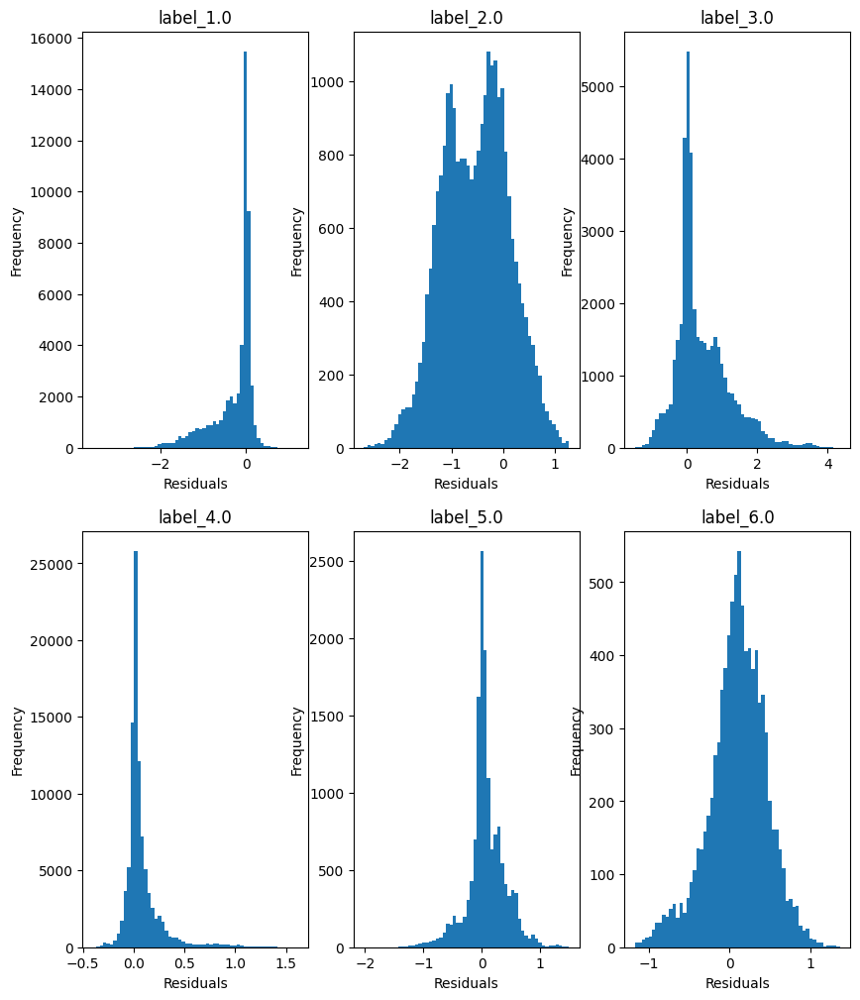

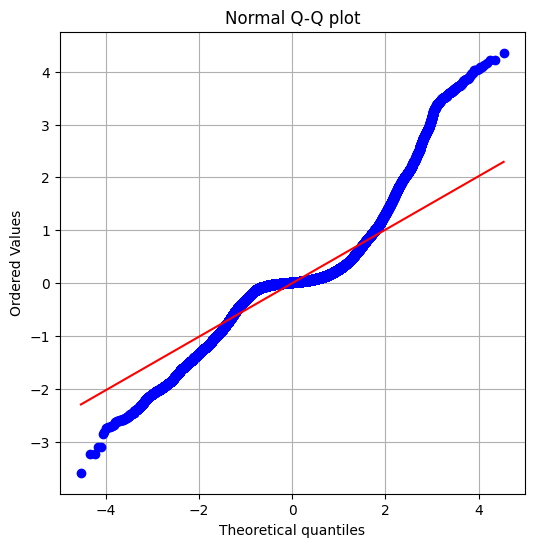

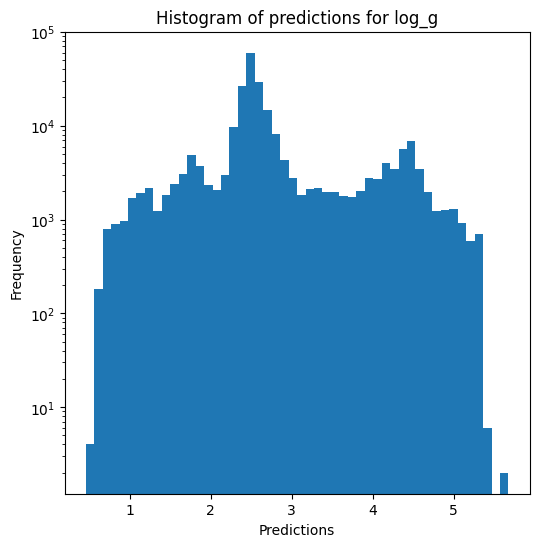

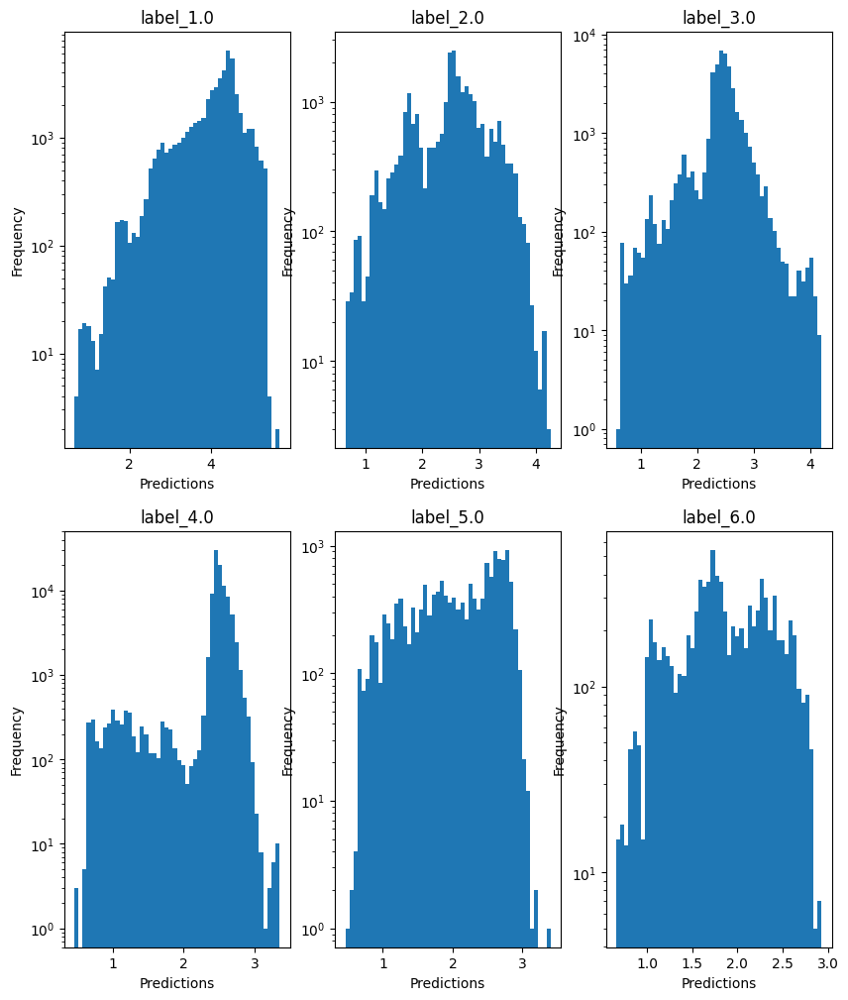


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.5662612193213132
  RMSE :  0.2767403003739343
  MAE :  0.16067151495024773
  MedAE :  0.05116864033877122
  CORR :  0.8825965510893421
  MAX_ER :  1.7067418181404244
  Percentiles : 
    75th percentile :  0.2120421031572626
    90th percentile :  0.515081469024655
    95th percentile :  0.6689247800751339
    99th percentile :  0.9576118802001651

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.6440509775938494
  RMSE :  0.41744405306674026
  MAE :  0.3365678257047855
  MedAE :  0.2929446210015452
  CORR :  0.8027978602985453
  MAX_ER :  1.3726508129754227
  Percentiles : 
    75th percentile :  0.5157462796483268
    90th percentile :  0.6751058382801288
    95th percentile :  0.7715024400169029
    99th percentile :  1.0031695465038724

radius results for the label category with a 

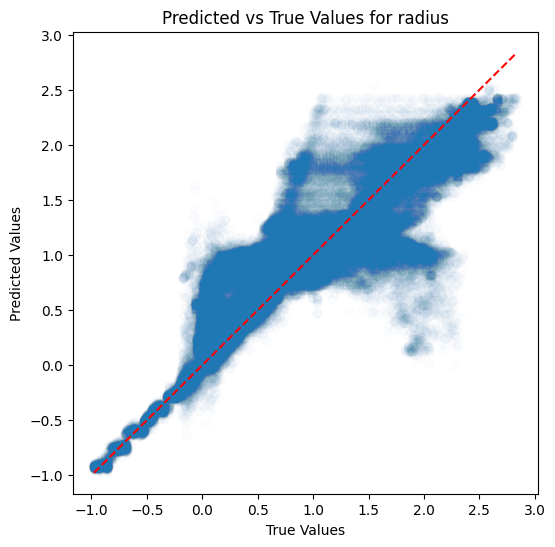

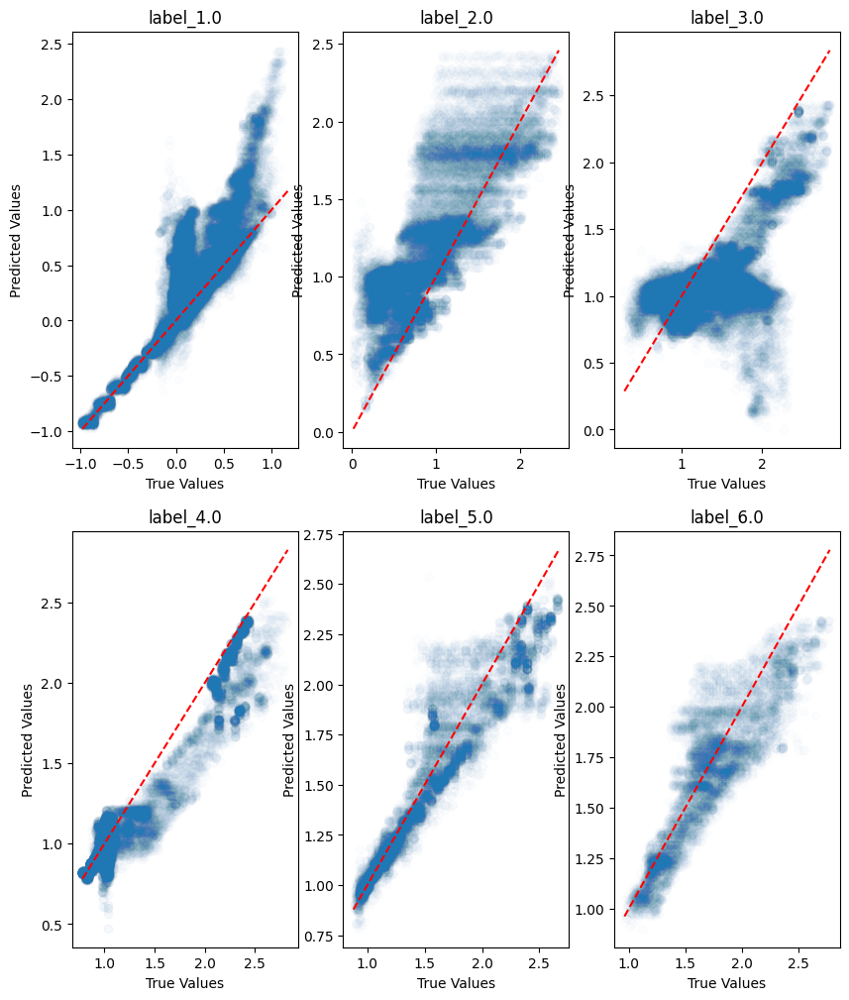

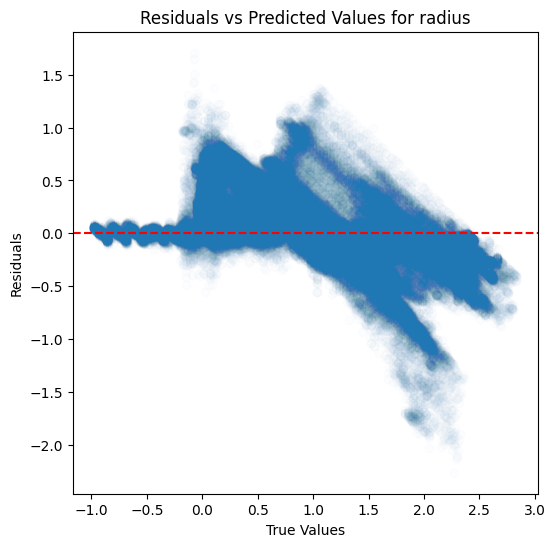

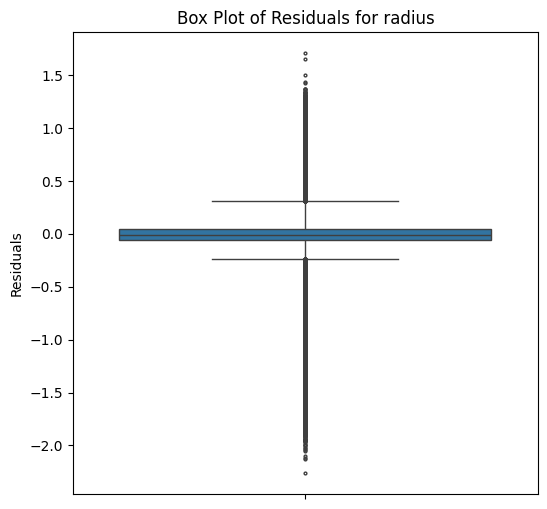

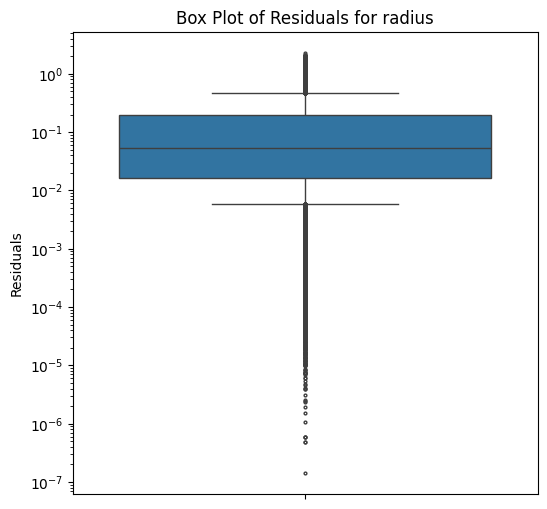

...

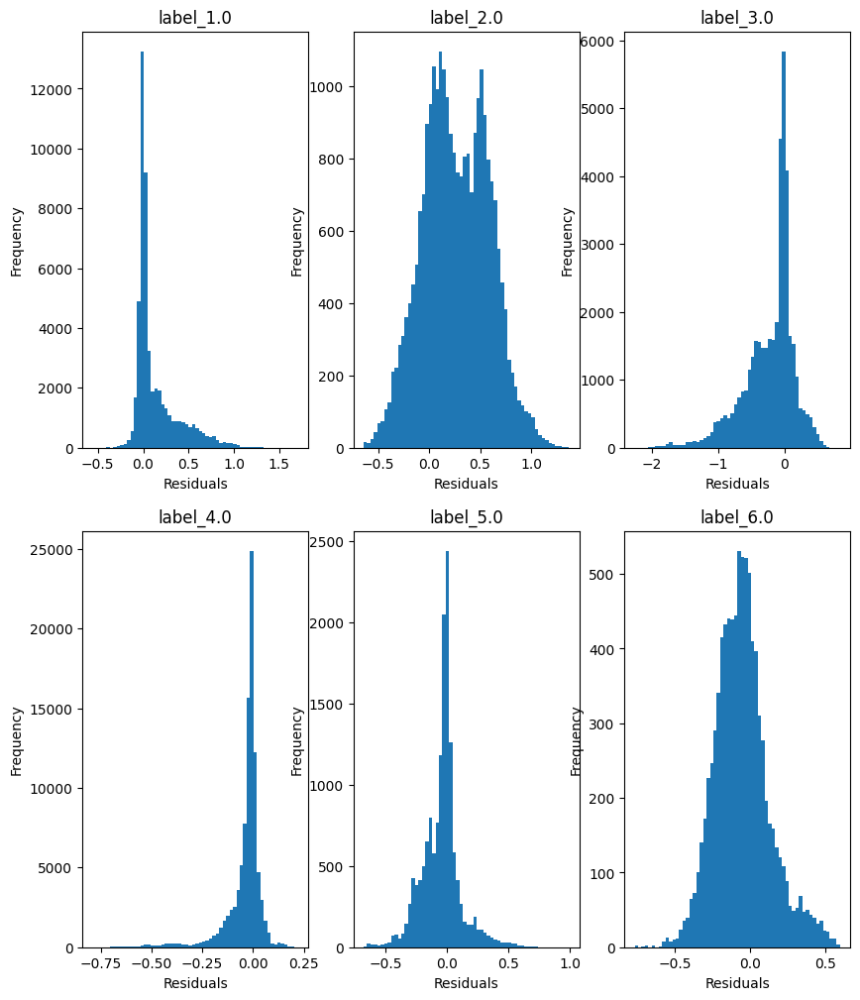

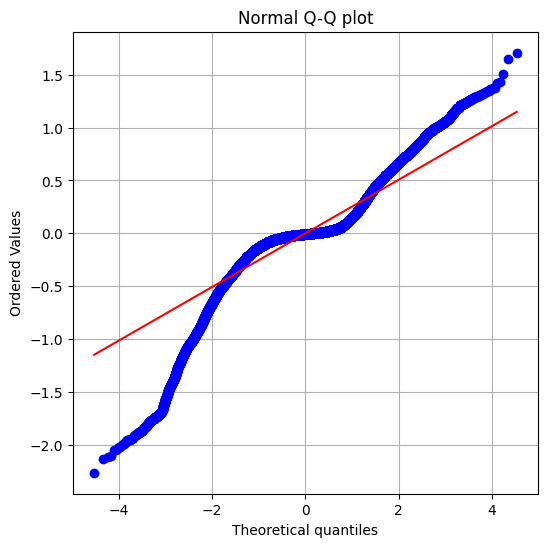

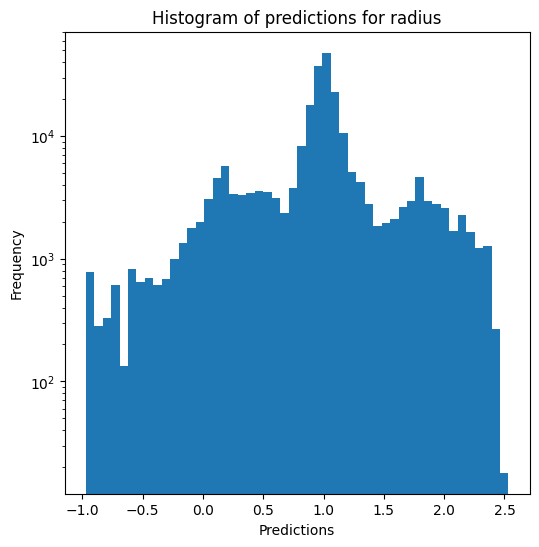

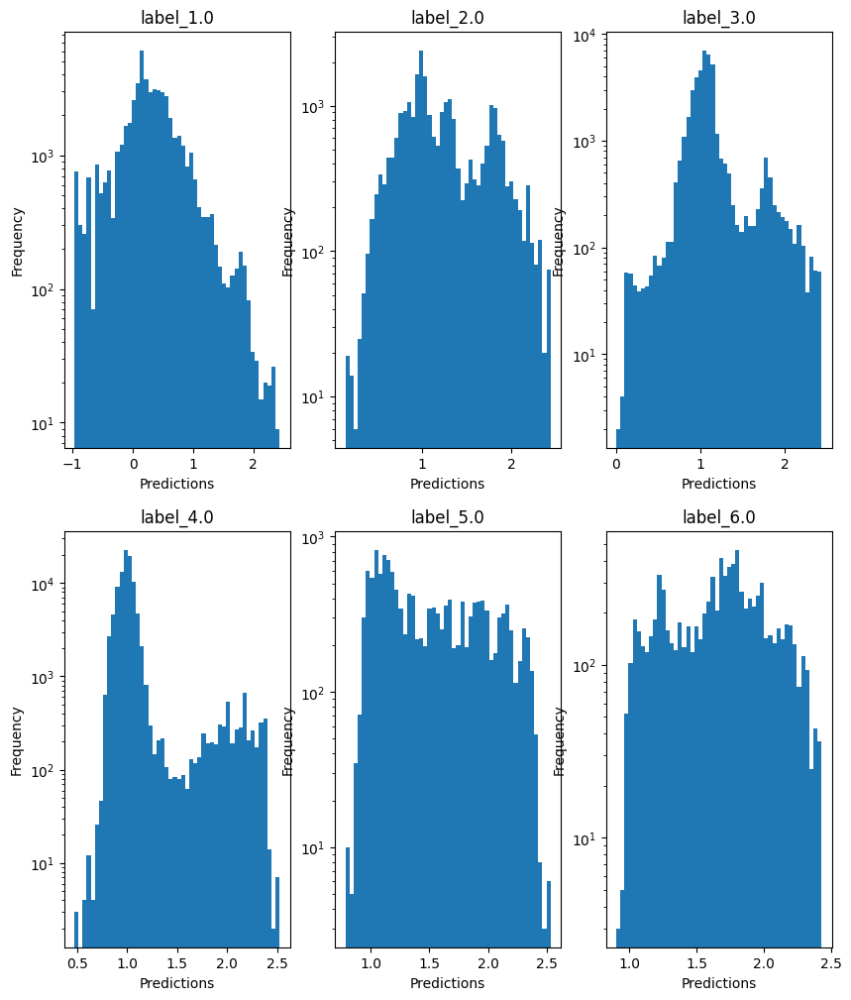

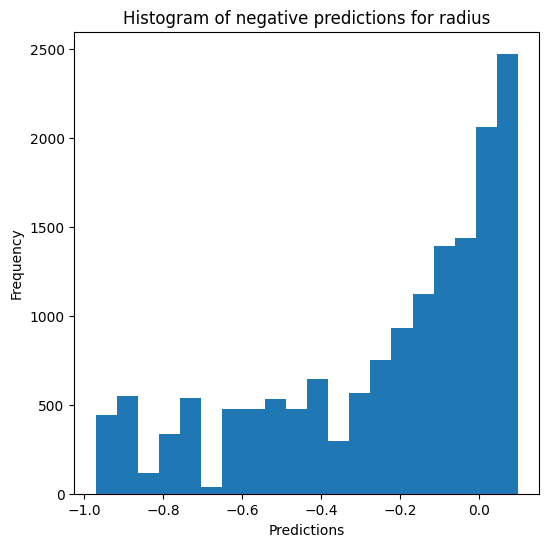

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06600834476953266
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06460683590002785
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06631538162322538
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0652908075672946
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06706224789020632

Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.8692371638286908
  RMSE :  0.10040017329622458
  MAE :  0.061531057913590564
  MedAE :  0.04116962659824108
  CORR :  0.9366907680842597
  MAX_ER :  0.7035105483537301
  Percentiles : 
    75th percentile :  0.0723305037711709
    90th percentile :  0.11812473685369418
    95th percentile :  0.17716079477049718
    99th percentile :  0.4657144766100351

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.1412756244514598
  RMSE :  0.1718018589063729
  MAE :  0.12600450340929487
  MedAE :  0.09007650214715412
  CORR :  0.4111072154318608
  MAX_ER :  0.6935567795157329
  Percentiles : 
    75th percentile :  0.17238492906176228
    90th percentile :  0.291734809973568
    95th percentile :  0.3832969218707583
    99th percentile :  0.5178023524539547

T_eff results for the la

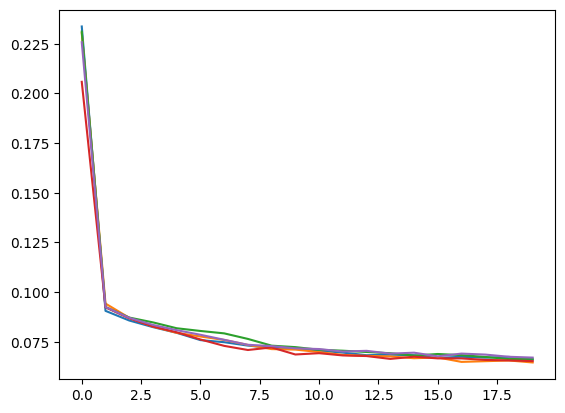

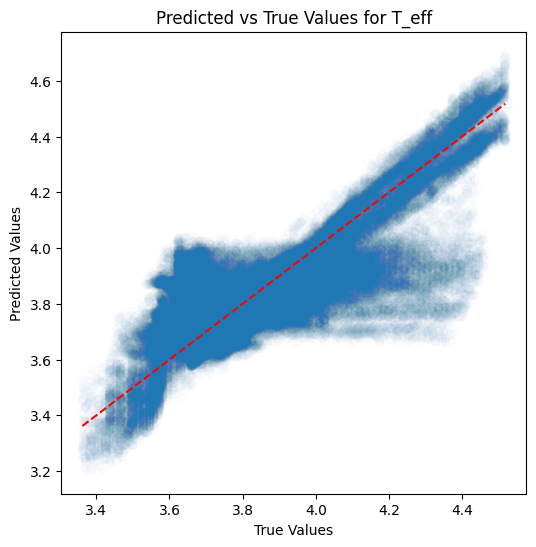

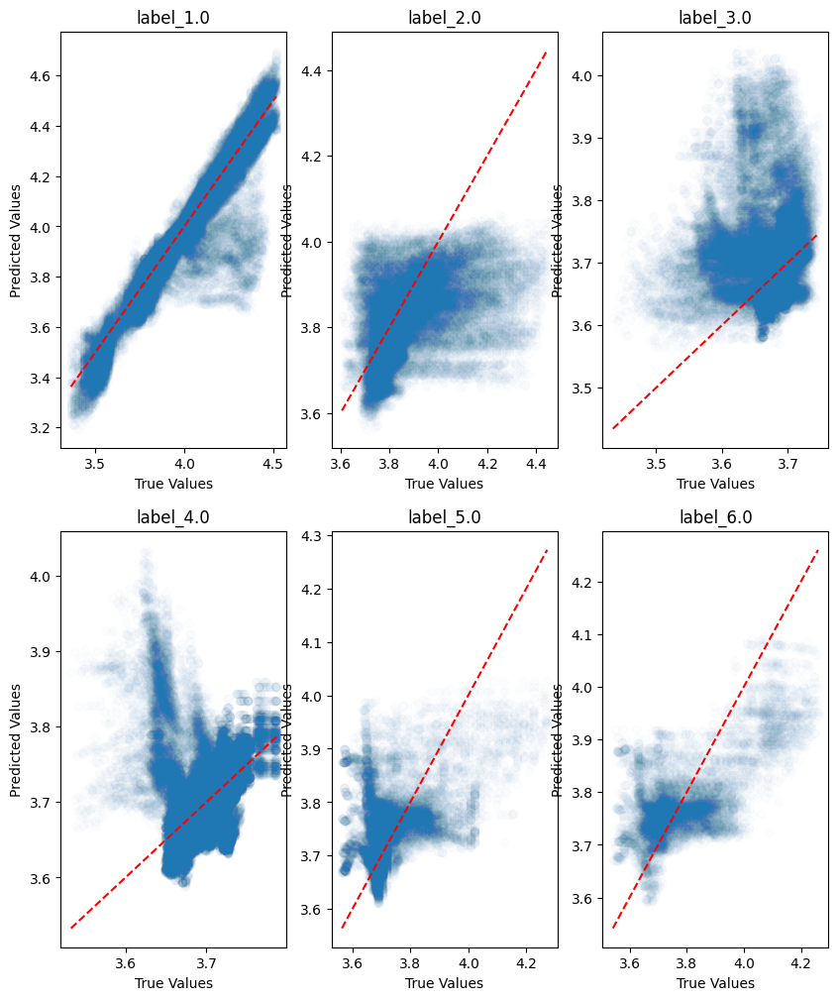

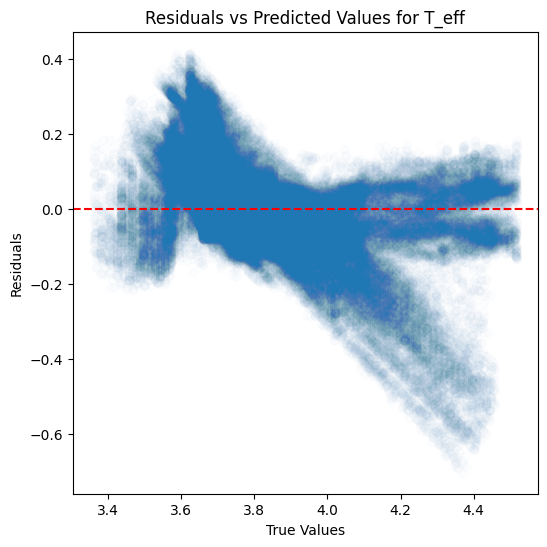

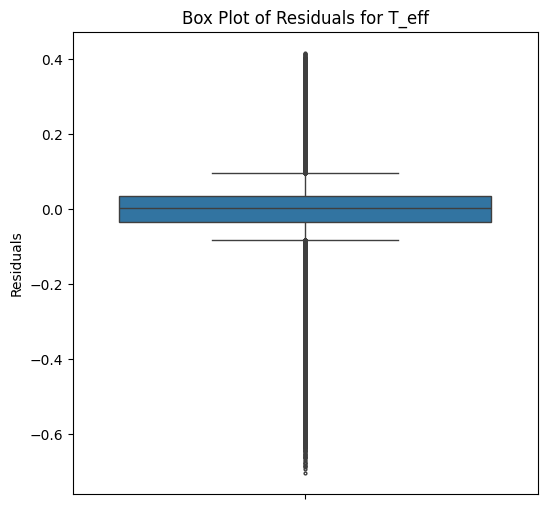

...

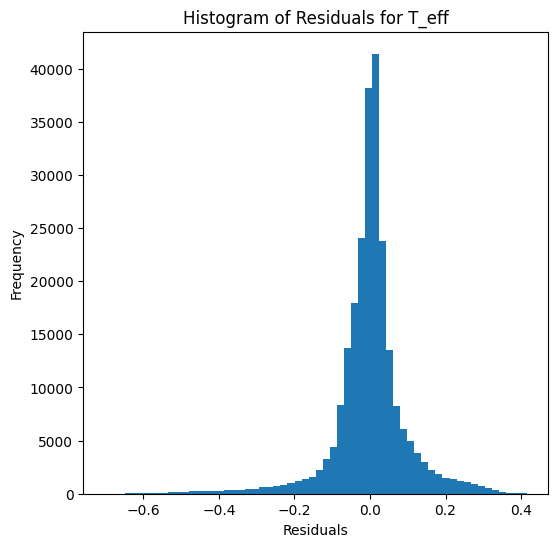

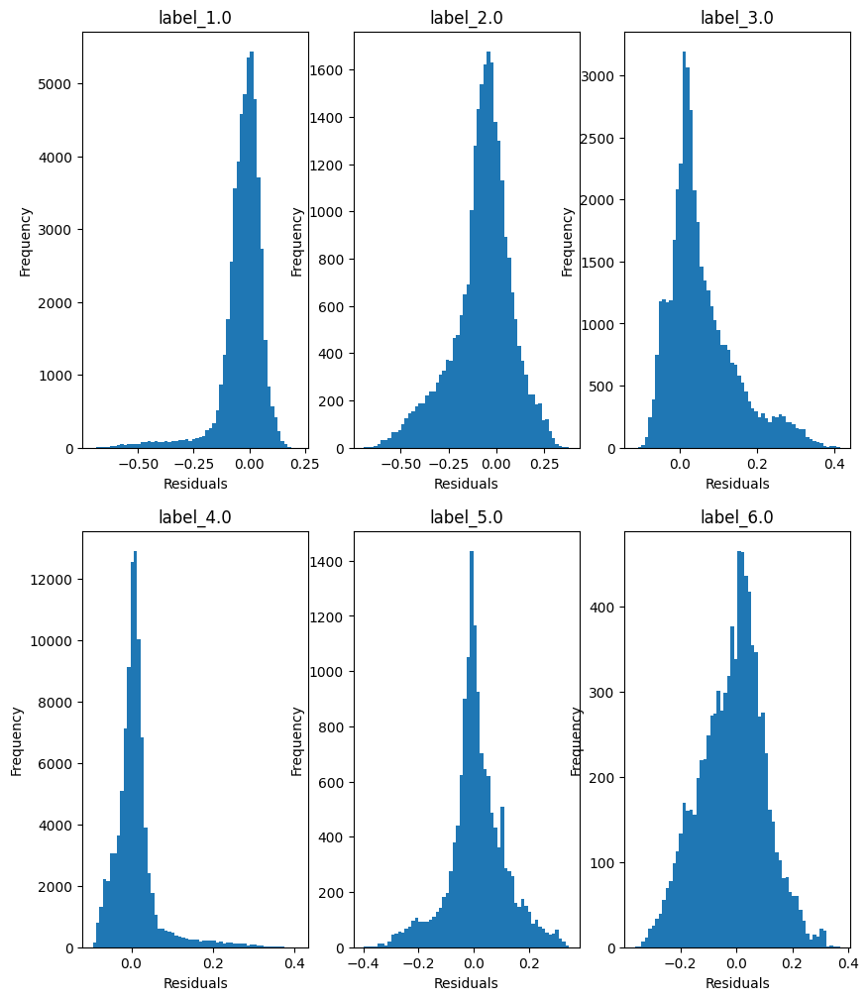

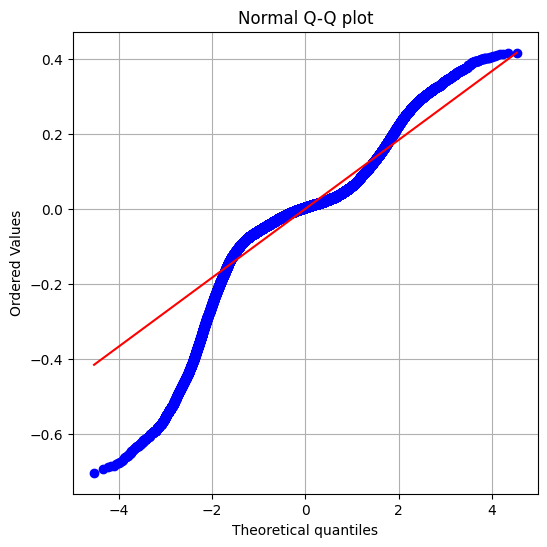

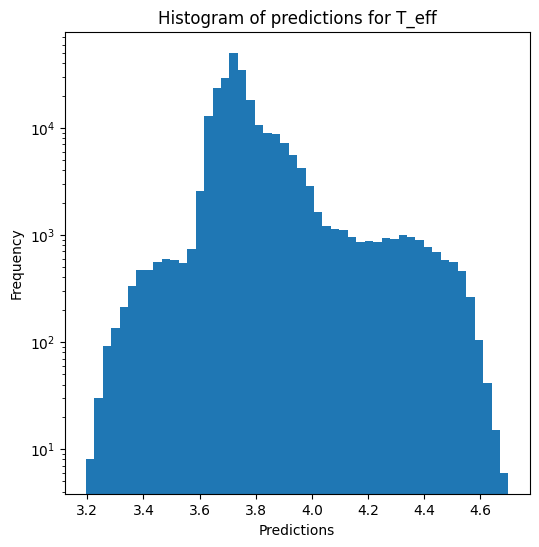

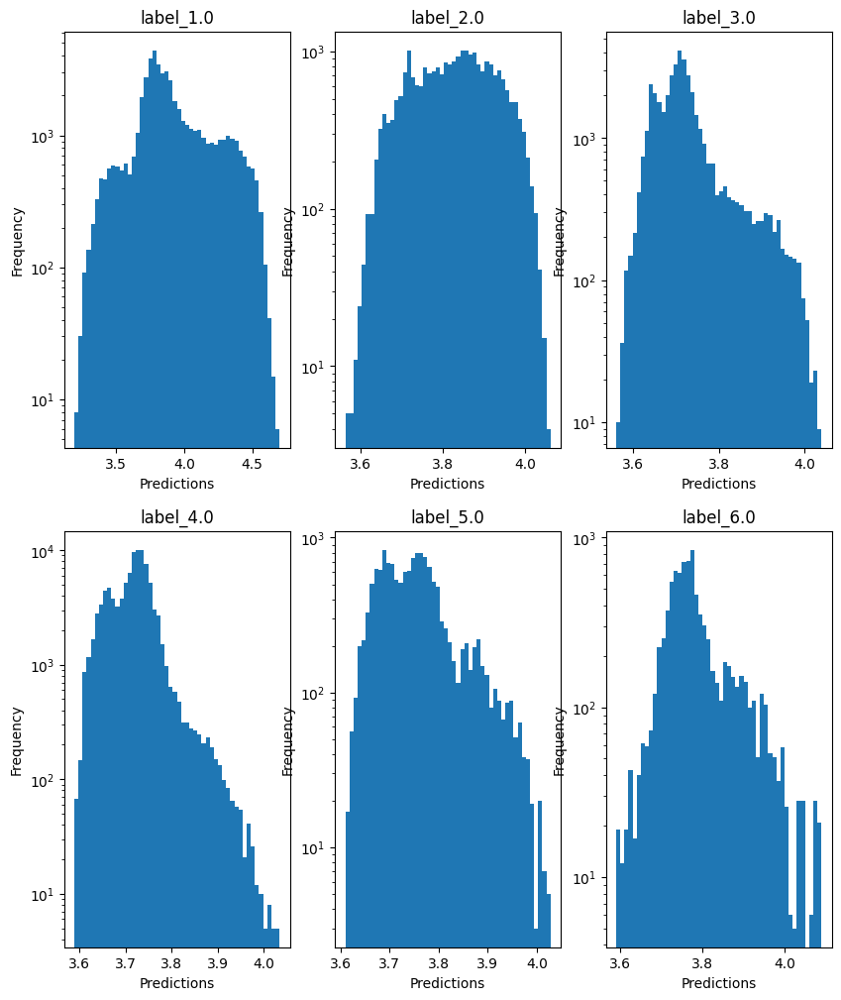

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.6751636757494193
  RMSE :  0.4799942897023201
  MAE :  0.22555897162836683
  MedAE :  0.059556554841447173
  CORR :  0.7531372733508812
  MAX_ER :  2.837975403404826
  Percentiles : 
    75th percentile :  0.1434438358179113
    90th percentile :  0.7332646585082279
    95th percentile :  1.2663567397517101
    99th percentile :  2.008072081893384

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.2872169691172122
  RMSE :  0.8428567344369781
  MAE :  0.656323273925239
  MedAE :  0.5092264690907469
  CORR :  0.5962598648492033
  MAX_ER :  2.5868687567128936
  Percentiles : 
    75th percentile :  1.0974159435208792
    90th percentile :  1.40082304882893
    95th percentile :  1.5688954525401366
    99th percentile :  2.0432643338797325

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 

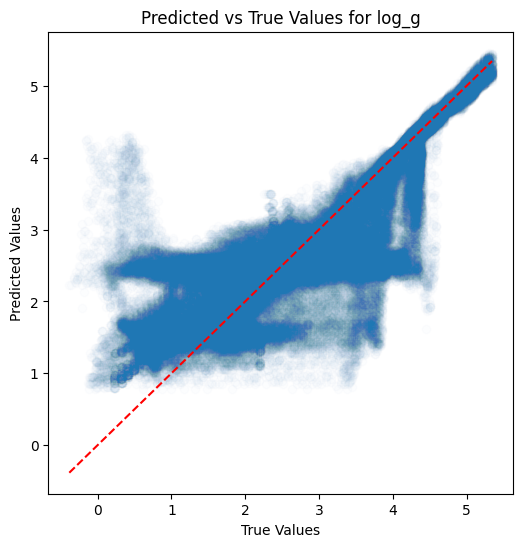

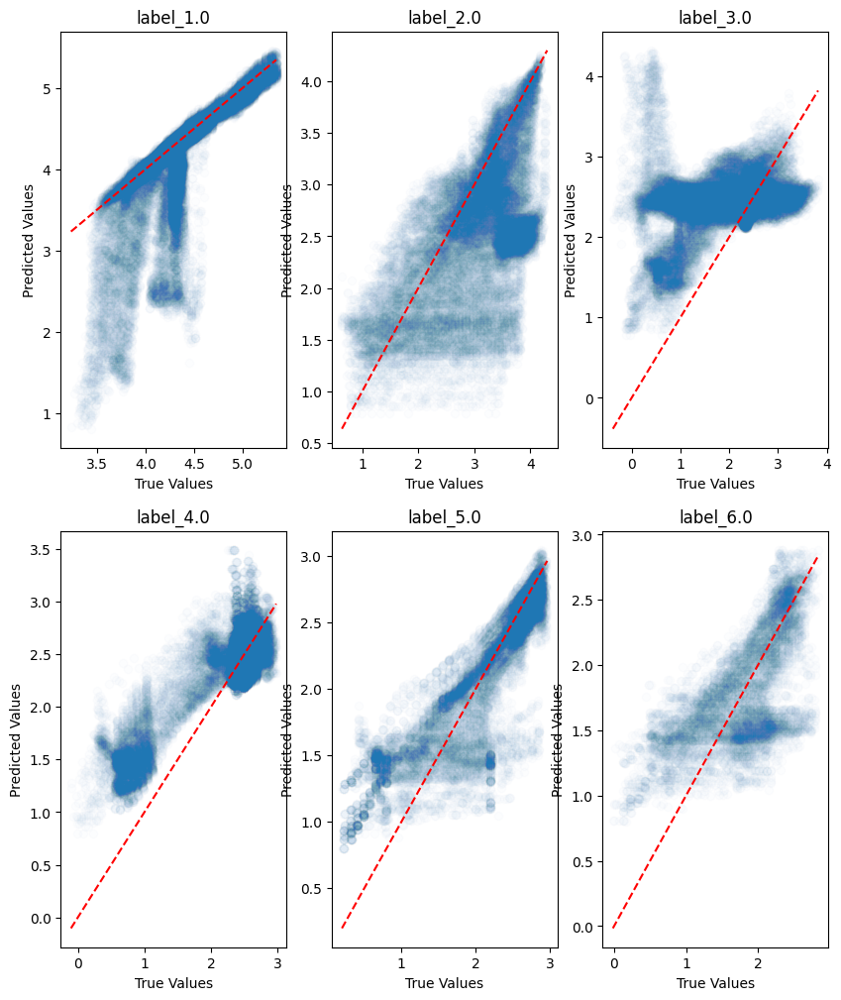

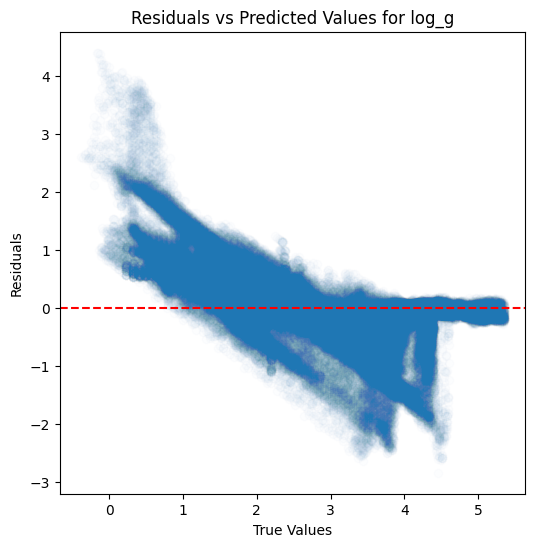

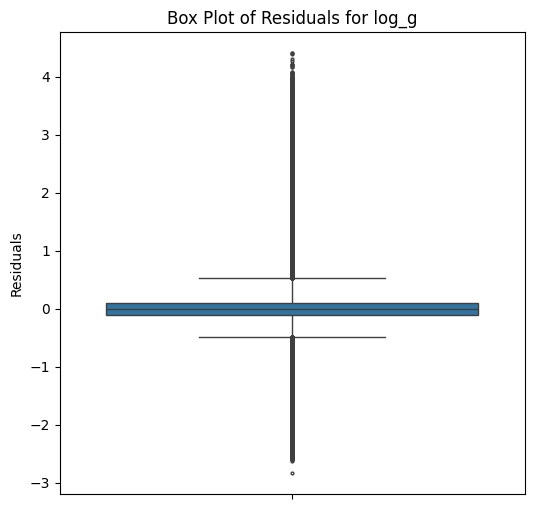

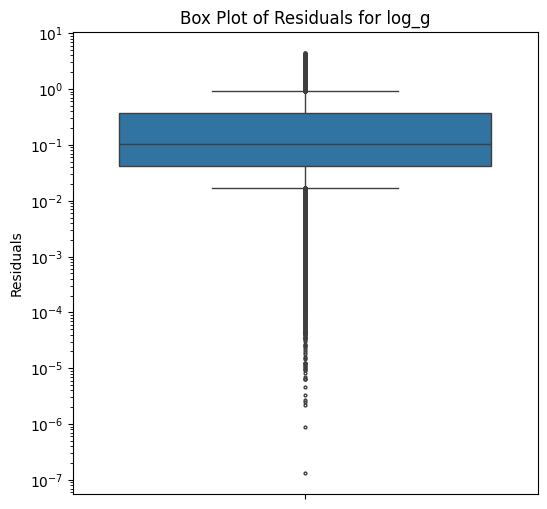

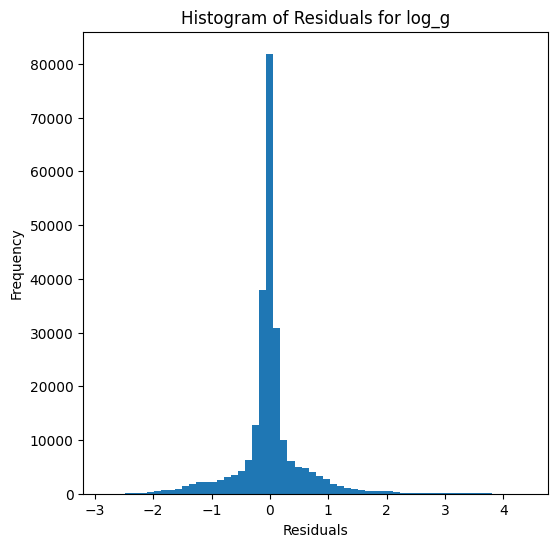

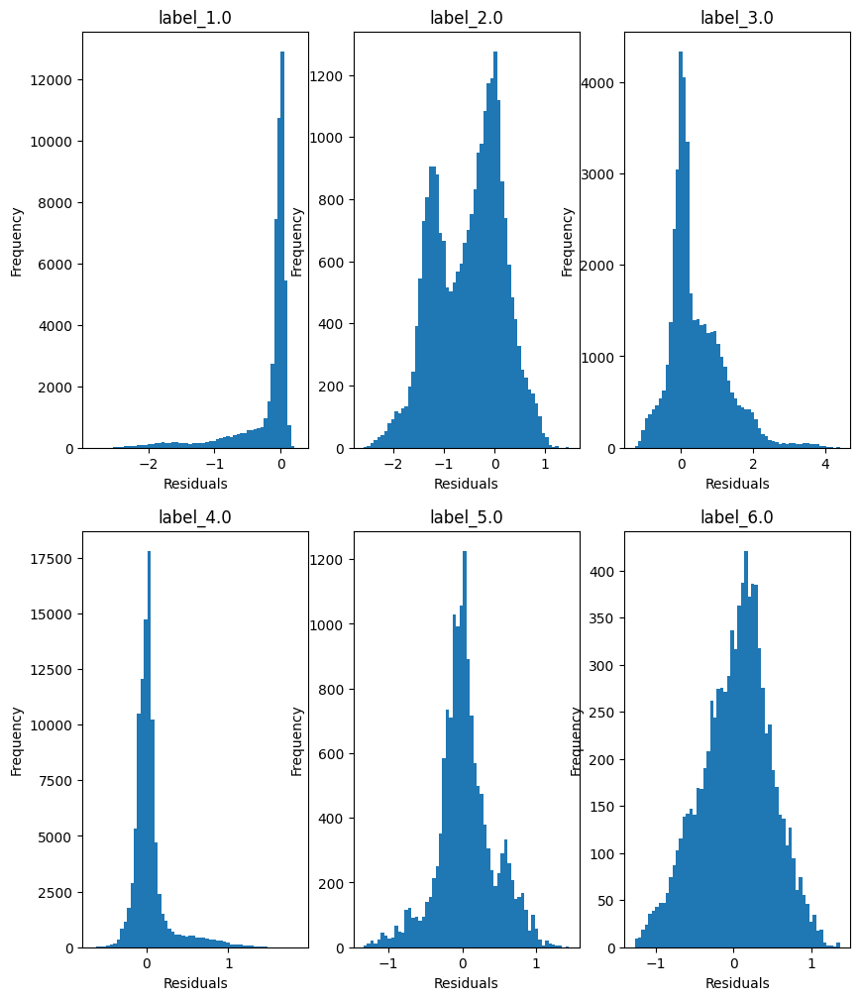

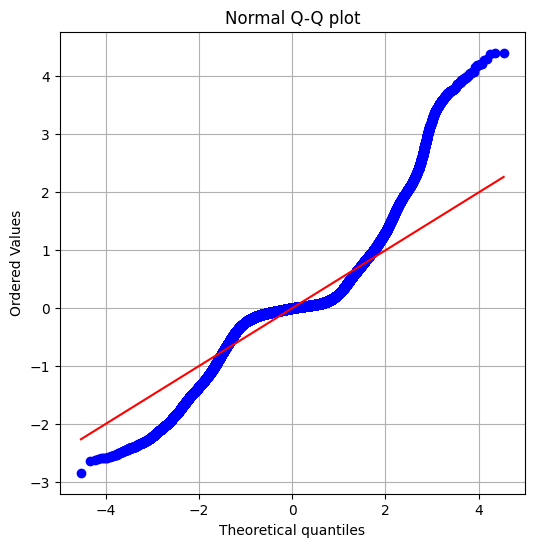

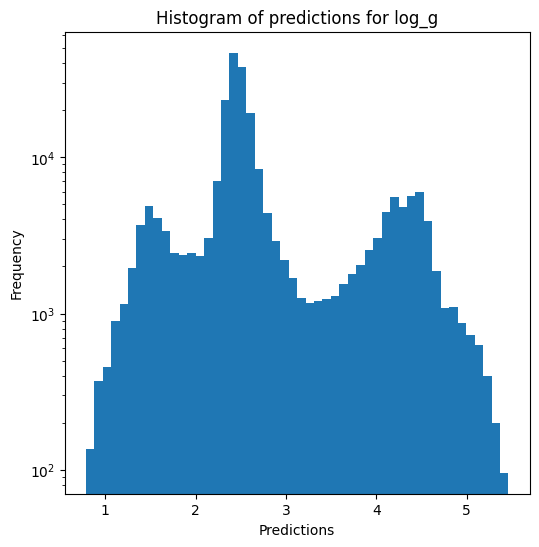

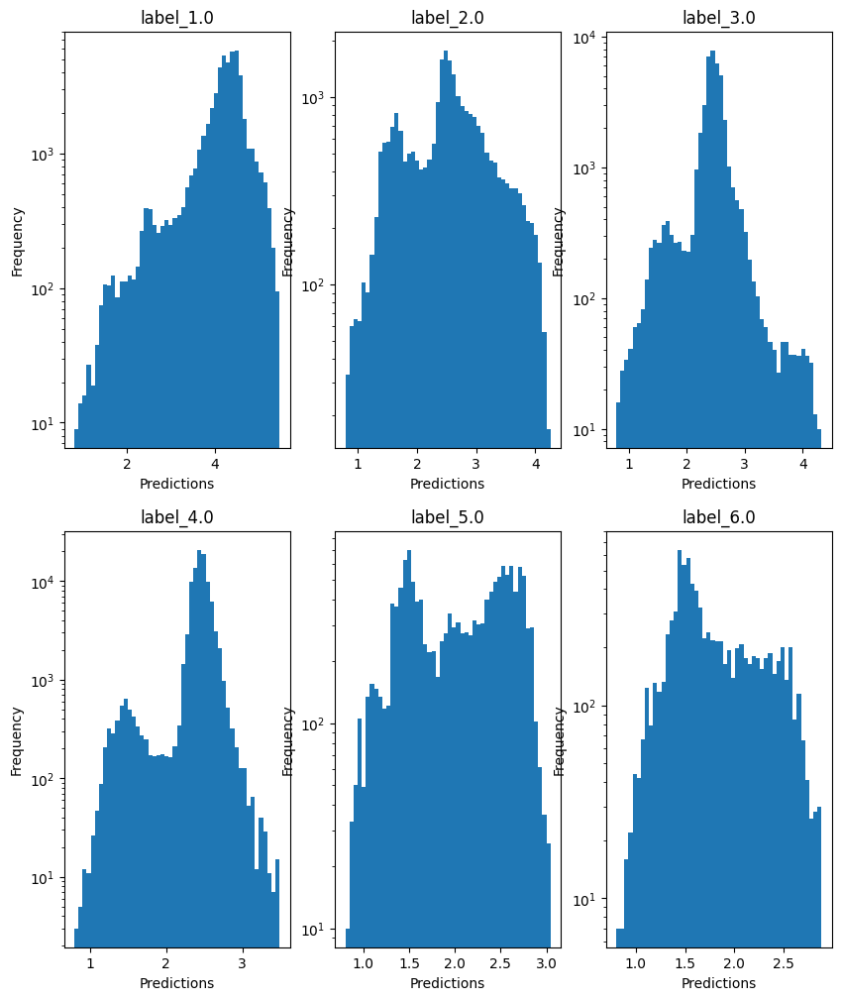


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.6475073704354485
  RMSE :  0.23940681268074096
  MAE :  0.11207947446484794
  MedAE :  0.02710274966261436
  CORR :  0.8799960122650446
  MAX_ER :  1.4059027643717696
  Percentiles : 
    75th percentile :  0.07766034703483636
    90th percentile :  0.36151027198213204
    95th percentile :  0.6303645065672316
    99th percentile :  1.0122785236010572

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.6108724255890895
  RMSE :  0.4204172351565199
  MAE :  0.32662369540414304
  MedAE :  0.25198844531578846
  CORR :  0.7885941246572536
  MAX_ER :  1.2812742052387267
  Percentiles : 
    75th percentile :  0.5474931706525885
    90th percentile :  0.6980745870115999
    95th percentile :  0.782928123553926
    99th percentile :  1.0310124627829411

radius results for the label category wit

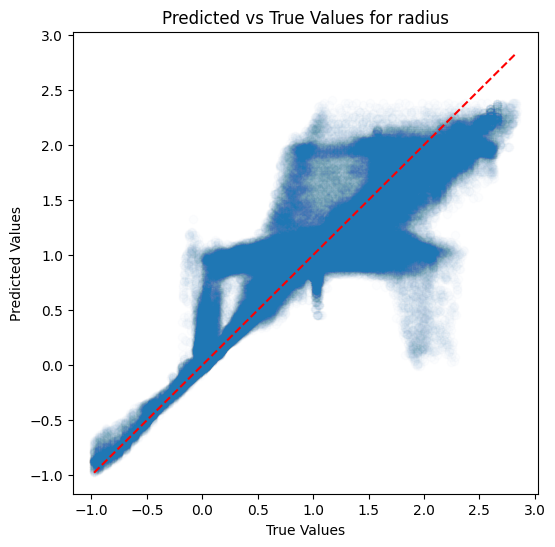

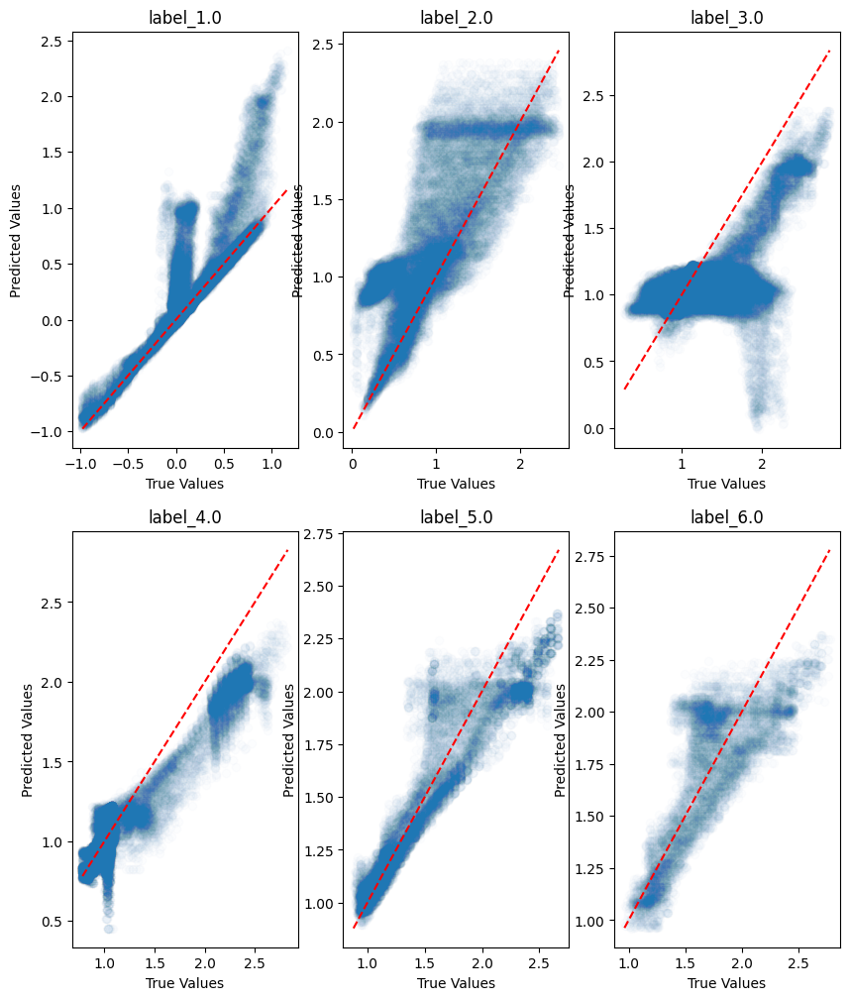

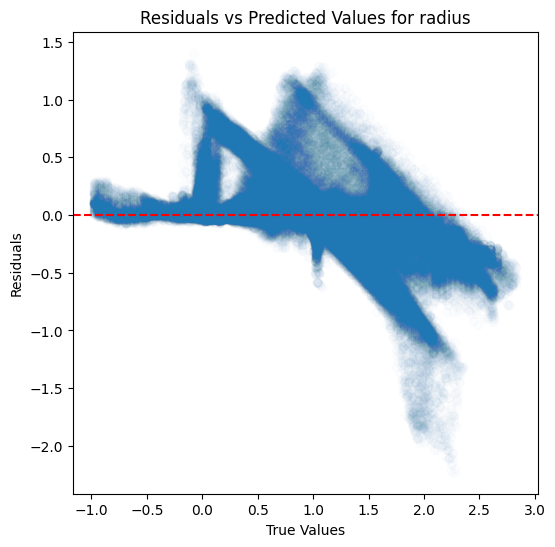

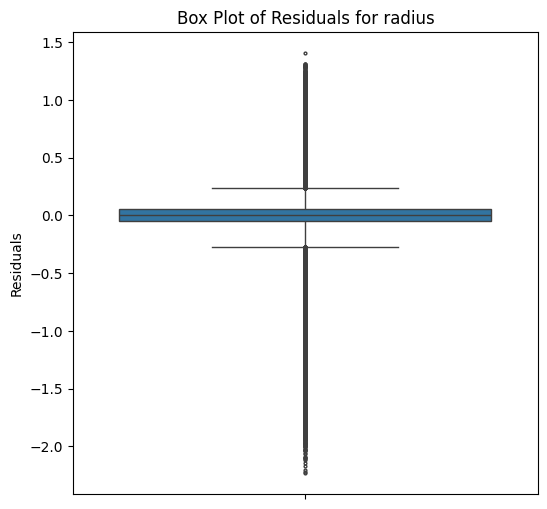

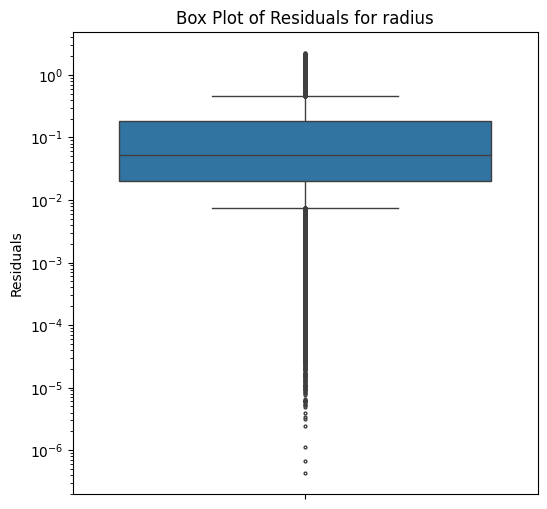

...

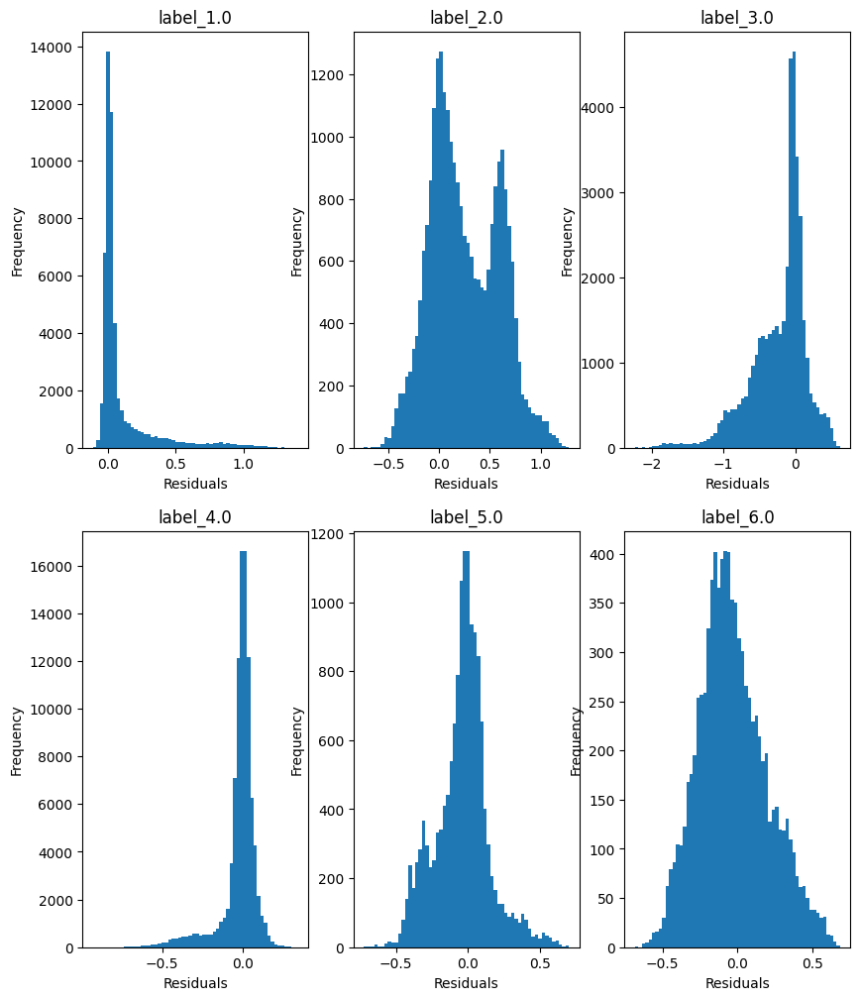

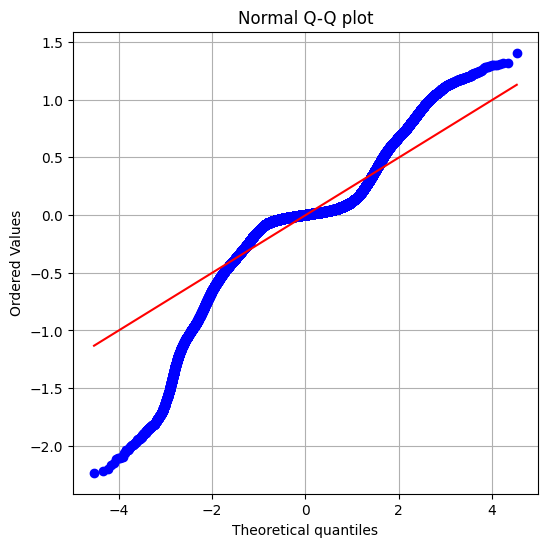

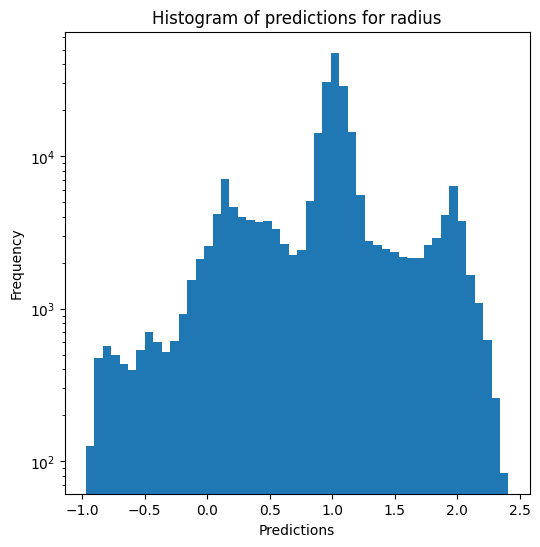

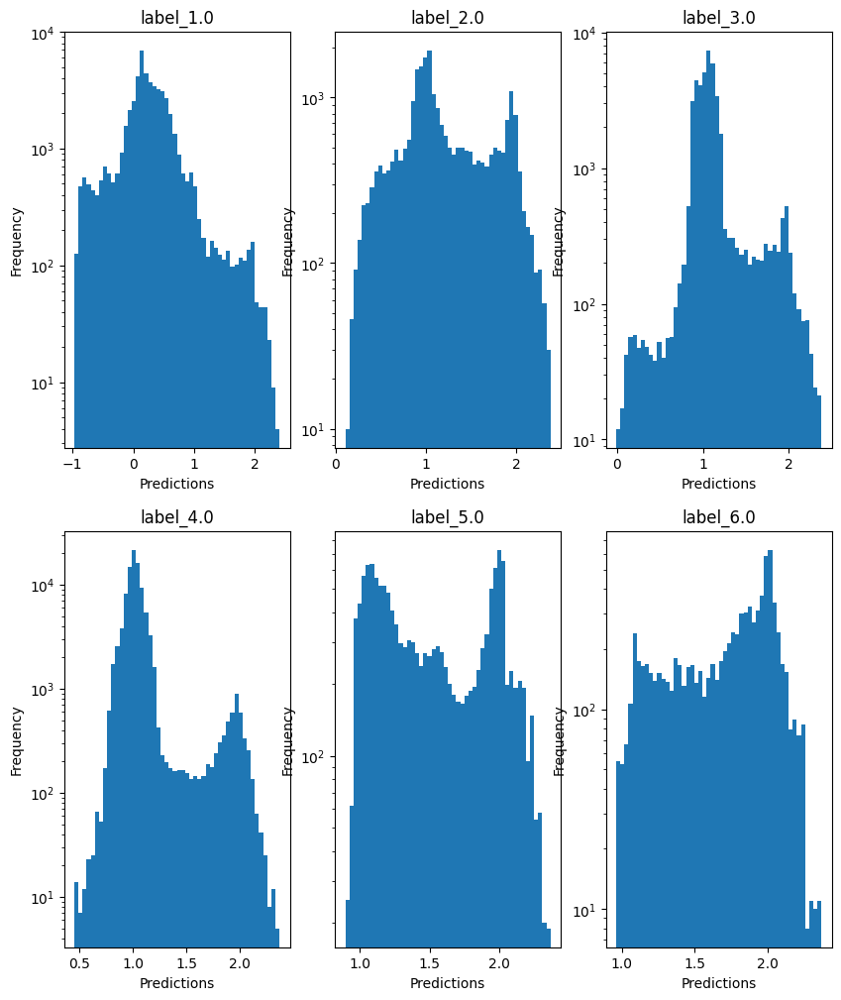

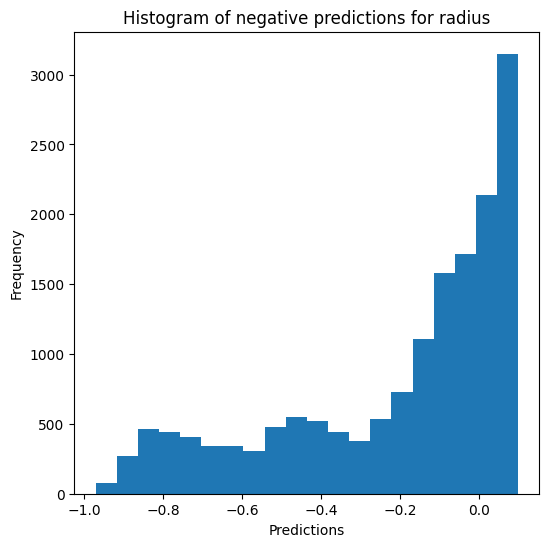

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon